# DETECCIÓN DE CÁNCER DE CUELLO UTERINO

CLASIFICADOR MULTICLASE - GRADO DEL TUMOR: G1, G2, G3, G4 O GX

In [2]:
import pandas as pd
from pandas import DataFrame
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
from sklearn.preprocessing import StandardScaler
import random

In [3]:
df_C = pd.read_csv('df_clinical.csv', sep=';')
df_C = df_C.drop('Unnamed: 0', axis=1)
df_C

,age_at_index,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_t,ajcc_pathologic_m,...,initial_disease_status,number_of_cycles,therapeutic_agents,treatment_anatomic_site,treatment_dose,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_outcome,treatment_type
0,63,1,2,0,1944,63,2,2,6,2,...,0,4,1,1,43,0,1,0,0,3
1,63,1,2,0,1947,63,2,2,6,2,...,0,3,1,2,1428,0,0,1,0,4
2,63,1,2,0,1947,63,2,2,6,2,...,0,4,1,2,45,0,0,1,0,4
3,63,1,2,0,1945,63,2,2,6,2,...,0,4,1,3,4500,0,0,1,0,5
4,63,1,2,0,1949,63,2,2,6,2,...,0,3,1,0,2500,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1929,60,1,2,0,1953,49,2,2,9,2,...,0,3,1,2,538,0,0,1,1,4
1930,60,1,2,0,1949,43,2,2,9,2,...,0,4,1,1,42,0,1,0,0,3
1931,60,1,2,0,1953,43,2,2,9,2,...,0,3,1,1,39,0,0,0,1,3
1932,41,0,2,0,1971,41,2,2,10,0,...,0,3,1,1,477,0,0,1,0,3


'Tumor grade' será la variable objetivo a predecir de manera multiclase

## Análisis exploratorio de los datos (EDA)

#### Tamaño del dataset de trabajo

In [4]:
df_C.shape

(1934, 35)

#### Información de las variables

In [5]:
df_C.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1934 entries, 0 to 1933
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   age_at_index                 1934 non-null   int64
 1   ethnicity                    1934 non-null   int64
 2   race                         1934 non-null   int64
 3   vital_status                 1934 non-null   int64
 4   year_of_birth                1934 non-null   int64
 5   age_at_diagnosis             1934 non-null   int64
 6   ajcc_clinical_m              1934 non-null   int64
 7   ajcc_clinical_n              1934 non-null   int64
 8   ajcc_clinical_t              1934 non-null   int64
 9   ajcc_pathologic_m            1934 non-null   int64
 10  ajcc_pathologic_n            1934 non-null   int64
 11  ajcc_pathologic_t            1934 non-null   int64
 12  classification_of_tumor      1934 non-null   int64
 13  days_to_diagnosis            1934 non-null   int

#### Valores NaN por variable

In [6]:
df_C.isna().sum()

age_at_index                   0
ethnicity                      0
race                           0
vital_status                   0
year_of_birth                  0
age_at_diagnosis               0
ajcc_clinical_m                0
ajcc_clinical_n                0
ajcc_clinical_t                0
ajcc_pathologic_m              0
ajcc_pathologic_n              0
ajcc_pathologic_t              0
classification_of_tumor        0
days_to_diagnosis              0
days_to_last_follow_up         0
figo_stage                     0
icd_10_code                    0
morphology                     0
pregnant_at_diagnosis          0
primary_diagnosis              0
prior_malignancy               0
site_of_resection_or_biopsy    0
tumor_grade                    0
days_to_treatment_end          0
days_to_treatment_start        0
initial_disease_status         0
number_of_cycles               0
therapeutic_agents             0
treatment_anatomic_site        0
treatment_dose                 0
treatment_

#### Análisis estadístico de las variables

In [7]:
df_C.describe().T

,count,mean,std,min,25%,50%,75%,max
age_at_index,1934.0,48.682523,12.077973,19.0,40.0,48.0,57.0,88.0
ethnicity,1934.0,0.859359,0.347741,0.0,1.0,1.0,1.0,1.0
race,1934.0,2.526887,0.921127,0.0,2.0,2.0,4.0,4.0
vital_status,1934.0,0.388831,0.487611,0.0,0.0,0.0,1.0,1.0
year_of_birth,1934.0,1959.355222,11.801053,1917.0,1952.0,1962.0,1968.0,1987.0
age_at_diagnosis,1934.0,47.879524,10.911508,20.0,41.0,47.0,54.0,88.0
ajcc_clinical_m,1934.0,1.675801,0.733405,0.0,2.0,2.0,2.0,2.0
ajcc_clinical_n,1934.0,1.698035,0.686750,0.0,2.0,2.0,2.0,2.0
ajcc_clinical_t,1934.0,7.484488,2.648491,0.0,6.0,8.0,10.0,10.0
ajcc_pathologic_m,1934.0,1.750776,0.653643,0.0,2.0,2.0,2.0,2.0


#### Estudio de correlación

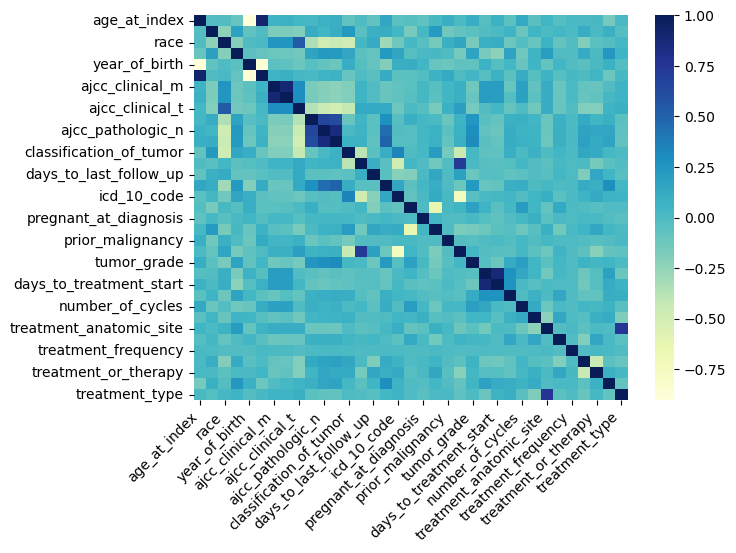

In [8]:
plt.figure(figsize=(7,5))
corr_matrix = df_C.corr(method='pearson')

heatmap = sns.heatmap(corr_matrix, annot=False, cmap="YlGnBu")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha="right")
plt.show()

#### Pares de variables con correlación alta

In [9]:
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)) # Parte superior de la matriz (sin duplicados)

high_corr = [(col, row) for col in upper_triangle.columns for row in upper_triangle.index if abs(upper_triangle[col][row]) > 0.8]

for col, row in high_corr:
    print(f"'{col}' and '{row}' correlation = {upper_triangle[col][row]:.2f}\n")

'year_of_birth' and 'age_at_index' correlation = -0.90

'age_at_diagnosis' and 'age_at_index' correlation = 0.92

'age_at_diagnosis' and 'year_of_birth' correlation = -0.87

'ajcc_clinical_n' and 'ajcc_clinical_m' correlation = 0.89

'ajcc_pathologic_t' and 'ajcc_pathologic_n' correlation = 0.85

'days_to_treatment_start' and 'days_to_treatment_end' correlation = 0.88



#### Correlaciones con la variable objetivo 'tumor_grade'

In [10]:
correlation_with_tumor_grade = df_C.corr()['tumor_grade']
correlation_with_tumor_grade

age_at_index                   0.104577
ethnicity                     -0.054075
race                          -0.164933
vital_status                   0.161505
year_of_birth                 -0.074632
age_at_diagnosis               0.045252
ajcc_clinical_m               -0.129053
ajcc_clinical_n               -0.098585
ajcc_clinical_t               -0.152489
ajcc_pathologic_m              0.242383
ajcc_pathologic_n              0.291658
ajcc_pathologic_t              0.313723
classification_of_tumor        0.026568
days_to_diagnosis              0.015948
days_to_last_follow_up        -0.108960
figo_stage                     0.229225
icd_10_code                   -0.036889
morphology                     0.186325
pregnant_at_diagnosis          0.021131
primary_diagnosis             -0.153927
prior_malignancy              -0.039821
site_of_resection_or_biopsy    0.040084
tumor_grade                    1.000000
days_to_treatment_end         -0.034754
days_to_treatment_start       -0.120483


In [11]:
high_corr_tumor_grade = pd.DataFrame(list(correlation_with_tumor_grade.items()),
                                             columns=['variable', 'correlation_with_tumor_grade'])

top_4 = high_corr_tumor_grade.nlargest(4, 'correlation_with_tumor_grade')
top_4

,variable,correlation_with_tumor_grade
22,tumor_grade,1.000000
11,ajcc_pathologic_t,0.313723
10,ajcc_pathologic_n,0.291658
9,ajcc_pathologic_m,0.242383


**Conclusiones de la matriz de correlación de Pearson**

Los pares de variables que mayor correlación presentan son:
* 'age_at_diagnosis' - 'age_at_index': r = 0,92
* 'year_of_birth' - 'age_at_index': r = -0,90
* 'ajcc_clinical_n' - 'ajcc_clinical_m': r = 0,89
* 'days_to_treatment_start' - 'days_to_treatment_end': r = 0,88

Las variables predictoras con mayor correlación con la variable objetivo 'tumor_grade' son 'ajcc_pathologic_t' (r=0,31), 'ajcc_pathologic_n' (r=0,29) y 'ajcc_pathologic_m' (r=0,24). Dado que se trata de coeficientes menores a 0,5, la correlación existente entre dichas variables es débil, por lo que se puede concluir que las variables predictoras nombradas pueden tener cierto impacto en el grado del tumor, pero no son completamente determinantes.

#### Distribución de los valores que toma la variable dependiente

In [12]:
df_C['tumor_grade'].value_counts()

tumor_grade
1    1116
2     644
0     134
3      29
4      11
Name: count, dtype: int64

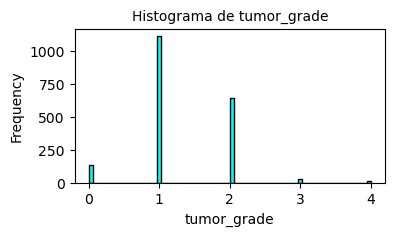

In [13]:
plt.figure(figsize=(4,2))
target = 'tumor_grade'

df_C[target].plot.hist(bins = 70, color='cyan', edgecolor='black')
plt.title(f'Histograma de {target}', fontsize = 10)
plt.xlabel(f'{target}')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.show()

Aproximadamente el 57% de los registros pertencen a la clase 1 (G2: 1.116 registros), el 33% a la clase 2 (G3: 644 registros), el 7% a la clase 0 (G1: 134 registros), el 2% a la clase 3 (G4: 29 registros) y el 1% a la clase 4 (GX: 11 registros).

En el gráfico anterior se puede observar el gran desbalance existente entre las posibles categorías de la clasificación multiclase, con una gran predominancia de la clase 1.

#### Distribución de los valores que toma cada variable predictora

In [14]:
vars_pred = df_C.drop(['tumor_grade'], axis=1)
colors = ['#%06X' % random.randint(0, 0xFFFFFF) for v in range(len(vars_pred))]

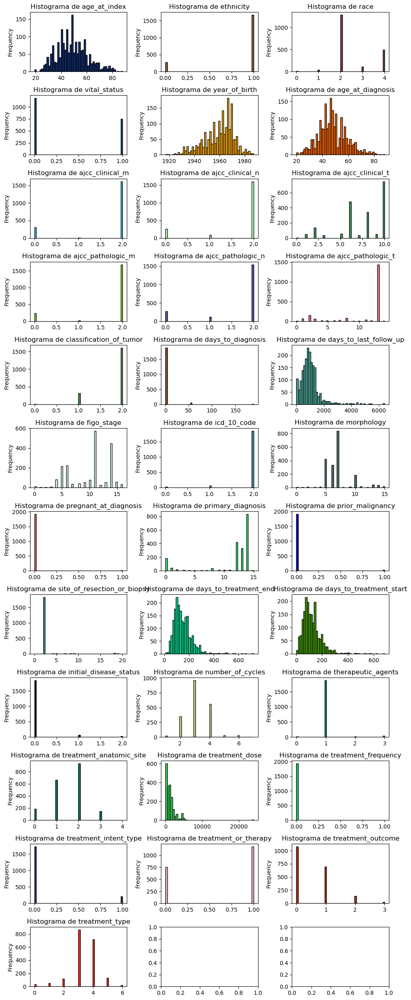

In [15]:
fig, axes = plt.subplots(nrows=12, ncols=3, figsize=(10,25))

for var, c, ax in zip(vars_pred, colors, axes.flatten()):

    df_C[var].plot.hist(bins = 50, color=c, edgecolor='black', ax=ax)
    ax.set_title(f'Histograma de {var}')
    ax.grid(False)

plt.tight_layout()
plt.show()

 **VARIABLES CONTINUAS**
- **age_at_index:** rango de 19 a 88, con predominancia entre los 40 y 57 años.
- **year_of_birth:** rango de 1917 a 1987, con predominancia entre los años 1952 y 1968.
- **age_at_diagnosis:** rango de 20 a 88, con predominancia entre los 41 y 54 años.
- **days_to_last_follow_up:** rango de 0 a 6.408, con predominancia entre los 576 y 1.228 días.
- **days_to_treatment_end:** rango de 10 a 722, con predominancia entre los 98 y 183 días.
- **days_to_treatment_start:** rango de 1 a 684, con predominancia entre los 72 y 149 días.
- **number_of_cycles:** rango de 1 a 7, con predominancia entre 3 y 4 ciclos.
- **treatment_dose:** rango de 0 a 24.000, con predominancia entre 50 y 1.569 centigrays (cGy).

**VARIABLES CATEGÓRICAS**
- **ethnicity:** 2 clases, predominancia de la clase 1 (not hispanic or latino).
- **race:** 5 clases, predominancia de la clase 2 (black or african american).
- **vital_status:** 2 clases, predominancia de la clase 0 (alive).
- **ajcc_clinical_m:** 3 clases, predominancia de la clase 2 (MX).
- **ajcc_clinical_n:** 3 clases, predominancia de la clase 2 (NX).
- **ajcc_clinical_t:** 11 clases, predominancia de la clase 10 (TX).
- **ajcc_pathologic_m:** 3 clases, predominancia de la clase 2 (MX).
- **ajcc_pathologic_n:** 3 clases, predominancia de la clase 2 (NX).
- **ajcc_pathologic_t:** 15 clases, predominancia de la clase 13 (TX).
- **classification_of_tumor:** 3 clases, predominancia de la clase 2 (primary).
- **figo_stage:** 17 clases, predominancia de la clase 11 (stage IIB).
- **icd_10_code:** 3 clases, predominancia de la clase 2 (C53.9).
- **morphology:** 16 clases, predominancia de la clase 7 (8072/3).
- **pregnant_at_diagnosis:** 2 clases, predominancia de la clase 0 (no).
- **primary_diagnosis:** 16 clases, predominancia de la clase 14 (squamous cell carcinoma, nonkeratinizing, NOS).
- **prior_malignancy:** 2 clases, predominancia de la clase 0 (no).
- **site_of_resection_or_biopsy:** 21 clases, predominancia de la clase 2 (cervix uteri).
- **initial_disease_status:** 3 clases, predominancia de la clase 0 (initial diagnosis).
- **therapeutic_agents:** 4 clases, predominancia de la clase 1 (cisplatin).
- **treatment_anatomic_site:** 5 clases, predominancia de la clase 2 (other).
- **treatment_frequency:** 2 clases, predominancia de la clase 0 (once weekly).
- **treatment_intent_type:** 2 clases, predominancia de la clase 0 (adjuvant).
- **treatment_or_therapy:** 2 clases, predominancia de la clase 1 (yes).
- **treatment_outcome:** 4 clases, predominancia de la clase 0 (complete response).
- **treatment_type:** 7 clases, predominancia de la clase 3 (pharmaceutical therapy, NOS).

#### Distribución de las variables predictoras respecto a la variable objetivo 'tumor_grade'

In [16]:
continuous_columns = ['age_at_index', 'year_of_birth', 'age_at_diagnosis', 'days_to_diagnosis', 'days_to_last_follow_up',
                     'days_to_treatment_end', 'days_to_treatment_start', 'number_of_cycles', 'treatment_dose']

categorical_columns = ['ethnicity', 'race', 'vital_status','ajcc_clinical_m', 'ajcc_clinical_n',
                       'ajcc_clinical_t', 'ajcc_pathologic_m', 'ajcc_pathologic_n', 'ajcc_pathologic_t',
                       'classification_of_tumor', 'figo_stage', 'icd_10_code', 'morphology', 'pregnant_at_diagnosis',
                       'primary_diagnosis', 'prior_malignancy', 'site_of_resection_or_biopsy', 'initial_disease_status',
                       'therapeutic_agents', 'treatment_anatomic_site', 'treatment_frequency',
                       'treatment_intent_type', 'treatment_or_therapy', 'treatment_outcome', 'treatment_type']

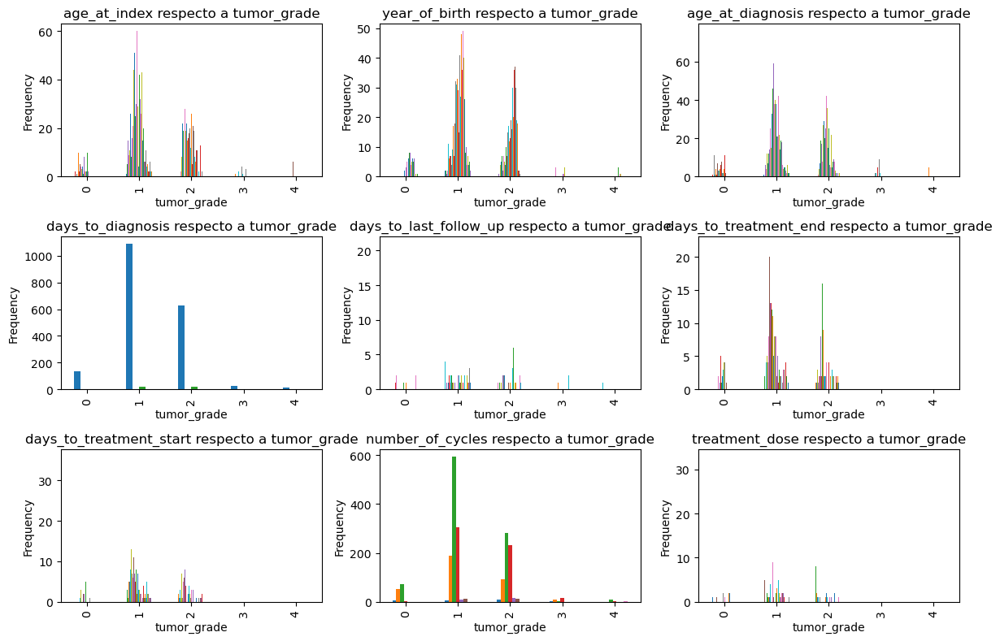

In [17]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for idx, column in enumerate(continuous_columns):

    row = idx // 3
    col = idx % 3

    grouped_df = df_C.groupby(['tumor_grade'])[column].value_counts().unstack()

    ax = axes[row,col]
    grouped_df.plot(kind='bar', stacked=False, ax=ax)
    ax.set_xlabel('tumor_grade')
    ax.set_ylabel('Frequency')
    ax.legend().set_visible(False)
    ax.set_title(f'{column} respecto a tumor_grade')

plt.tight_layout()
plt.show()

Las variables continuas presentan una mayor distribución hacia las clases 1 y 2 y una distribución mínima hacia las clases 3 y 4.

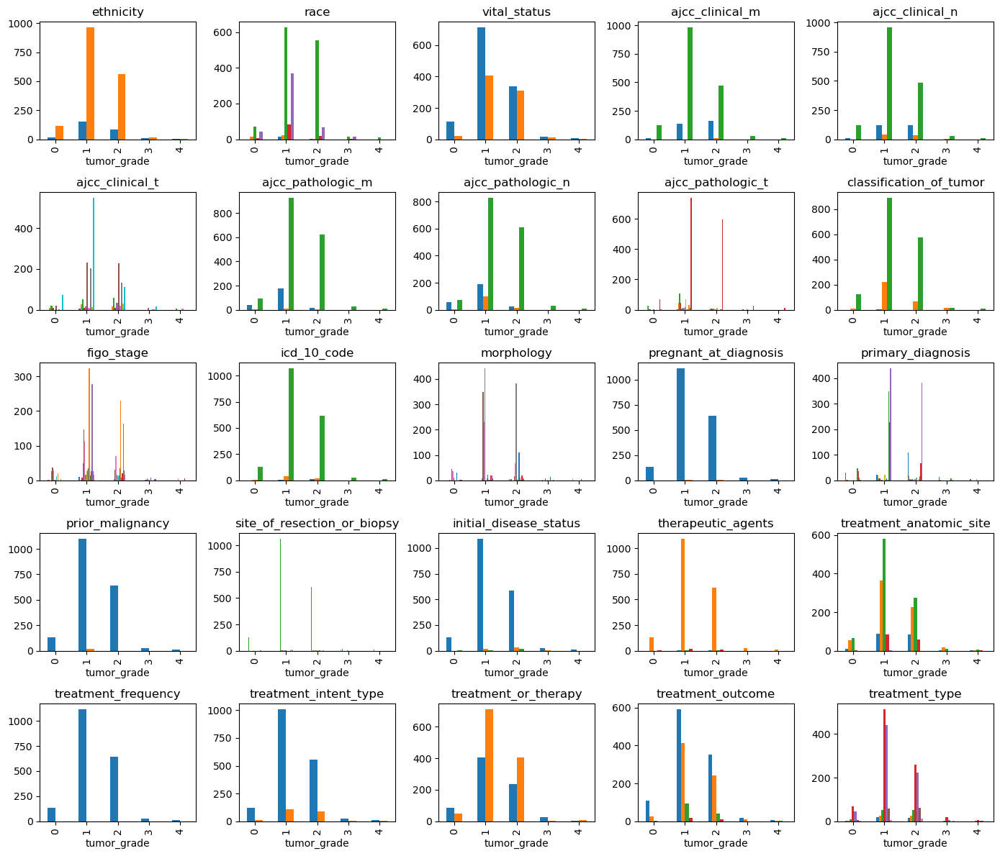

In [18]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(14,12))

for idx, column in enumerate(categorical_columns):

    row = idx // 5
    col = idx % 5

    grouped_df = df_C.groupby(['tumor_grade'])[column].value_counts().unstack()

    ax = axes[row,col]
    grouped_df.plot(kind='bar', stacked=False, ax=ax)
    ax.set_xlabel('tumor_grade')
    #ax.set_ylabel('Frequency')
    ax.legend().set_visible(False)
    ax.set_title(column)

plt.tight_layout()
plt.show()

Al igual que sucede con las variables continuas, las variables categóricas presentan una mayor distribución hacia las clases 1 y 2 y una distribución mínima hacia las clases 3 y 4.

#### Normalización de los registros

In [19]:
scaler = StandardScaler()
scaler.fit(df_C)
df_C2 = pd.DataFrame(scaler.transform(df_C), columns=df_C.columns)
df_C2 # DATAFRAME ESCALADO

,age_at_index,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_t,ajcc_pathologic_m,...,initial_disease_status,number_of_cycles,therapeutic_agents,treatment_anatomic_site,treatment_dose,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_outcome,treatment_type
0,1.185727,0.404547,-0.572151,-0.797628,-1.301510,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,1.033551,-0.124496,-0.700528,-0.787921,-0.022745,2.835028,-1.248279,-0.787778,-0.382470
1,1.185727,0.404547,-0.572151,-0.797628,-1.047230,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,-0.186771,-0.124496,0.588550,0.146329,-0.022745,-0.352730,0.801103,-0.787778,0.656431
2,1.185727,0.404547,-0.572151,-0.797628,-1.047230,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,1.033551,-0.124496,0.588550,-0.786572,-0.022745,-0.352730,0.801103,-0.787778,0.656431
3,1.185727,0.404547,-0.572151,-0.797628,-1.216750,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,1.033551,-0.124496,1.877629,2.218543,-0.022745,-0.352730,0.801103,-0.787778,1.695331
4,1.185727,0.404547,-0.572151,-0.797628,-0.877710,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,-0.186771,-0.124496,-1.989607,0.869445,-0.022745,-0.352730,0.801103,-0.787778,-2.460271
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1929,0.937277,0.404547,-0.572151,-0.797628,-0.538669,0.102714,0.44216,0.439815,0.572365,0.381384,...,-0.211311,-0.186771,-0.124496,0.588550,-0.454019,-0.022745,-0.352730,0.801103,0.657727,0.656431
1930,0.937277,0.404547,-0.572151,-0.797628,-0.877710,-0.447306,0.44216,0.439815,0.572365,0.381384,...,-0.211311,1.033551,-0.124496,-0.700528,-0.788596,-0.022745,2.835028,-1.248279,-0.787778,-0.382470
1931,0.937277,0.404547,-0.572151,-0.797628,-0.538669,-0.447306,0.44216,0.439815,0.572365,0.381384,...,-0.211311,-0.186771,-0.124496,-0.700528,-0.790619,-0.022745,-0.352730,-1.248279,0.657727,-0.382470
1932,-0.636242,-2.471901,-0.572151,-0.797628,0.987013,-0.630646,0.44216,0.439815,0.950036,-2.679180,...,-0.211311,-0.186771,-0.124496,-0.700528,-0.495167,-0.022745,-0.352730,0.801103,-0.787778,-0.382470


In [20]:
df_C2['tumor_grade'] = df_C2['tumor_grade'].astype(int)

## MODELOS ML

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split

#### Funciones auxiliares para el cálculo de métricas de clasificación para los modelos ML

In [ ]:
def calculate_metrics(y_test, y_pred, X_test, model): ## CÁLCULO DE MÉTRICAS DESGLOSADO EN CLASES
    
    precision = precision_score(y_test, y_pred, average=None)
    recall = recall_score(y_test, y_pred, average=None)
    f1 = f1_score(y_test, y_pred, average=None)

    conf_matrix = confusion_matrix(y_test, y_pred)
    num_classes = conf_matrix.shape[0]

    specificity = {}

    for i in range(num_classes):

        TP = conf_matrix[i,i]
        FP = conf_matrix[:,i].sum() - TP
        TN = conf_matrix.sum() - (conf_matrix[i,:].sum() + conf_matrix[:,i].sum() - TP)
        FN = conf_matrix[i,:].sum() - TP

        if (TN + FP) != 0:
            specificity[i] = TN / (TN + FP) # Specificity para cada clase
        else:
            np.nan

    return precision, recall, f1, conf_matrix, specificity

In [ ]:
def global_metrics(y_test, y_pred, X_test, model): ## CÁLCULO DE MÉTRICAS SIN DESGLOSAR EN CLASES

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    conf_matrix = confusion_matrix(y_test, y_pred)
    num_classes = conf_matrix.shape[0]

    specificity = {}

    for i in range(num_classes):

        TP = conf_matrix[i,i]
        FP = conf_matrix[:,i].sum() - TP
        TN = conf_matrix.sum() - (conf_matrix[i,:].sum() + conf_matrix[:,i].sum() - TP)
        FN = conf_matrix[i,:].sum() - TP

        if (TN + FP) != 0:
            specificity[i] = TN / (TN + FP) # Specificity para cada clase
        else:
            np.nan
            
    add_specificity = sum(specificity.values())
    mean_specificity = add_specificity / num_classes

    return accuracy, precision, recall, f1, mean_specificity

#### Funciones auxiliares para el cálculo y dibujo de las curvas ROC para los modelos ML

In [ ]:
def calculate_roc_curves(y_test, X_test, model): ## CÁLCULO DE CURVAS ROC DESGLOSADO EN CLASES
    
    FPR = {}
    TPR = {}
    roc_auc = {}
    
    pred_proba = model.predict_proba(X_test)
    num_classes = pred_proba.shape[1]
    
    for i in range(num_classes): 
        FPR[i], TPR[i], thresholds = roc_curve(y_test, pred_proba[:,i], pos_label=i) # ROC para cada clase
        roc_auc[i] = auc(FPR[i], TPR[i])

    return FPR, TPR, roc_auc

In [ ]:
def plot_roc_curves(ax, FPR, TPR, roc_auc, num_classes, title): ## DIBUJO DE CURVAS ROC DESGLOSADO EN CLASES
    ax.plot([0,1], [0,1], 'k--', lw=2) # Diagonal de referencia (clasificación aleatoria)
    
    for i in range(num_classes):
        ax.plot(FPR[i], TPR[i], label=f'Clase {i} (AUC = {roc_auc[i]:.2f})')
    
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    ax.legend(loc='lower right')

In [ ]:
def global_roc_curves(y_test, X_test, model): ## CÁLCULO DE CURVAS ROC SIN DESGLOSAR EN CLASES
    
    FPR = {}
    TPR = {}
    roc_auc = {}
    
    pred_proba = model.predict_proba(X_test)
    num_classes = pred_proba.shape[1]
    
    all_FPR = np.unique(np.concatenate([roc_curve(y_test == i, pred_proba[:,i])[0] for i in range(num_classes)]))
    mean_TPR = np.zeros_like(all_FPR)
    
    for i in range(num_classes):
        fpr, tpr, thresholds = roc_curve(y_test == i, pred_proba[:,i])
        FPR[i], TPR[i] = fpr, tpr
        roc_auc[i] = auc(fpr, tpr)
        mean_TPR += np.interp(all_FPR, fpr, tpr)
    
    mean_TPR /= num_classes
    
    FPR["macro"] = all_FPR
    TPR["macro"] = mean_TPR
    roc_auc["macro"] = auc(FPR["macro"], TPR["macro"])

    return FPR, TPR, roc_auc

In [ ]:
def global_plot_roc_curves(ax, FPR, TPR, roc_auc, model_name): ## DIBUJO DE CURVAS ROC SIN DESGLOSAR EN CLASES
    
    ax.plot([0,1], [0,1], 'k--', lw=2)  # Diagonal de referencia (clasificación aleatoria)
    
    ax.plot(FPR["macro"], TPR["macro"], label=f'{model_name} (AUC = {roc_auc["macro"]:.2f})')
    
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Curvas ROC promedio')
    ax.legend(loc='lower right')

#### Árboles de decisión

In [ ]:
from sklearn.tree import DecisionTreeClassifier

#### Separación de los datos en conjuntos 'train' y 'test'

In [ ]:
X_C_DT = df_C2.drop(['tumor_grade'], axis=1)
y_C_DT = df_C['tumor_grade'].values

X_train_C_DT, X_test_C_DT, y_train_C_DT, y_test_C_DT = train_test_split(X_C_DT, y_C_DT, test_size=0.2, random_state=5)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
DT_classifier = DecisionTreeClassifier()

param_grid = {"max_depth": [5,7,9,10,20],
              "min_samples_split": [2,5,10],
              "min_samples_leaf": [2,5,10],
              "criterion": ["gini","entropy"]}

search_DT = GridSearchCV(DT_classifier, param_grid, cv=5)
search_DT.fit(X_train_C_DT, y_train_C_DT)

print(f'Mejor combinación de hiperparámetros: {search_DT.best_params_}')
"""

Mejor combinación de hiperparámetros: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [ ]:
C_clsDT = DecisionTreeClassifier(criterion = 'entropy', # criterion=search_DT.best_params_['criterion'],
                                  max_depth = 20, # max_depth=search_DT.best_params_['max_depth'],
                                  min_samples_leaf = 2, # min_samples_leaf=search_DT.best_params_['min_samples_leaf'],
                                  min_samples_split = 5, # min_samples_split=search_DT.best_params_['min_samples_split'],
                                  max_features = None)

C_clsDT.fit(X_train_C_DT, y_train_C_DT)

#### Predicción con el conjunto 'test'

In [ ]:
y_pred_C_DT = C_clsDT.predict(X_test_C_DT)

#### Métricas para cada clase y matriz de confusión

In [ ]:
precision_C_DT, recall_C_DT, f1_C_DT, conf_matrix_C_DT, specificity_C_DT = calculate_metrics(y_test_C_DT, y_pred_C_DT, X_test_C_DT, C_clsDT)

print('PRECISION')
for i, p in enumerate(precision_C_DT):
    print(f'Clase {i}: {p:.4f}')

print('\nRECALL')
for i, r in enumerate(recall_C_DT):
    print(f'Clase {i}: {r:.4f}')

print('\nF1-SCORE')
for i, f in enumerate(f1_C_DT):
    print(f'Clase {i}: {f:.4f}')

print('\nSPECIFICITY')
for i, s in specificity_C_DT.items():
    print(f'Clase {i}: {s:.4f}')

In [ ]:
C_clsDT_display = ConfusionMatrixDisplay(conf_matrix_C_DT)
C_clsDT_display.plot(values_format='d', cmap='Blues')
C_clsDT_display.ax_.set(title='Matriz de Confusión DT');

* **Clase 0.** Predicciones correctas: 23 (TP) y 349 (TN) - Predicciones incorrectas: 4 (FN) y 11 (FP).
* **Clase 1.** Predicciones correctas: 206 (TP) y 110 (TN) - Predicciones incorrectas: 32 (FN) y 39 (FP).
* **Clase 2.** Predicciones correctas: 81 (TP) y 247 (TN) - Predicciones incorrectas: 37 (FN) y 22 (FP).
* **Clase 3.** Predicciones correctas: 3 (TP) y 383 (TN) - Predicciones incorrectas: 0 (FN) y 1 (FP).
* **Clase 4.** Predicciones correctas: 1 (TP) y 386 (TN) - Predicciones incorrectas: 0 (FN) y 0 (FP).

Excluyendo la clase 4 (para la cual solo se ha predicho una instancia y de manera correcta):

- La clase con mayor métrica 'precision' es la clase 1, donde de todas las instancias predichas como clase 1, el 84,08% son realmente de la clase 1.

- La clase con mayor métrica 'recall' es la clase 3, donde se identifican correctamente el 100% de las instancias que son realmente de la clase 3.

- La clase con mayor métrica 'f1-score' es la clase 3, donde el modelo presenta un rendimiento alto, concretamente del 85,71%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

- La clase con mayor métrica 'specificity' es la clase 3, donde se identifican correctamente el 99,74% de las instancias que no son de la clase 3.

#### Métricas globales del modelo

In [102]:
g_accuracy_C_DT, g_precision_C_DT, g_recall_C_DT, g_f1_C_DT, g_specificity_C_DT = global_metrics(y_test_C_DT, y_pred_C_DT, X_test_C_DT, C_clsDT)

print(f'ACCURACY: {round(g_accuracy_C_DT*100,2)}%')
print(f'PRECISION: {round(g_precision_C_DT*100,2)}%')
print(f'RECALL: {round(g_recall_C_DT*100,2)}%')
print(f'F1-SCORE: {round(g_f1_C_DT*100,2)}%')
print(f'SPECIFICITY: {round(g_specificity_C_DT*100,2)}%')

ACCURACY: 81.14%
PRECISION: 81.07%
RECALL: 88.08%
F1-SCORE: 83.95%
SPECIFICITY: 92.47%


De las 387 instancias del conjunto de test, el modelo DT ha clasificado 314 instancias correctamente (TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 81,14% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 81,07% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 88,08% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 83,95%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 92,47% de las instancias negativas reales.

#### Random Forest

In [30]:
from sklearn.ensemble import RandomForestClassifier

#### Separación de los datos en conjuntos 'train' y 'test'

In [31]:
X_C_RF = df_C2.drop('tumor_grade',axis=1) # df_C2 --> DATAFRAME ESCALADO
X_C_RF = np.array(X_C_RF)
y_C_RF = np.array(df_C['tumor_grade'])

X_train_C_RF ,X_test_C_RF ,y_train_C_RF ,y_test_C_RF = train_test_split(X_C_RF, y_C_RF, test_size=0.2, random_state=1)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
RF_classifier = RandomForestClassifier()

param_grid = {"n_estimators": [5,10,20,50],
              "max_depth": [5,7,10],
              "min_samples_split": [2,5,10],
              "min_samples_leaf": [2,5,10],
              "criterion": ["gini","entropy"]}

search_RF = GridSearchCV(RF_classifier, param_grid, cv=5)
search_RF.fit(X_train_C_RF, y_train_C_RF)

print(f'Mejor combinación de hiperparámetros: {search_RF.best_params_}')
"""

Mejor combinación de hiperparámetros: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [32]:
C_clsRF = RandomForestClassifier(criterion = 'entropy', # criterion=search_RF.best_params_['criterion'],
                                  n_estimators = 50, # n_estimators=search_RF.best_params_['n_estimators'],
                                  max_depth = 10, # max_depth=search_RF.best_params_['max_depth'],
                                  min_samples_leaf = 2, # min_samples_leaf=search_RF.best_params_['min_samples_leaf'],
                                  min_samples_split = 5, # min_samples_split=search_RF.best_params_['min_samples_split'],
                                  max_features = None)

C_clsRF.fit(X_train_C_RF, y_train_C_RF)

RandomForestClassifier(criterion='entropy', max_depth=10, max_features=None,
                       min_samples_leaf=2, min_samples_split=5,
                       n_estimators=50)

#### Predicción con el conjunto 'test'

In [33]:
y_pred_C_RF = C_clsRF.predict(X_test_C_RF)

#### Métricas para cada clase y matriz de confusión

In [87]:
precision_C_RF, recall_C_RF, f1_C_RF, conf_matrix_C_RF, specificity_C_RF = calculate_metrics(y_test_C_RF, y_pred_C_RF, X_test_C_RF, C_clsRF)

print('PRECISION')
for i, p in enumerate(precision_C_RF):
    print(f'Clase {i}: {p:.4f}')

print('\nRECALL')
for i, r in enumerate(recall_C_RF):
    print(f'Clase {i}: {r:.4f}')

print('\nF1-SCORE')
for i, f in enumerate(f1_C_RF):
    print(f'Clase {i}: {f:.4f}')

print('\nSPECIFICITY')
for i, s in specificity_C_RF.items():
    print(f'Clase {i}: {s:.4f}')

PRECISION
Clase 0: 0.8571
Clase 1: 0.9301
Clase 2: 0.8527
Clase 3: 1.0000
Clase 4: 1.0000

RECALL
Clase 0: 0.8182
Clase 1: 0.9181
Clase 2: 0.8943
Clase 3: 0.7500
Clase 4: 1.0000

F1-SCORE
Clase 0: 0.8372
Clase 1: 0.9241
Clase 2: 0.8730
Clase 3: 0.8571
Clase 4: 1.0000

SPECIFICITY
Clase 0: 0.9918
Clase 1: 0.8968
Clase 2: 0.9280
Clase 3: 1.0000
Clase 4: 1.0000


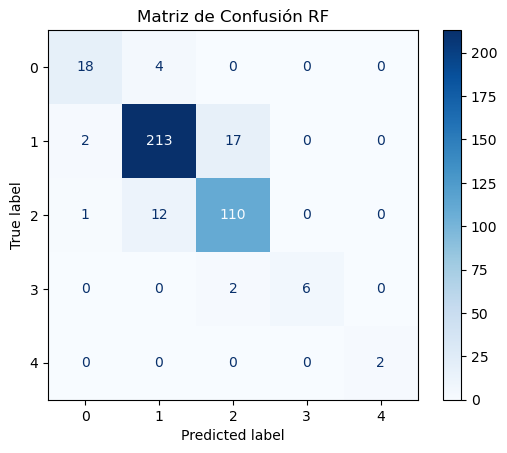

In [35]:
C_clsRF_display = ConfusionMatrixDisplay(conf_matrix_C_RF)
C_clsRF_display.plot(values_format='d', cmap='Blues')
C_clsRF_display.ax_.set(title='Matriz de Confusión RF');

* **Clase 0.** Predicciones correctas: 18 (TP) y 362 (TN) - Predicciones incorrectas: 4 (FN) y 3 (FP).
* **Clase 1.** Predicciones correctas: 213 (TP) y 139 (TN) - Predicciones incorrectas: 19 (FN) y 16 (FP).
* **Clase 2.** Predicciones correctas: 110 (TP) y 245 (TN) - Predicciones incorrectas: 13 (FN) y 19 (FP).
* **Clase 3.** Predicciones correctas: 6 (TP) y 379 (TN) - Predicciones incorrectas: 2 (FN) y 0 (FP).
* **Clase 4.** Predicciones correctas: 2 (TP) y 385 (TN) - Predicciones incorrectas: 0 (FN) y 0 (FP).

Excluyendo la clase 4 (para la cual solo se han predicho 2 instancias y de manera correcta):

- La clase con mayor métrica 'precision' es la clase 3, donde de todas las instancias predichas como clase 3, el 100% son realmente de la clase 3.

- La clase con mayor métrica 'recall' es la clase 1, donde se identifican correctamente el 91,81% de las instancias que son realmente de la clase 1.

- La clase con mayor métrica 'f1-score' es la clase 1, donde el modelo presenta un rendimiento alto, concretamente del 92,41%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

- La clase con mayor métrica 'specificity' es la clase 3, donde se identifican correctamente el 100% de las instancias que no son de la clase 3.

#### Métricas globales del modelo

In [99]:
g_accuracy_C_RF, g_precision_C_RF, g_recall_C_RF, g_f1_C_RF, g_specificity_C_RF = global_metrics(y_test_C_RF, y_pred_C_RF, X_test_C_RF, C_clsRF)

print(f'ACCURACY: {round(g_accuracy_C_RF*100,2)}%')
print(f'PRECISION: {round(g_precision_C_RF*100,2)}%')
print(f'RECALL: {round(g_recall_C_RF*100,2)}%')
print(f'F1-SCORE: {round(g_f1_C_RF*100,2)}%')
print(f'SPECIFICITY: {round(g_specificity_C_RF*100,2)}%')

ACCURACY: 90.18%
PRECISION: 92.8%
RECALL: 87.61%
F1-SCORE: 89.83%
SPECIFICITY: 96.33%


De las 387 instancias del conjunto de test, el modelo RF ha clasificado 349 instancias correctamente (TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 90,18% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 92,8% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 87,61% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 89,83%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 96,33% de las instancias negativas reales.

#### SVM

In [36]:
from sklearn import svm
from sklearn.svm import SVC

#### Separación de los datos en conjuntos 'train' y 'test'

In [37]:
X_C_SVM = df_C2.drop('tumor_grade',axis=1) # df_C2 --> DATAFRAME ESCALADO
y_C_SVM = df_C['tumor_grade']

X_train_C_SVM, X_test_C_SVM, y_train_C_SVM, y_test_C_SVM = train_test_split(X_C_SVM, y_C_SVM, test_size=0.2, random_state=1)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
SVM_classifier = SVC()

param_grid = {"C": [0.1,1,5],
              "kernel": ["linear","poly","rbf"],
              "gamma": [0.001,0.01,0.1,1]}

search_SVM = GridSearchCV(SVM_classifier, param_grid, cv=5)
search_SVM.fit(X_train_C_SVM, y_train_C_SVM)

print(f'Mejor combinación de hiperparámetros: {search_SVM.best_params_}')
"""

Mejor combinación de hiperparámetros: {'C': 1, 'gamma': 0.1, 'kernel': 'poly'}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [38]:
C_clsSVM = SVC(C = 1, # C=search_SVM.best_params_['C'],
                 kernel='poly', # kernel=search_SVM.best_params_['kernel'],
                 gamma = 0.1, # gamma=search_SVM.best_params_['gamma'])
                 probability=True)

C_clsSVM.fit(X_train_C_SVM, y_train_C_SVM)

SVC(C=1, gamma=0.1, kernel='poly', probability=True)

#### Predicción con el conjunto 'test'

In [39]:
y_pred_C_SVM = C_clsSVM.predict(X_test_C_SVM)

#### Métricas para cada clase y matriz de confusión

In [89]:
precision_C_SVM, recall_C_SVM, f1_C_SVM, conf_matrix_C_SVM, specificity_C_SVM = calculate_metrics(y_test_C_SVM, y_pred_C_SVM, X_test_C_SVM, C_clsSVM)

print('PRECISION')
for i, p in enumerate(precision_C_SVM):
    print(f'Clase {i}: {p:.4f}')

print('\nRECALL')
for i, r in enumerate(recall_C_SVM):
    print(f'Clase {i}: {r:.4f}')

print('\nF1-SCORE')
for i, f in enumerate(f1_C_SVM):
    print(f'Clase {i}: {f:.4f}')

print('\nSPECIFICITY')
for i, s in specificity_C_SVM.items():
    print(f'Clase {i}: {s:.4f}')

PRECISION
Clase 0: 0.7500
Clase 1: 0.8739
Clase 2: 0.7698
Clase 3: 0.6667
Clase 4: 1.0000

RECALL
Clase 0: 0.8182
Clase 1: 0.8664
Clase 2: 0.7886
Clase 3: 0.5000
Clase 4: 0.5000

F1-SCORE
Clase 0: 0.7826
Clase 1: 0.8701
Clase 2: 0.7791
Clase 3: 0.5714
Clase 4: 0.6667

SPECIFICITY
Clase 0: 0.9836
Clase 1: 0.8129
Clase 2: 0.8902
Clase 3: 0.9947
Clase 4: 1.0000


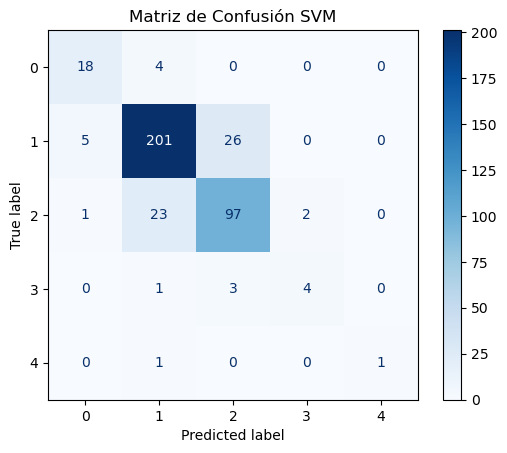

In [41]:
C_clsSVM_display = ConfusionMatrixDisplay(conf_matrix_C_SVM)
C_clsSVM_display.plot(values_format='d', cmap='Blues')
C_clsSVM_display.ax_.set(title='Matriz de Confusión SVM');

* **Clase 0.** Predicciones correctas: 18 (TP) y 359 (TN) - Predicciones incorrectas: 4 (FN) y 6 (FP).
* **Clase 1.** Predicciones correctas: 201 (TP) y 126 (TN) - Predicciones incorrectas: 31 (FN) y 29 (FP).
* **Clase 2.** Predicciones correctas: 97 (TP) y 235 (TN) - Predicciones incorrectas: 26 (FN) y 29 (FP).
* **Clase 3.** Predicciones correctas: 4 (TP) y 377 (TN) - Predicciones incorrectas: 4 (FN) y 2 (FP).
* **Clase 4.** Predicciones correctas: 1 (TP) y 385 (TN) - Predicciones incorrectas: 1 (FN) y 0 (FP).


- La clase con mayor métrica 'precision' es la clase 4, donde de todas las instancias predichas como clase 4, el 100% son realmente de la clase 4.

- La clase con mayor métrica 'recall' es la clase 1, donde se identifican correctamente el 86,64% de las instancias que son realmente de la clase 1.

- La clase con mayor métrica 'f1-score' es la clase 1, donde el modelo presenta un rendimiento alto, concretamente del 87,01%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

- La clase con mayor métrica 'specificity' es la clase 4, donde se identifican correctamente el 100% de las instancias que no son de la clase 4.

#### Métricas globales del modelo

In [98]:
g_accuracy_C_SVM, g_precision_C_SVM, g_recall_C_SVM, g_f1_C_SVM, g_specificity_C_SVM = global_metrics(y_test_C_SVM, y_pred_C_SVM, X_test_C_SVM, C_clsSVM)

print(f'ACCURACY: {round(g_accuracy_C_SVM*100,2)}%')
print(f'PRECISION: {round(g_precision_C_SVM*100,2)}%')
print(f'RECALL: {round(g_recall_C_SVM*100,2)}%')
print(f'F1-SCORE: {round(g_f1_C_SVM*100,2)}%')
print(f'SPECIFICITY: {round(g_specificity_C_SVM*100,2)}%')

ACCURACY: 82.95%
PRECISION: 81.21%
RECALL: 69.46%
F1-SCORE: 73.4%
SPECIFICITY: 93.63%


De las 387 instancias del conjunto de test, el modelo SVM ha clasificado 321 instancias correctamente (TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 82,95% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 81,21% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 69,46% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 73,4%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 93,63% de las instancias negativas reales.

#### XGBoost

In [42]:
import xgboost as xgb

#### Separación de los datos en conjuntos 'train' y 'test'

In [43]:
X_C_XG = df_C2.drop('tumor_grade',axis=1) # df_C2 --> DATAFRAME ESCALADO
X_C_XG = np.array(X_C_XG)
y_C_XG = np.array(df_C['tumor_grade'])

X_train_C_XG ,X_test_C_XG ,y_train_C_XG ,y_test_C_XG = train_test_split(X_C_XG, y_C_XG, test_size=0.2, random_state=1)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
XG_classifier = xgb.XGBClassifier(eval_metric='logloss')

param_grid = {"n_estimators": [5,10,20,50,100],
              "max_depth": [5,7,9,10],
              "learning_rate": [0.01,0.1,0.3]}

search_XG = GridSearchCV(XG_classifier, param_grid, cv=5)
search_XG.fit(X_train_C_XG, y_train_C_XG)

print(f'Mejor combinación de hiperparámetros: {search_XG.best_params_}')
"""

Mejor combinación de hiperparámetros: {'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 100}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [44]:
C_clsXG = xgb.XGBClassifier(n_estimators = 100, # n_estimators=search_XG.best_params_['n_estimators'],
                             max_depth = 9, # max_depth=search_XG.best_params_['max_depth'],
                             learning_rate = 0.3,  # learning_rate=search_XG.best_params_['learning_rate'])
                             eval_metric='logloss')

C_clsXG.fit(X_train_C_XG, y_train_C_XG)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.3, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=9,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

#### Predicción con el conjunto 'test'

In [45]:
y_pred_C_XG = C_clsXG.predict(X_test_C_XG)

#### Métricas para cada clase y matriz de confusión

In [91]:
precision_C_XG, recall_C_XG, f1_C_XG, conf_matrix_C_XG, specificity_C_XG = calculate_metrics(y_test_C_XG, y_pred_C_XG, X_test_C_XG, C_clsXG)

print('PRECISION')
for i, p in enumerate(precision_C_XG):
    print(f'Clase {i}: {p:.4f}')

print('\nRECALL')
for i, r in enumerate(recall_C_XG):
    print(f'Clase {i}: {r:.4f}')

print('\nF1-SCORE')
for i, f in enumerate(f1_C_XG):
    print(f'Clase {i}: {f:.4f}')

print('\nSPECIFICITY')
for i, s in specificity_C_XG.items():
    print(f'Clase {i}: {s:.4f}')

PRECISION
Clase 0: 0.8889
Clase 1: 0.9316
Clase 2: 0.8750
Clase 3: 0.8000
Clase 4: 1.0000

RECALL
Clase 0: 0.7273
Clase 1: 0.9397
Clase 2: 0.9106
Clase 3: 0.5000
Clase 4: 1.0000

F1-SCORE
Clase 0: 0.8000
Clase 1: 0.9356
Clase 2: 0.8924
Clase 3: 0.6154
Clase 4: 1.0000

SPECIFICITY
Clase 0: 0.9945
Clase 1: 0.8968
Clase 2: 0.9394
Clase 3: 0.9974
Clase 4: 1.0000


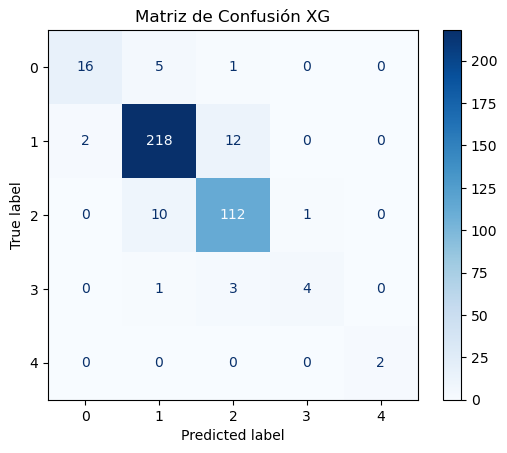

In [74]:
C_clsXG_display = ConfusionMatrixDisplay(conf_matrix_C_XG)
C_clsXG_display.plot(values_format='d', cmap='Blues')
C_clsXG_display.ax_.set(title='Matriz de Confusión XG');

* **Clase 0.** Predicciones correctas: 16 (TP) y 363 (TN) - Predicciones incorrectas: 6 (FN) y 2 (FP).
* **Clase 1.** Predicciones correctas: 218 (TP) y 139 (TN) - Predicciones incorrectas: 14 (FN) y 16 (FP).
* **Clase 2.** Predicciones correctas: 112 (TP) y 248 (TN) - Predicciones incorrectas: 11 (FN) y 16 (FP).
* **Clase 3.** Predicciones correctas: 4 (TP) y 378 (TN) - Predicciones incorrectas: 4 (FN) y 1 (FP).
* **Clase 4.** Predicciones correctas: 2 (TP) y 385 (TN) - Predicciones incorrectas: 0 (FN) y 0 (FP).

Excluyendo la clase 4 (para la cual solo se han predicho 2 instancias y de manera correcta):

- La clase con mayor métrica 'precision' es la clase 1, donde de todas las instancias predichas como clase 1, el 93,16% son realmente de la clase 1.

- La clase con mayor métrica 'recall' es la clase 1, donde se identifican correctamente el 93,97% de las instancias que son realmente de la clase 1.

- La clase con mayor métrica 'f1-score' es la clase 1, donde el modelo presenta un rendimiento alto, concretamente del 93,56%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

- La clase con mayor métrica 'specificity' es la clase 3, donde se identifican correctamente el 99,74% de las instancias que no son de la clase 3.

#### Métricas globales del modelo

In [96]:
g_accuracy_C_XG, g_precision_C_XG, g_recall_C_XG, g_f1_C_XG, g_specificity_C_XG = global_metrics(y_test_C_XG, y_pred_C_XG, X_test_C_XG, C_clsXG)

print(f'ACCURACY: {round(g_accuracy_C_XG*100,2)}%')
print(f'PRECISION: {round(g_precision_C_XG*100,2)}%')
print(f'RECALL: {round(g_recall_C_XG*100,2)}%')
print(f'F1-SCORE: {round(g_f1_C_XG*100,2)}%')
print(f'SPECIFICITY: {round(g_specificity_C_XG*100,2)}%')

ACCURACY: 90.96%
PRECISION: 89.91%
RECALL: 81.55%
F1-SCORE: 84.87%
SPECIFICITY: 96.56%


De las 387 instancias del conjunto de test, el modelo XG ha clasificado 352 instancias correctamente (TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 90,96% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 89,91% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 81,55% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 84,87%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 96,56% de las instancias negativas reales.

#### MLP

In [48]:
from sklearn.neural_network import MLPClassifier

#### Separación de los datos en conjuntos 'train' y 'test'

In [49]:
X_C_MLP = df_C2.drop('tumor_grade',axis=1) # df_C2 --> DATAFRAME ESCALADO
X_C_MLP = np.array(X_C_MLP)
y_C_MLP = np.array(df_C['tumor_grade'])

X_train_val_C_MLP, X_test_C_MLP, y_train_val_C_MLP, y_test_C_MLP = train_test_split(X_C_MLP, y_C_MLP, test_size=0.2, random_state=1)

# test_size=0.1/(0.8) = 0.125 --> 10% como validation (12,5% del 80% = 10% del 100%)
X_train_C_MLP, X_val_C_MLP, y_train_C_MLP, y_val_C_MLP = train_test_split(X_train_val_C_MLP, y_train_val_C_MLP, test_size=0.125, random_state=1)

In [50]:
print(f"Conjunto 'train': {X_train_C_MLP.shape[0]} registros ({round(int(X_train_C_MLP.shape[0])/1934*100)}%)")
print(f"Conjunto 'validation': {X_val_C_MLP.shape[0]} registros ({round(int(X_val_C_MLP.shape[0])/1934*100)}%)")
print(f"Conjunto 'test': {X_test_C_MLP.shape[0]} registros ({round(int(X_test_C_MLP.shape[0])/1934*100)}%)")

Conjunto 'train': 1353 registros (70%)
Conjunto 'validation': 194 registros (10%)
Conjunto 'test': 387 registros (20%)


#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
MLP_classifier = MLPClassifier(early_stopping=True, validation_fraction=0.1, n_iter_no_change=10)

param_grid = {"hidden_layer_sizes": [(20,), (50,), (100,), (20,20), (20,50), (20,100), (50,20), (50,50), (50,100)],
              "activation": ["tanh","relu"],
              "solver": ["adam","sgd"],
              "alpha": [0.0001,0.001,0.01], # Regularización L2
              "learning_rate_init": [0.001,0.01,0.1],
              "max_iter": [500,1000,1250]}

search_MLP = GridSearchCV(MLP_classifier, param_grid, cv=3)
search_MLP.fit(X_train_C_MLP, y_train_C_MLP)

print(f'Mejor combinación de hiperparámetros: {search_MLP.best_params_}')
"""

Mejor combinación de hiperparámetros: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (50, 100), 'learning_rate_init': 0.01, 'max_iter': 1000, 'solver': 'adam'}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [105]:
C_clsMLP = MLPClassifier(hidden_layer_sizes = (50,100), # hidden_layer_sizes=search_MLP.best_params_['hidden_layer_sizes'],
                            activation = 'relu', # activation=search_MLP.best_params_['activation'],
                            solver = 'adam', # solver=search_MLP.best_params_['solver'],
                            alpha = 0.01, # alpha=search_MLP.best_params_['alpha'],
                            learning_rate = "adaptive", # learning_rate=search_MLP.best_params_['learning_rate'],
                            learning_rate_init = 0.01, # learning_rate_init=search_MLP.best_params_['learning_rate_init'])
                            max_iter = 1000, # max_iter=search_MLP.best_params_['max_iter'],
                            batch_size='auto')

C_clsMLP.fit(X_train_C_MLP, y_train_C_MLP)

MLPClassifier(alpha=0.01, hidden_layer_sizes=(50, 100),
              learning_rate='adaptive', learning_rate_init=0.01, max_iter=1000)

#### Predicción con el conjunto 'test'

In [106]:
y_pred_C_MLP = C_clsMLP.predict(X_test_C_MLP)

#### Métricas para cada clase y matriz de confusión

In [107]:
precision_C_MLP, recall_C_MLP, f1_C_MLP, conf_matrix_C_MLP, specificity_C_MLP = calculate_metrics(y_test_C_MLP, y_pred_C_MLP, X_test_C_MLP, C_clsMLP)

print('PRECISION')
for i, p in enumerate(precision_C_MLP):
    print(f'Clase {i}: {p:.4f}')

print('\nRECALL')
for i, r in enumerate(recall_C_MLP):
    print(f'Clase {i}: {r:.4f}')

print('\nF1-SCORE')
for i, f in enumerate(f1_C_MLP):
    print(f'Clase {i}: {f:.4f}')

print('\nSPECIFICITY')
for i, s in specificity_C_MLP.items():
    print(f'Clase {i}: {s:.4f}')

PRECISION
Clase 0: 0.9524
Clase 1: 0.8908
Clase 2: 0.7734
Clase 3: 0.5556
Clase 4: 0.0000

RECALL
Clase 0: 0.9091
Clase 1: 0.8793
Clase 2: 0.8049
Clase 3: 0.6250
Clase 4: 0.0000

F1-SCORE
Clase 0: 0.9302
Clase 1: 0.8850
Clase 2: 0.7888
Clase 3: 0.5882
Clase 4: 0.0000

SPECIFICITY
Clase 0: 0.9973
Clase 1: 0.8387
Clase 2: 0.8902
Clase 3: 0.9894
Clase 4: 1.0000


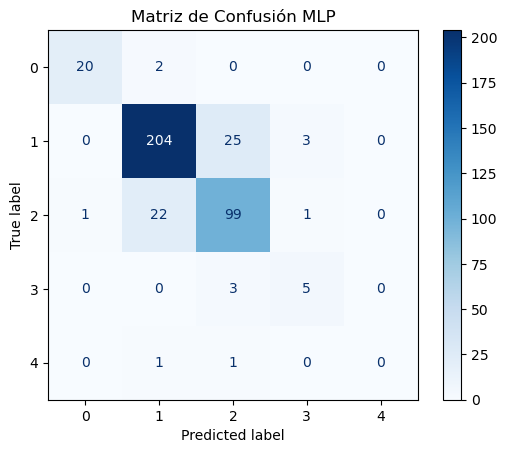

In [109]:
C_clsMLP_display = ConfusionMatrixDisplay(conf_matrix_C_MLP)
C_clsMLP_display.plot(values_format='d', cmap='Blues')
C_clsMLP_display.ax_.set(title='Matriz de Confusión MLP');

* **Clase 0.** Predicciones correctas: 20 (TP) y 364 (TN) - Predicciones incorrectas: 2 (FN) y 1 (FP).
* **Clase 1.** Predicciones correctas: 204 (TP) y 130 (TN) - Predicciones incorrectas: 28 (FN) y 25 (FP).
* **Clase 2.** Predicciones correctas: 99 (TP) y 235 (TN) - Predicciones incorrectas: 24 (FN) y 29 (FP).
* **Clase 3.** Predicciones correctas: 5 (TP) y 375 (TN) - Predicciones incorrectas: 3 (FN) y 4 (FP).
* **Clase 4.** Predicciones correctas: 0 (TP) y 385 (TN) - Predicciones incorrectas: 2 (FN) y 0 (FP).

- La clase con mayor métrica 'precision' es la clase 0, donde de todas las instancias predichas como clase 0, el 95,24% son realmente de la clase 0.

- La clase con mayor métrica 'recall' es la clase 0, donde se identifican correctamente el 90,91% de las instancias que son realmente de la clase 0.

- La clase con mayor métrica 'f1-score' es la clase 0, donde el modelo presenta un rendimiento alto, concretamente del 93,02%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

- La clase con mayor métrica 'specificity' es la clase 4, donde se identifica correctamente el 100% de las instancias que no son de la clase 4.

#### Métricas globales del modelo

In [113]:
g_accuracy_C_MLP, g_precision_C_MLP, g_recall_C_MLP, g_f1_C_MLP, g_specificity_C_MLP = global_metrics(y_test_C_MLP, y_pred_C_MLP, X_test_C_MLP, C_clsMLP)

print(f'ACCURACY: {round(g_accuracy_C_MLP*100,2)}%')
print(f'PRECISION: {round(g_precision_C_MLP*100,2)}%')
print(f'RECALL: {round(g_recall_C_MLP*100,2)}%')
print(f'F1-SCORE: {round(g_f1_C_MLP*100,2)}%')
print(f'SPECIFICITY: {round(g_specificity_C_MLP*100,2)}%')

ACCURACY: 84.75%
PRECISION: 63.44%
RECALL: 64.37%
F1-SCORE: 63.85%
SPECIFICITY: 94.31%


De las 387 instancias del conjunto de test, el modelo MLP ha clasificado 330 instancias correctamente (TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 84,75% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 63,44% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 64,37% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 63,85%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 94,31% de las instancias negativas reales.

### COMPARATIVA DE MODELOS ML

#### Comparativa del rendimiento global de los modelos

In [111]:
### 1. CLASIFICACIÓN CON ÁRBOLES DE DECISIÓN
print("\nÁRBOLES DE DECISIÓN")
print(f"Accuracy = {round(g_accuracy_C_DT*100,2)}%")
print(f"Precision = {round(g_precision_C_DT*100,2)}%")
print(f"Recall = {round(g_recall_C_DT*100,2)}%")
print(f"F1-Score = {round(g_f1_C_DT*100,2)}%")
print(f"Specificity = {round(g_specificity_C_DT*100,2)}%")

### 2. CLASIFICACIÓN CON RANDOM FORESTS
print("\nRANDOM FORESTS")
print(f"Accuracy = {round(g_accuracy_C_RF*100,2)}%")
print(f"Precision = {round(g_precision_C_RF*100,2)}%")
print(f"Recall = {round(g_recall_C_RF*100,2)}%")
print(f"F1-Score = {round(g_f1_C_RF*100,2)}%")
print(f"Specificity = {round(g_specificity_C_RF*100,2)}%")

### 3. CLASIFICACIÓN CON SVM
print("\nSVM")
print(f"Accuracy = {round(g_accuracy_C_SVM*100,2)}%")
print(f"Precision = {round(g_precision_C_SVM*100,2)}%")
print(f"Recall = {round(g_recall_C_SVM*100,2)}%")
print(f"F1-Score = {round(g_f1_C_SVM*100,2)}%")
print(f"Specificity = {round(g_specificity_C_SVM*100,2)}%")

### 4. CLASIFICACIÓN CON XGBOOST
print("\nXGBOOST")
print(f"Accuracy = {round(g_accuracy_C_XG*100,2)}%")
print(f"Precision = {round(g_precision_C_XG*100,2)}%")
print(f"Recall = {round(g_recall_C_XG*100,2)}%")
print(f"F1-Score = {round(g_f1_C_XG*100,2)}%")
print(f"Specificity = {round(g_specificity_C_XG*100,2)}%")

### 5. CLASIFICACIÓN CON MLP
print("\nMLP")
print(f"Accuracy = {round(g_accuracy_C_MLP*100,2)}%")
print(f"Precision = {round(g_precision_C_MLP*100,2)}%")
print(f"Recall = {round(g_recall_C_MLP*100,2)}%")
print(f"F1-Score = {round(g_f1_C_MLP*100,2)}%")
print(f"Specificity = {round(g_specificity_C_MLP*100,2)}%")


ÁRBOLES DE DECISIÓN
Accuracy = 81.14%
Precision = 81.07%
Recall = 88.08%
F1-Score = 83.95%
Specificity = 92.47%

RANDOM FORESTS
Accuracy = 90.18%
Precision = 92.8%
Recall = 87.61%
F1-Score = 89.83%
Specificity = 96.33%

SVM
Accuracy = 82.95%
Precision = 81.21%
Recall = 69.46%
F1-Score = 73.4%
Specificity = 93.63%

XGBOOST
Accuracy = 90.96%
Precision = 89.91%
Recall = 81.55%
F1-Score = 84.87%
Specificity = 96.56%

MLP
Accuracy = 84.75%
Precision = 63.44%
Recall = 64.37%
F1-Score = 63.85%
Specificity = 94.31%


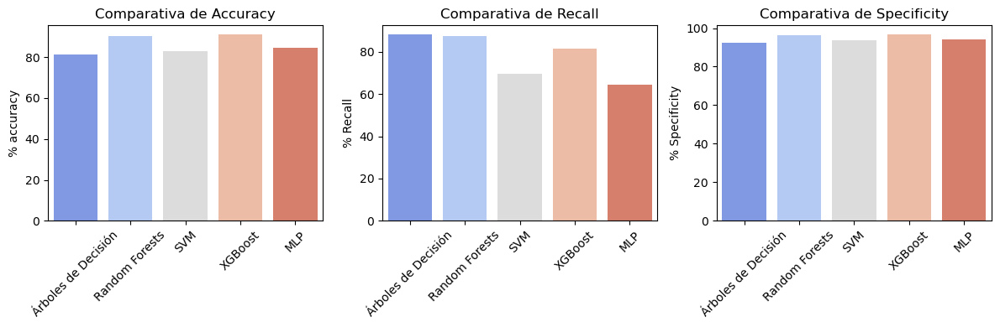

In [112]:
plt.figure(figsize=(12,4))

data = {"MODELOS": ["Árboles de Decisión", "Random Forests", "SVM", "XGBoost", "MLP"],

        "Accuracy": [round(g_accuracy_C_DT*100,2),round(g_accuracy_C_RF*100,2),round(g_accuracy_C_SVM*100,2),
                     round(g_accuracy_C_XG*100,2),round(g_accuracy_C_MLP*100,2)],

        "Recall": [round(g_recall_C_DT*100,2),round(g_recall_C_RF*100,2),round(g_recall_C_SVM*100,2),
                   round(g_recall_C_XG*100,2),round(g_recall_C_MLP*100,2)],

        "Specificity": [round(g_specificity_C_DT*100,2),round(g_specificity_C_RF*100,2),round(g_specificity_C_SVM*100,2),
                        round(g_specificity_C_XG*100,2),round(g_specificity_C_MLP*100,2)],
       }

results = pd.DataFrame(data)

plt.subplot(1,3,1)
sns.barplot(x="MODELOS", y="Accuracy", data=results, palette="coolwarm")
plt.title('Comparativa de Accuracy')
plt.xlabel('')
plt.ylabel('% accuracy')
plt.xticks(rotation=45)

plt.subplot(1,3,2)
sns.barplot(x="MODELOS", y="Recall", data=results, palette="coolwarm")
plt.title('Comparativa de Recall')
plt.xlabel('')
plt.ylabel('% Recall')
plt.xticks(rotation=45)

plt.subplot(1,3,3)
sns.barplot(x="MODELOS", y="Specificity", data=results, palette="coolwarm")
plt.title('Comparativa de Specificity')
plt.xlabel('')
plt.ylabel('% Specificity')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

Dado que se trata de un problema de clasificación en el ámbito clínico, se ha decidido estudiar las métricas 'accuracy', 'recall' y 'specificity' dado que proporcionan información sobre la capacidad de acierto del modelo, la capacidad para detectar correctamente las instancias positivas en todas las clases y la capacidad para detectar correctamente las instancias negativas en todas las clases, respectivamente.

Los modelos con mayor accuracy son XG y RF, logrando clasificar correctamente el 90,96% y 90,18% de las instancias totales, respectivamente. Después les siguen los modelos MLP (84,75%), SVM (82,95%) y DT (81,14%).

El modelo con mayor recall es DT, logrando identificar correctamente el 88,08% de las instancias positivas reales. Después le siguen los modelos RF (87,61%), XG (81,55%), SVM (69,46%) y MLP (64,37%).

Los modelos con mayor specificity son XG y RF, logrando identificar correctamente el 96,33% y 96,56% de las instancias negativas reales, respectivamente. Después le siguen los modelos MLP (94,31%), SVM (93,63%) y DT (92,47%).

En resumen:
- Clasificación descendente en función de 'accuracy': XGBoost, Random Forest, MLP, SVM y Árboles de Decisión.
- Clasificación descendente en función de 'recall': Árboles de Decisión, Random Forest, XGBoost, SVM y MLP.
- Clasificación descendente en función de 'specificity': XGBoost, Random Forest, MLP, SVM y Árboles de Decisión.

En conclusión, podría decirse que los modelos que proporcionan mejores resultados para la problemática estudiada son XGBoost y Random Forest.

#### Gráficas comparativas de las métricas para cada clase

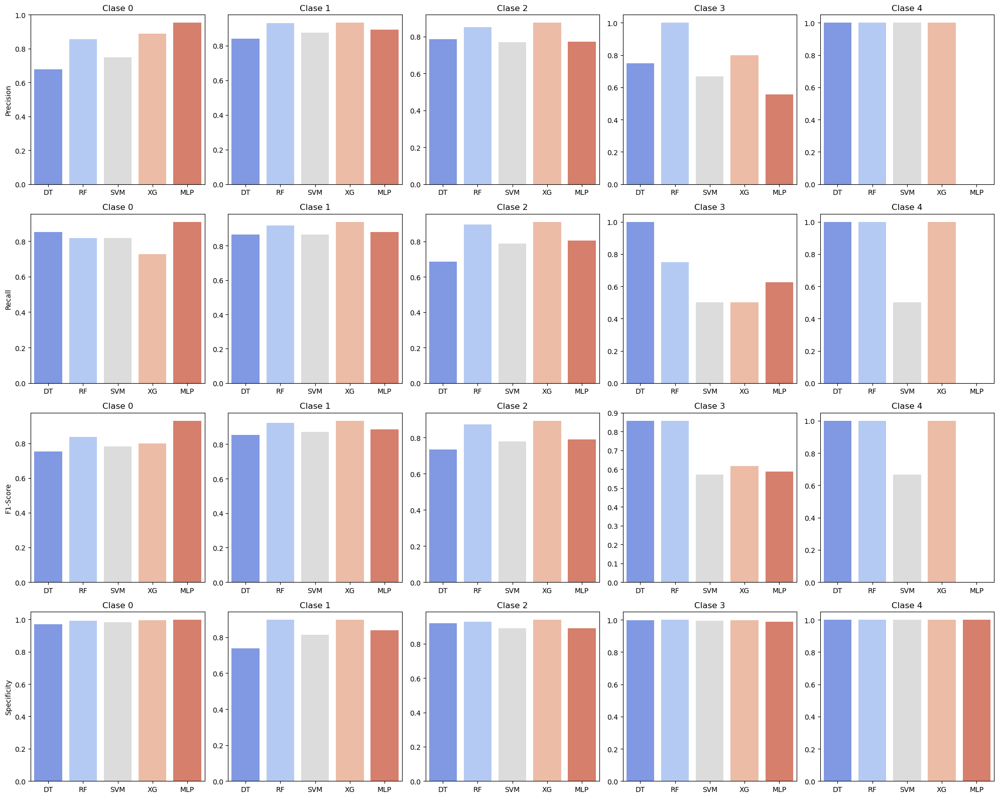

In [114]:
modelos = ["DT", "RF", "SVM", "XG", "MLP"]
clases = [0,1,2,3,4]
metricas = ["Precision", "Recall", "F1-Score", "Specificity"]
data = {"Modelo": [], "Clase": [], "Precision": [], "Recall": [], "F1-Score": [], "Specificity": []}

def agregar_datos(modelo, precision, recall, f1, specificity):
    
    for i in range(len(precision)):
        
        data["Modelo"].append(modelo)
        data["Clase"].append(f'Clase {i}')
        data["Precision"].append(precision[i])
        data["Recall"].append(recall[i])
        data["F1-Score"].append(f1[i])
        data["Specificity"].append(specificity[i])

agregar_datos("DT", precision_C_DT, recall_C_DT, f1_C_DT, [specificity_C_DT[i] for i in range(5)])
agregar_datos("RF", precision_C_RF, recall_C_RF, f1_C_RF, [specificity_C_RF[i] for i in range(5)])
agregar_datos("SVM", precision_C_SVM, recall_C_SVM, f1_C_SVM, [specificity_C_SVM[i] for i in range(5)])
agregar_datos("XG", precision_C_XG, recall_C_XG, f1_C_XG, [specificity_C_XG[i] for i in range(5)])
agregar_datos("MLP", precision_C_MLP, recall_C_MLP, f1_C_MLP, [specificity_C_MLP[i] for i in range(5)])

df = pd.DataFrame(data)

fig, axs = plt.subplots(4,5, figsize=(20,16))

for i, metrica in enumerate(metricas):
    
    for j, clase in enumerate(clases):
        
        sns.barplot(x="Modelo", y=metrica, data=df[df["Clase"] == f'Clase {j}'], ax=axs[i,j], palette="coolwarm")
        axs[i,j].set_title(f'Clase {clase}')

        if j == 0:
            axs[i,j].set_ylabel(f'{metrica}')
        else:
            axs[i,j].set_ylabel('')
            
        axs[i,j].set_xlabel('')

plt.tight_layout()
plt.show()

Dado que se trata de un problema de clasificación en el ámbito clínico, se ha decidido estudiar las métricas 'accuracy', 'recall' y 'specificity' dado que proporcionan información sobre la capacidad de acierto del modelo, la capacidad para detectar correctamente la clase positiva (1: cáncer) y la capacidad para detectar correctamente la clase negativa (0: no cáncer), respectivamente.

**MAYOR 'PRECISION'**
- Clase 0: 95,24% (MLP)
- Clase 1: 93,16% (XG)
- Clase 2: 87,50% (XG)
- Clase 3: 100% (RF)
- Clase 4: 100% (DT, RF, SVM y XG)

**MAYOR 'RECALL'**
- Clase 0: 90,91% (MLP)
- Clase 1: 93,97% (XG)
- Clase 2: 91,06% (XG)
- Clase 3: 100% (DT)
- Clase 4: 100% (DT, RF y XG)

**MAYOR 'F1-SCORE'**
- Clase 0: 93,02% (MLP)
- Clase 1: 93,56% (XG)
- Clase 2: 89,24% (XG)
- Clase 3: 85,71% (DT y RF)
- Clase 4: 100% (DT, RF y XG)

**MAYOR 'SPECIFICITY'**
- Clase 0: 99,73% (MLP)
- Clase 1: 89,68% (RF y XG)
- Clase 2: 93,94% (XG)
- Clase 3: 100% (RF)
- Clase 4: 100% (DT, RF, SVM, XG y MLP)

En conclusión, en rasgos generales todos los modelos proporcionan buenos valores para todas las métricas para cada clase. Sin embargo, cabe destacar que el modelo MLP es el que peor rendimiento proporciona a la hora de predecir la clase 4.

#### Capacidad de generalización de los modelos para cada clase

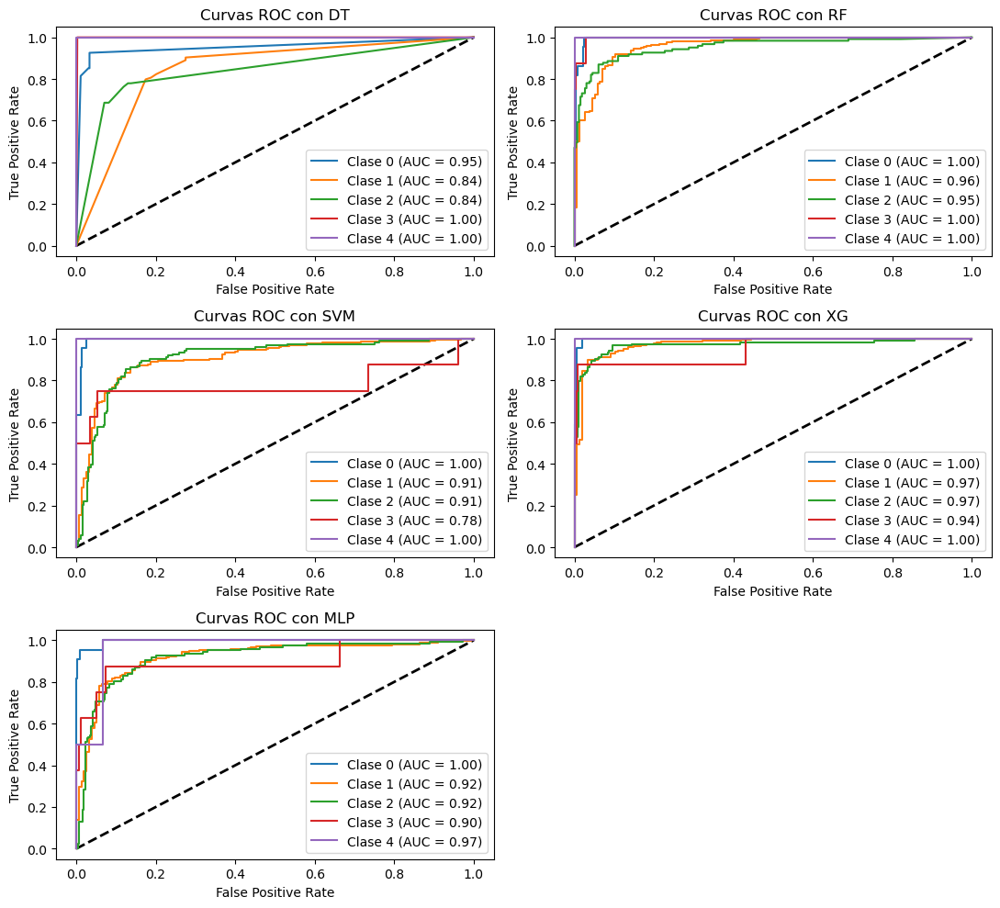

In [115]:
modelos = {"DT": C_clsDT, "RF": C_clsRF, "SVM": C_clsSVM, "XG": C_clsXG, "MLP": C_clsMLP}
X_tests = {"DT": X_test_C_DT, "RF": X_test_C_RF, "SVM": X_test_C_SVM, "XG": X_test_C_XG, "MLP": X_test_C_MLP}
y_tests = {"DT": y_test_C_DT, "RF": y_test_C_RF, "SVM": y_test_C_SVM, "XG": y_test_C_XG, "MLP": y_test_C_MLP}

fig, axs = plt.subplots(3,2, figsize=(11,10))

for i, (model_name, model) in enumerate(modelos.items()):
    FPR, TPR, roc_auc = calculate_roc_curves(y_tests[model_name], X_tests[model_name], model)
    plot_roc_curves(axs[i//2,i%2], FPR, TPR, roc_auc, 5, f'Curvas ROC con {model_name}')

fig.delaxes(axs[2,1])

plt.tight_layout()
plt.show()

**MAYOR 'ROC-AUC'**
- Clase 0: 100% (RF, SVM, XG y MLP)
- Clase 1: 97% (XG)
- Clase 2: 97% (XG)
- Clase 3: 100% (DT y RF)
- Clase 4: 100% (DT, RF, SVM y XG)

En conclusión, en rasgos generales todos los modelos proporcionan buenos valores ROC-AUC para cada clase, ya que ninguno de ellos resulta inferior al 75%. 

Podría considerarse que el modelo RF es el que mayor capacidad de discriminación entre clases proporciona, pues es el único modelo que proporciona un valor del 100% para 3 de las 5 posibles categorías (clases 0, 3 y 4) de la clasificación multiclase. 

#### Capacidad de generalización global de los modelos

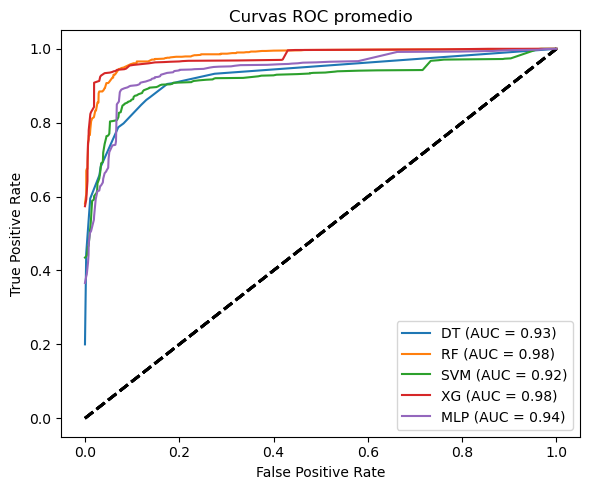

In [132]:
modelos = {"DT": C_clsDT, "RF": C_clsRF, "SVM": C_clsSVM, "XG": C_clsXG, "MLP": C_clsMLP}
X_tests = {"DT": X_test_C_DT, "RF": X_test_C_RF, "SVM": X_test_C_SVM, "XG": X_test_C_XG, "MLP": X_test_C_MLP}
y_tests = {"DT": y_test_C_DT, "RF": y_test_C_RF, "SVM": y_test_C_SVM, "XG": y_test_C_XG, "MLP": y_test_C_MLP}

fig, ax = plt.subplots(figsize=(6,5))

for model_name, model in modelos.items():
    FPR, TPR, roc_auc = global_roc_curves(y_tests[model_name], X_tests[model_name], model)
    global_plot_roc_curves(ax, FPR, TPR, roc_auc, model_name)

plt.tight_layout()
plt.show()

Analizando la gráfica ROC-AUC promedio de los modelos entrenados, se observa que RF y XG son los que mayor capacidad de discriminación entre clases proporciona (0,98).

A pesar de que SVM es el modelo con menor capacidad de discriminación entre clases (0,92), igualmente se trata de un modelo muy efectivo, pues su valor AUC es sobresaliente.

# ALGORITMOS XAI

In [59]:
import aix360
import warnings
warnings.filterwarnings("ignore")

### Explicaciones globales para entender el modelo basadas en la presencia de características mediante métodos post-hoc (explicativos extrínsecos)

### SHAP

In [60]:
import shap

In [61]:
def global_SHAP(id_model, model, data_train, data_test, labels):

    if id_model in ['DT','RF','XG']:
        explainer_SHAP = shap.TreeExplainer(model)
        shap_values = explainer_SHAP.shap_values(data_test)

    elif id_model in ['MLP']:
        explainer_SHAP = shap.KernelExplainer(model.predict_proba, shap.sample(data_train, 387))
        shap_values = explainer_SHAP.shap_values(shap.sample(data_test, 387))

    elif id_model in ['SVM']:
        explainer_SHAP = shap.KernelExplainer(model.predict_proba, shap.sample(data_train, 200))
        shap_values = explainer_SHAP.shap_values(shap.sample(data_test, 200))

    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None

    if isinstance(shap_values, np.ndarray):

        inst, feat, clases = shap_values.shape  # (n_instancias, n_caracteristicas, n_clases)

        for i in range(clases):
            shap_values_class = shap_values[:,:,i]
            base_value = shap_values_class.mean()

            if shap_values_class.shape[0] == data_test.shape[0]:
                data = data_test

            else:
                data = shap.sample(data_test, 200)

            explanation = shap.Explanation(values=shap_values_class, base_values=np.full(feat, base_value),
                                                   data=data, feature_names=labels)

            print(f'Clase {i} - SHAP values')
            shap.plots.bar(explanation)
            shap.summary_plot(explanation, cmap='Blues', show=False)
            plt.title(f'Clase {i}')
            plt.show()
        
    elif isinstance(shap_values, list):

        for i, shap_values_class in enumerate(shap_values):
            base_value = np.mean(shap_values_class, axis=0)

            if shap_values_class.shape[0] == data_test.shape[0]:
                data = data_test

            else:
                data = shap.sample(data_test, 200)

            explanation = shap.Explanation(values=shap_values_class, base_values=np.full(shap_values_class.shape[1], base_value),
                                               data=data, feature_names=labels)

            print(f'Clase {i} - SHAP values')
            shap.plots.bar(explanation)
            shap.summary_plot(explanation, cmap='Blues', show=False)
            plt.title(f'Clase {i}')
            plt.show()

#### Explicación con SHAP del modelo de Árboles de Decisión

Clase 0 - SHAP values


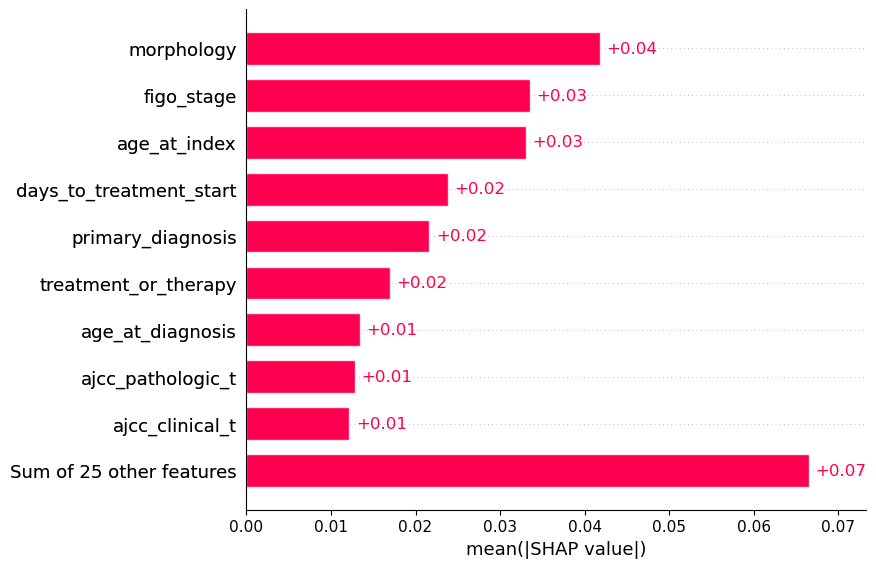

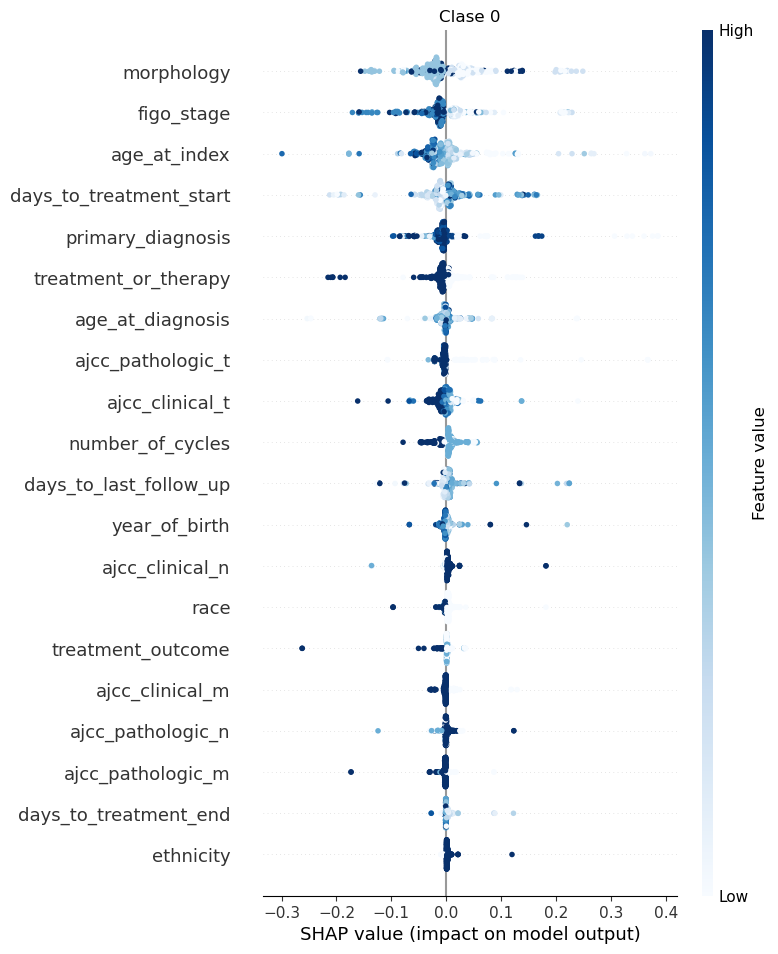

Clase 1 - SHAP values


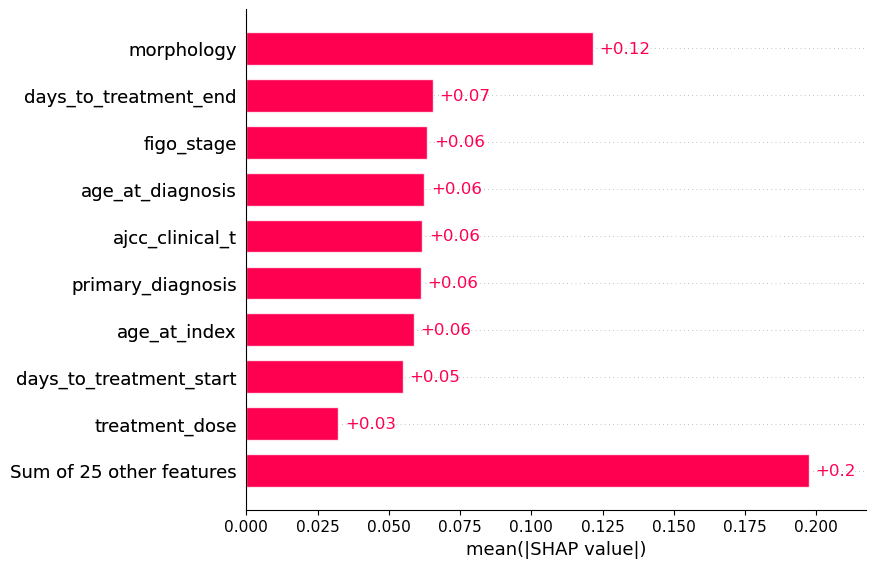

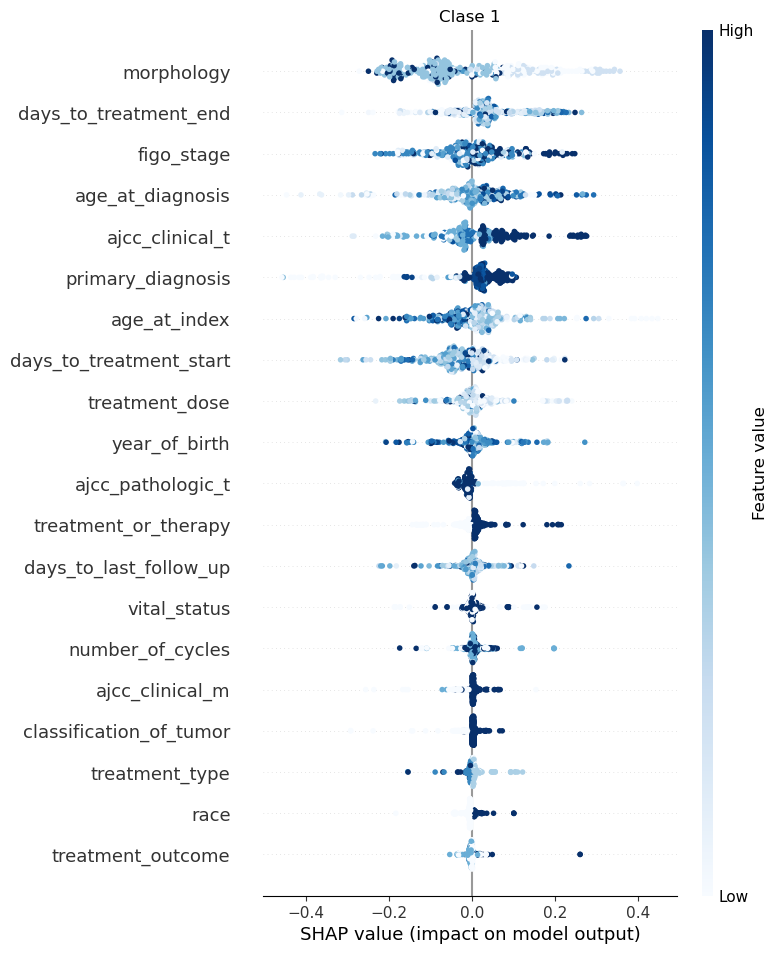

Clase 2 - SHAP values


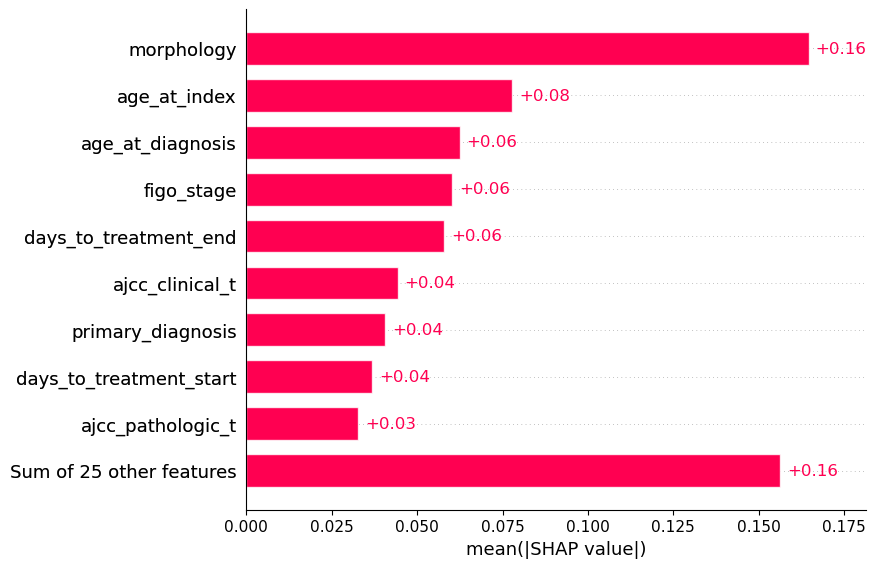

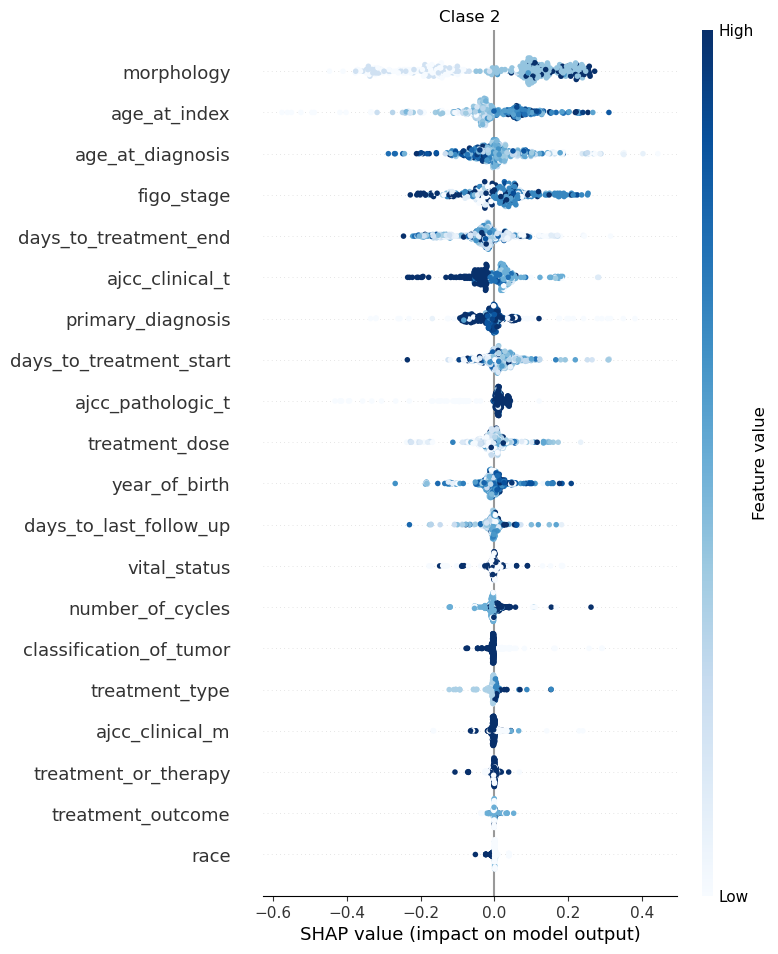

Clase 3 - SHAP values


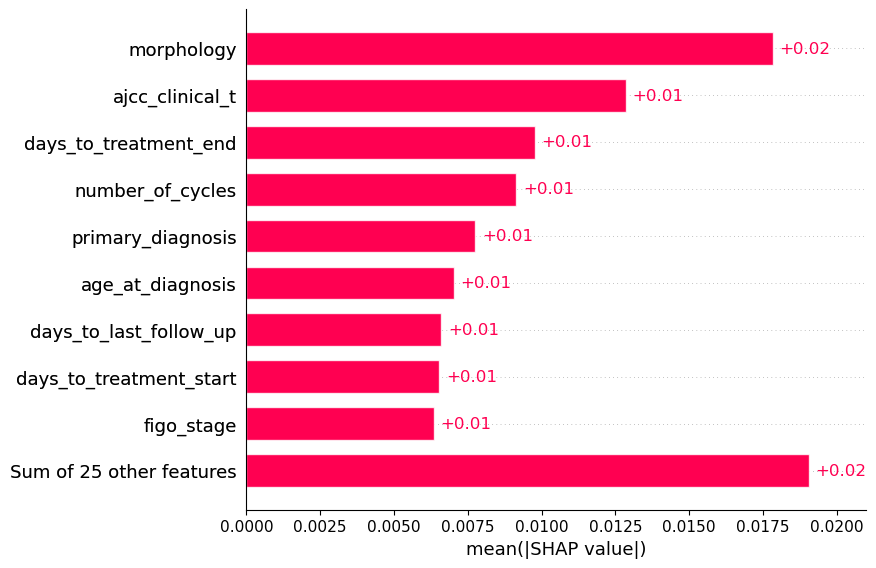

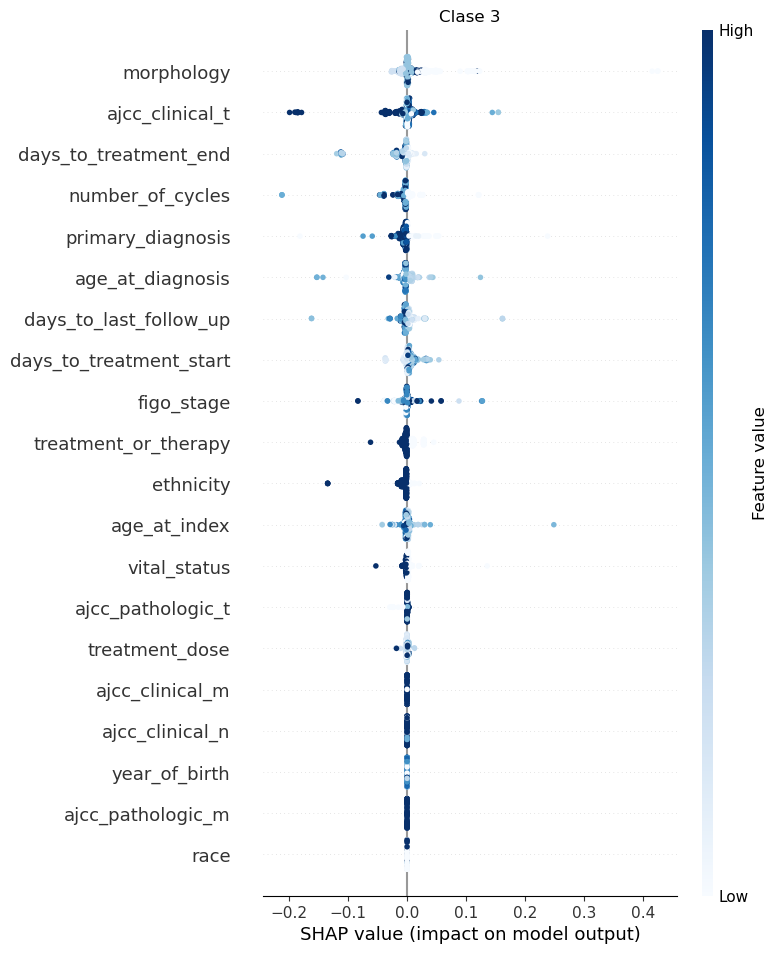

Clase 4 - SHAP values


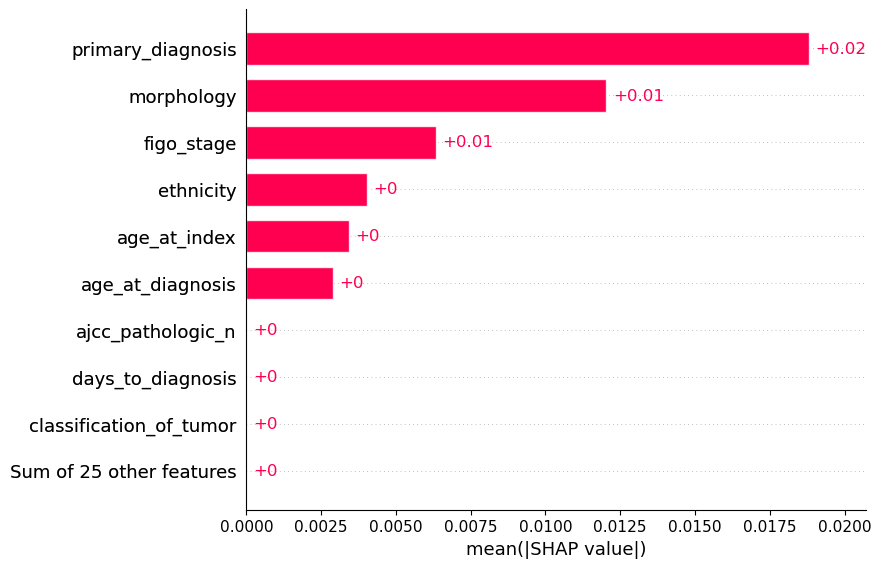

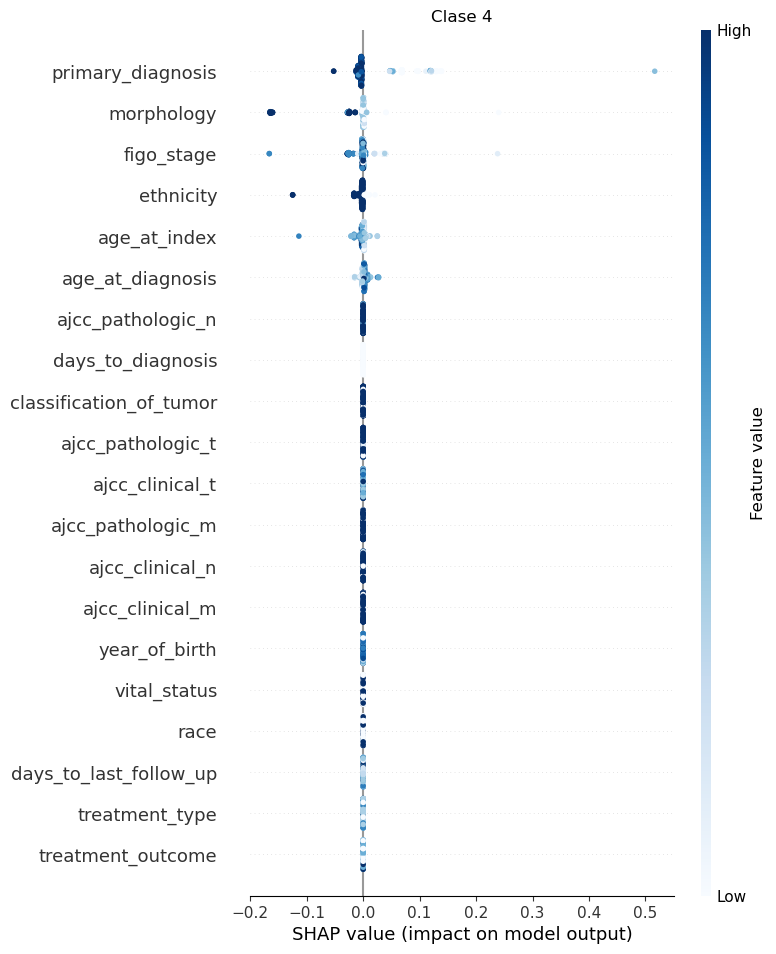

In [ ]:
global_SHAP('DT', C_clsDT, X_train_C_DT, X_test_C_DT, X_C_DT.columns)

**Características con mayor importancia para el modelo DT con SHAP**

**Clase 0:** morphology, figo_stage y age_at_index

Estas características aumentan la predicción de la clase 0 en 0.04, 0.03 y 0.03 unidades respectivamente en comparación con el valor base. Para estas variables, valores altos y medios (representados en azul oscuro y azul claro) impactan en el modelo disminuyendo la predicción, mientras que valores bajos (representados en blanco) tienden a aumentarla. 

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.07 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 1:** morphology, days_to_treatment_end y figo_stage

Estas características aumentan la predicción de la clase 1 en 0.12, 0.07 y 0.06 unidades respectivamente en comparación con el valor base. Para la variable 'morphology', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla. Por el contrario, para la variable 'days_to_treatment_end', valores altos y medios tienden a aumentar la predicción, mientras que valores bajos tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.2 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 2:** morphology, age_at_index y age_at_diagnosis

Estas características aumentan la predicción de la clase 2 en 0.16, 0.08 y 0.06 unidades respectivamente en comparación con el valor base. Para las variables 'morphology' y 'age_at_index', valores altos y medios impactan en el modelo aumentando la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para la variable 'age_at_diagnosis', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.16 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 3:** morphology, ajcc_clinical_t y days_to_treatment_end

Estas características aumentan la predicción de la clase 3 en 0.02, 0.01 y 0.01 unidades respectivamente en comparación con el valor base. Para estas variables, valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. 

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.02 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 4:** primary_diagnosis, morphology y figo_stage

Estas características aumentan la predicción de la clase 4 en 0.02, 0.01 y 0.04 unidades respectivamente en comparación con el valor base. Para estas variables, valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. 

#### Explicación con SHAP del modelo Random Forest

Clase 0 - SHAP values


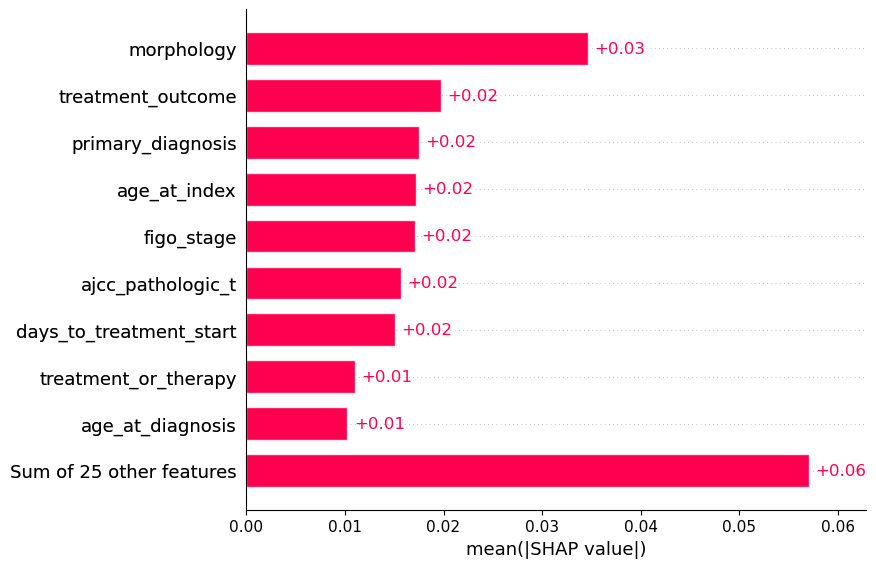

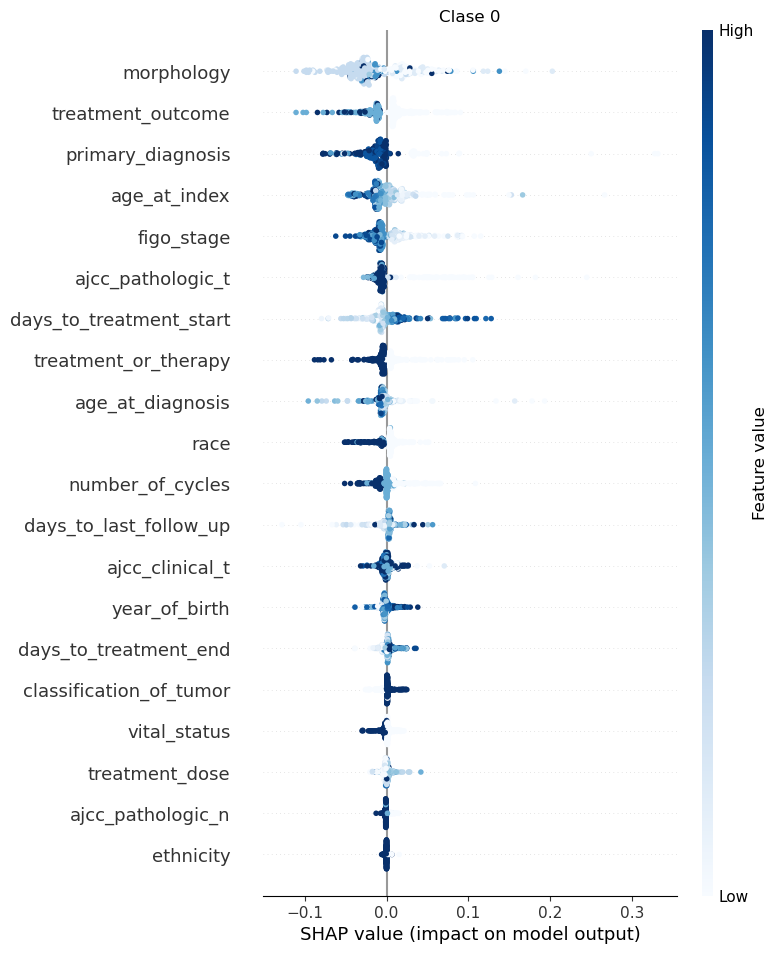

Clase 1 - SHAP values


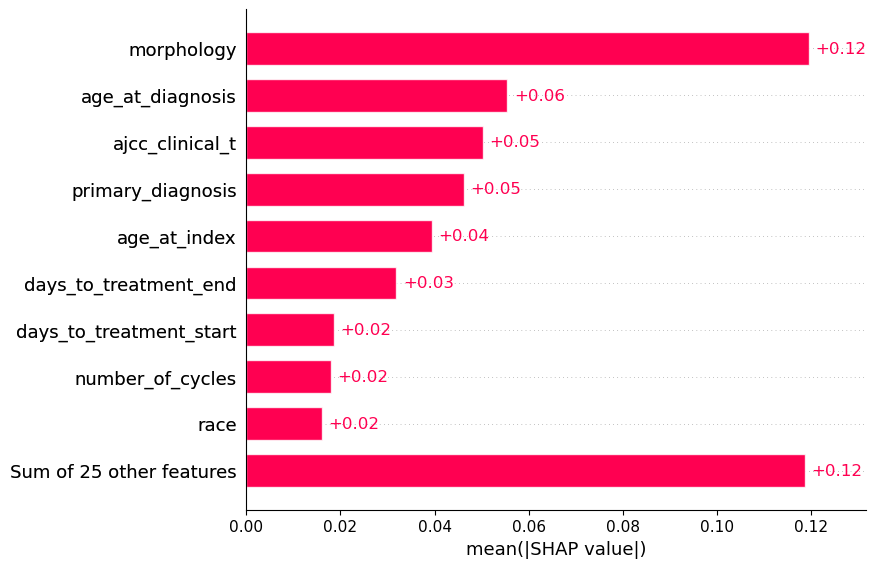

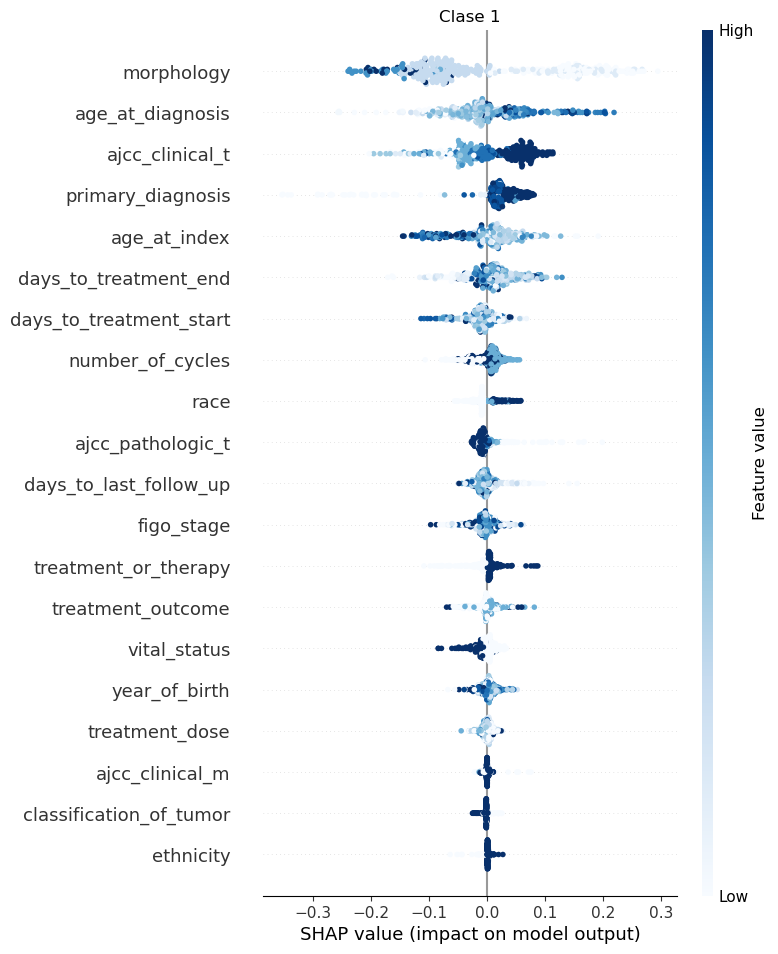

Clase 2 - SHAP values


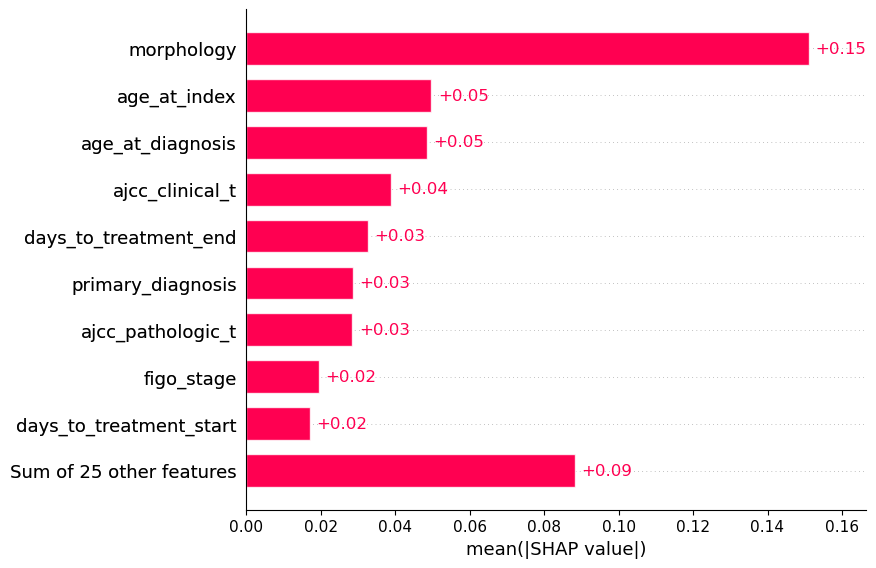

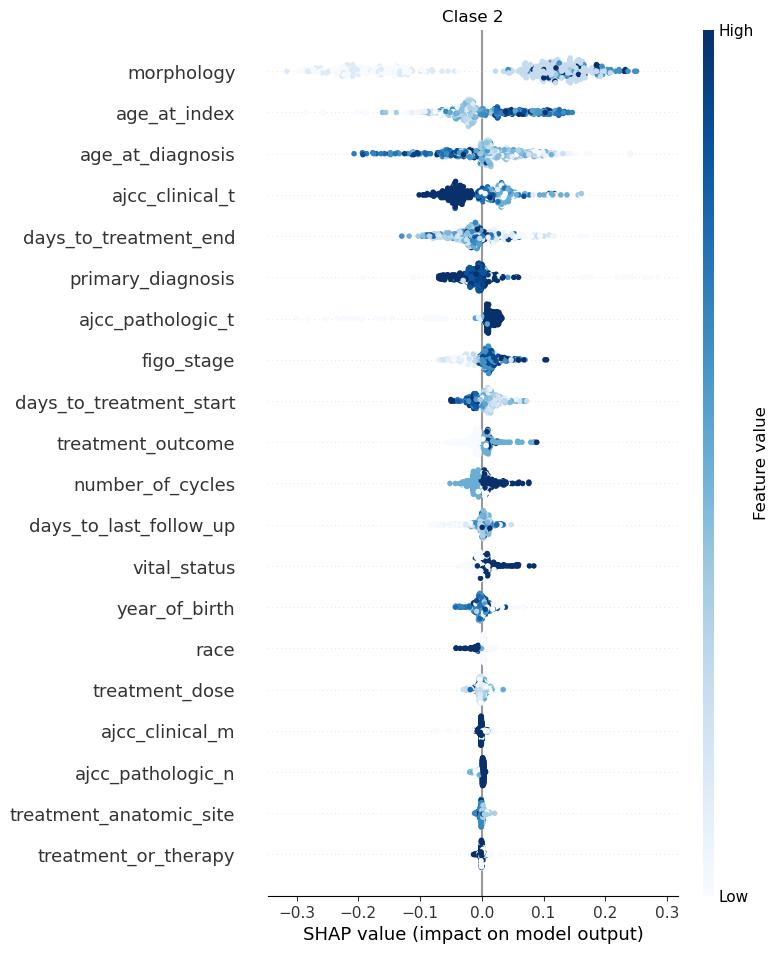

Clase 3 - SHAP values


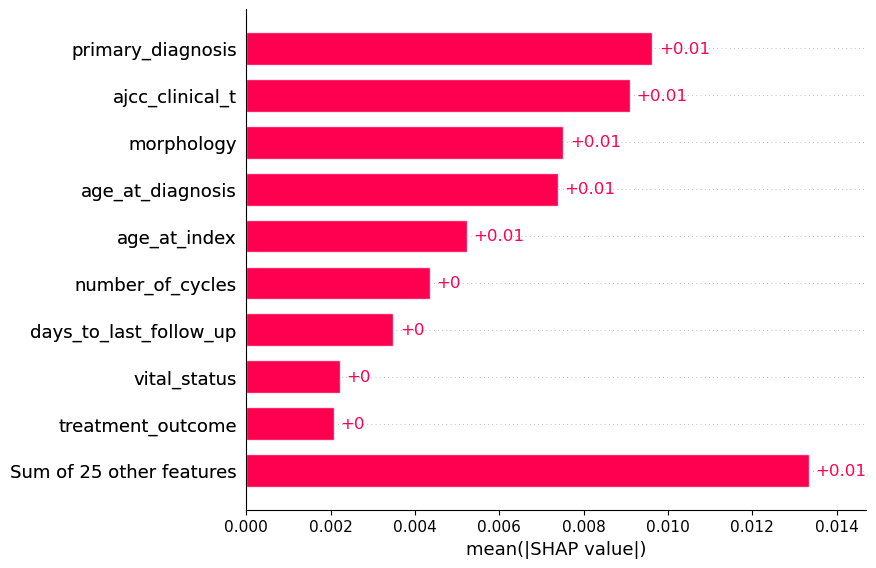

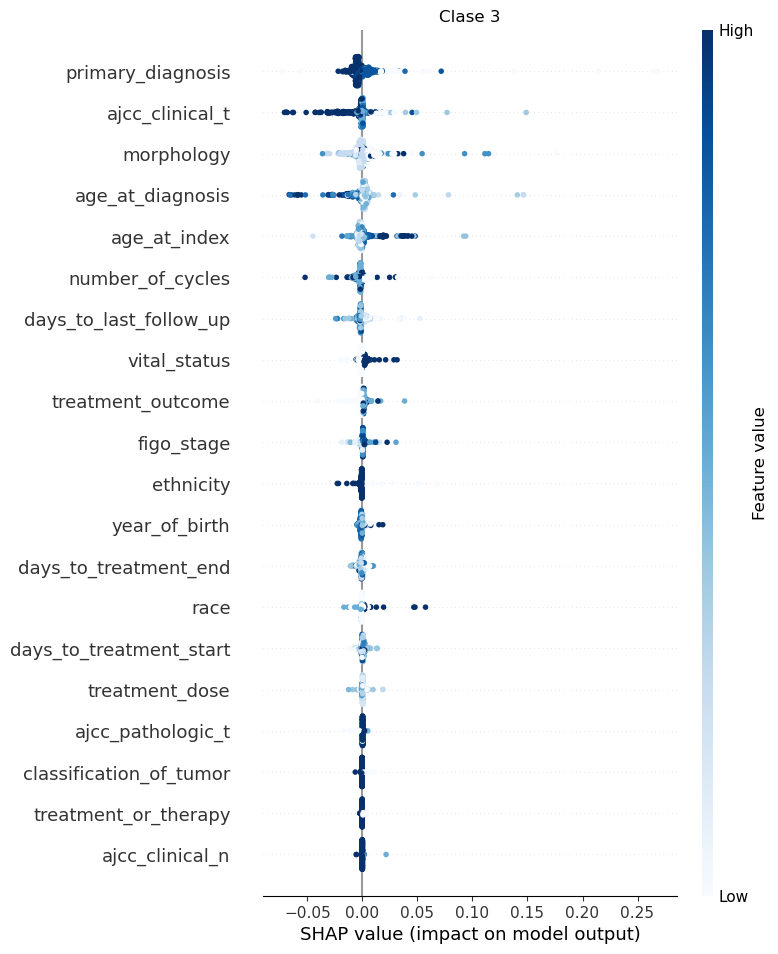

Clase 4 - SHAP values


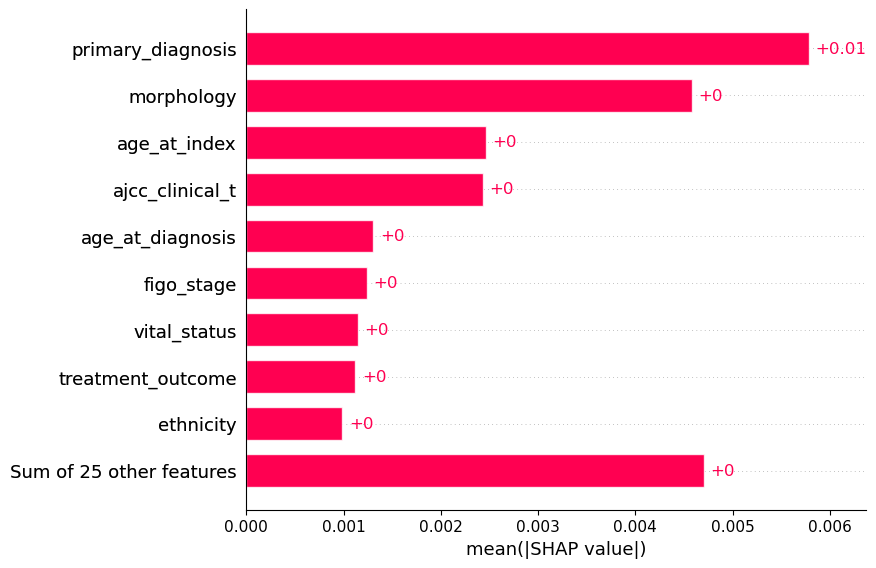

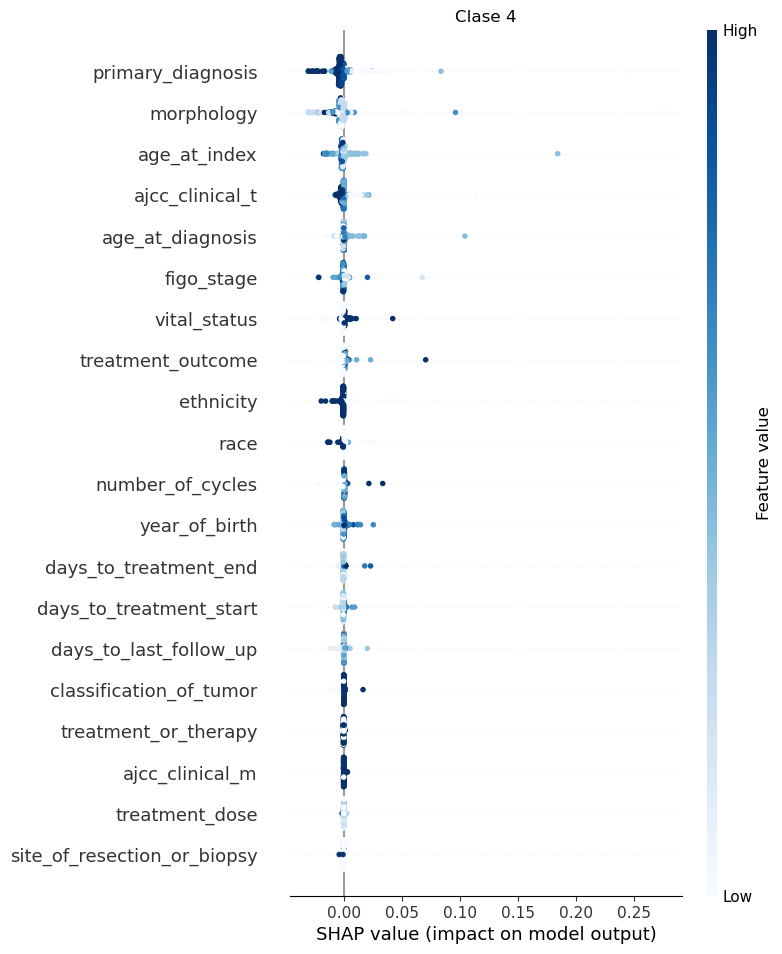

In [ ]:
X_test_C_RF_array = np.array(X_test_C_RF)

X_C_RF2 = df_C2.drop('tumor_grade',axis=1)
labels_RF = X_C_RF2.columns

global_SHAP('RF', C_clsRF, X_train_C_RF, X_test_C_RF_array, labels_RF)

**Características con mayor importancia para el modelo RF con SHAP**

**Clase 0:** morphology, treatment_outcome y primary_diagnosis

Estas características aumentan la predicción de la clase 0 en 0.03, 0.02 y 0.02 unidades respectivamente en comparación con el valor base. Para estas variables, valores altos y medios (representados en azul oscuro y azul claro) impactan en el modelo disminuyendo la predicción, mientras que valores bajos (representados en blanco) tienden a aumentarla. 

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.06 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 1:** morphology, age_at_diagnosis y ajcc_clinical_t

Estas características aumentan la predicción de la clase 1 en 0.12, 0.06 y 0.05 unidades respectivamente en comparación con el valor base. Para la variable 'morphology', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla. Por el contrario, para las variables 'age_at_diagnosis' y 'ajcc_clinical_t', valores altos y medios tienden a aumentar la predicción, mientras que valores bajos tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.12 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 2:** morphology, age_at_index y age_at_diagnosis

Estas características aumentan la predicción de la clase 2 en 0.15, 0.05 y 0.05 unidades respectivamente en comparación con el valor base. Para las variables 'morphology' y 'age_at_index', valores altos y medios impactan en el modelo aumentando la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para la variable 'age_at_diagnosis', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.09 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 3:** primary_diagnosis, ajcc_clinical_t y morphology

Estas características aumentan la predicción de la clase 3 en 0.01 unidades, en comparación con el valor base. Para las variables 'primary_diagnosis' y 'ajcc_clinical_t', valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. Por el contrario, para la variable 'morphology', valores altos y medios tienden a aumentar la predicción, mientras que valores bajos tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.01 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 4:** primary_diagnosis

Únicamente esta característica tiene un impacto significativo sobre el modelo, aumentando la predicción de la clase 4, concretamente en 0.01 unidades, en comparación con el valor base. Para esta variable, valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. 

#### Explicación con SHAP del modelo SVM

  0%|          | 0/200 [00:00<?, ?it/s]

Clase 0 - SHAP values


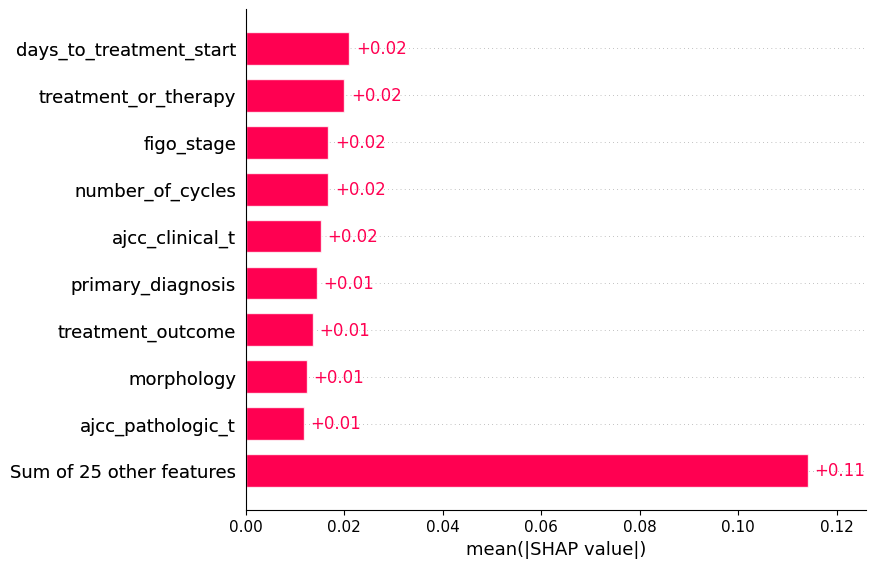

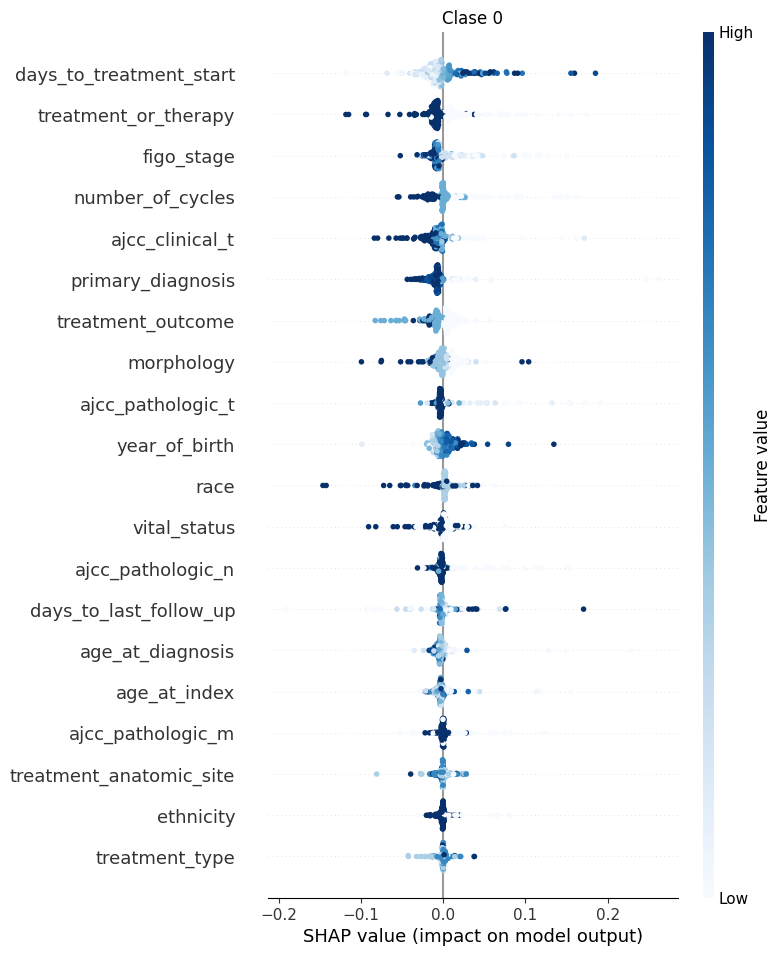

Clase 1 - SHAP values


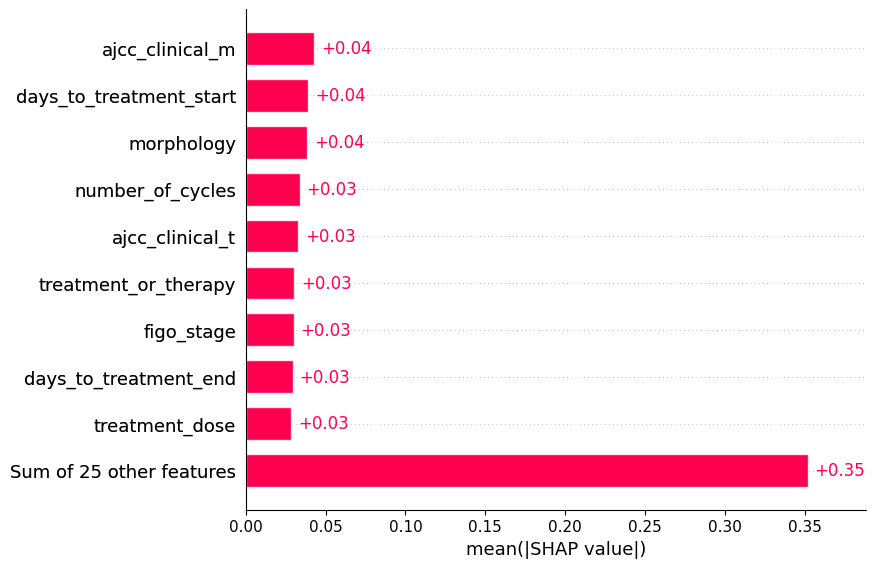

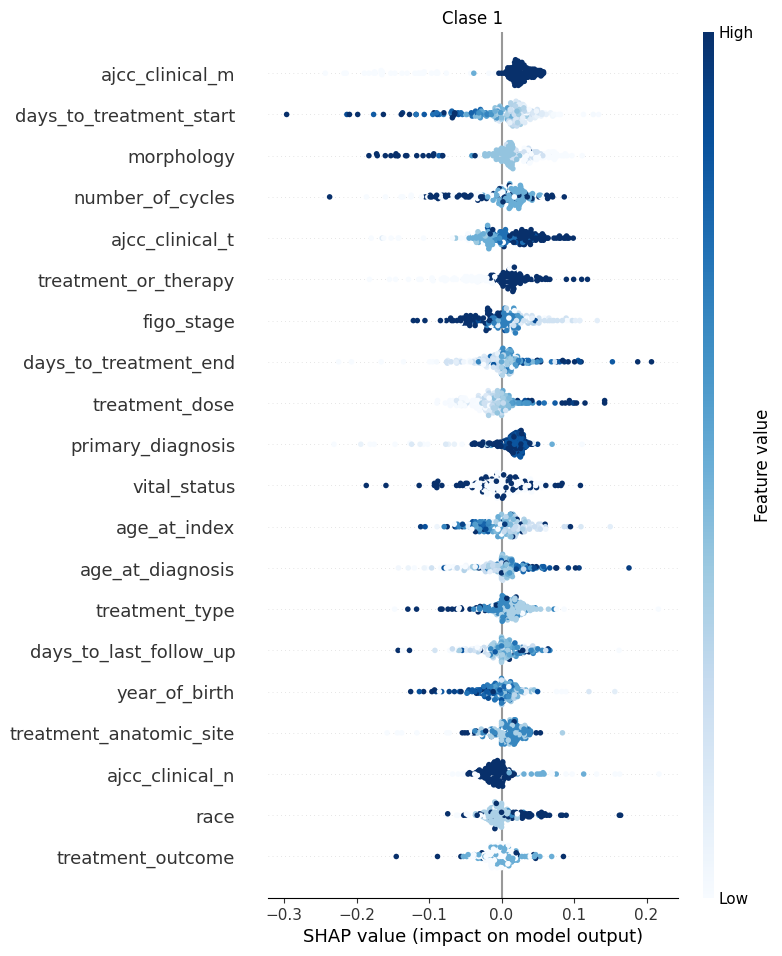

Clase 2 - SHAP values


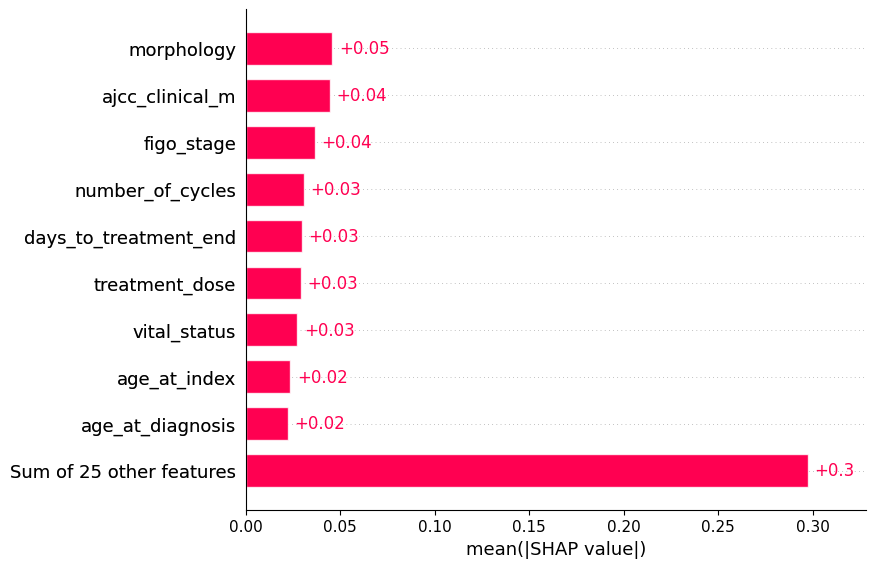

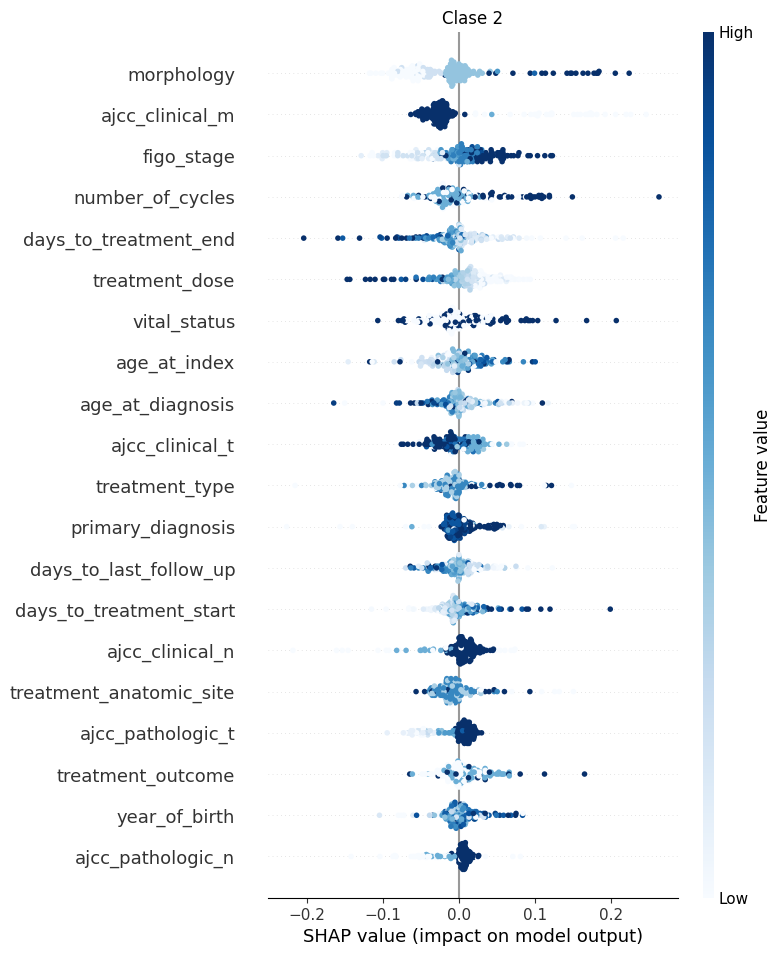

Clase 3 - SHAP values


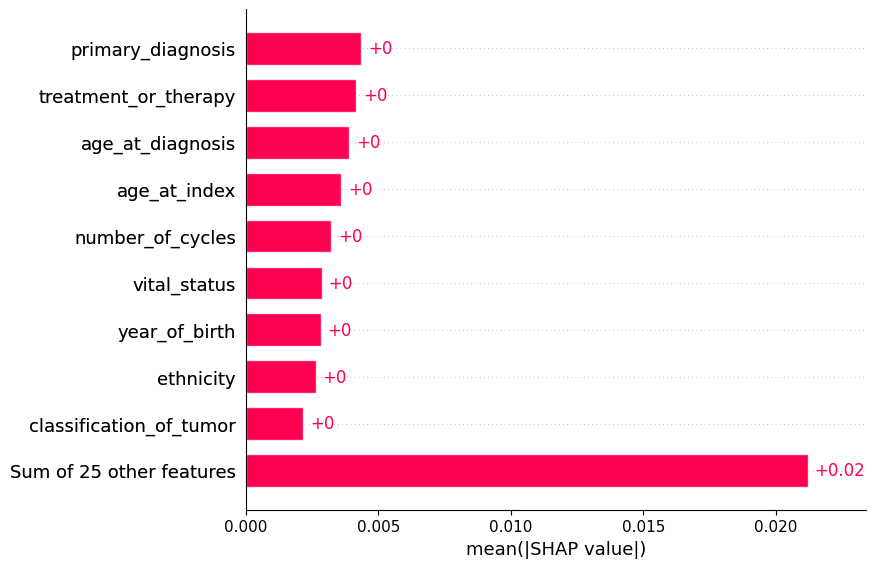

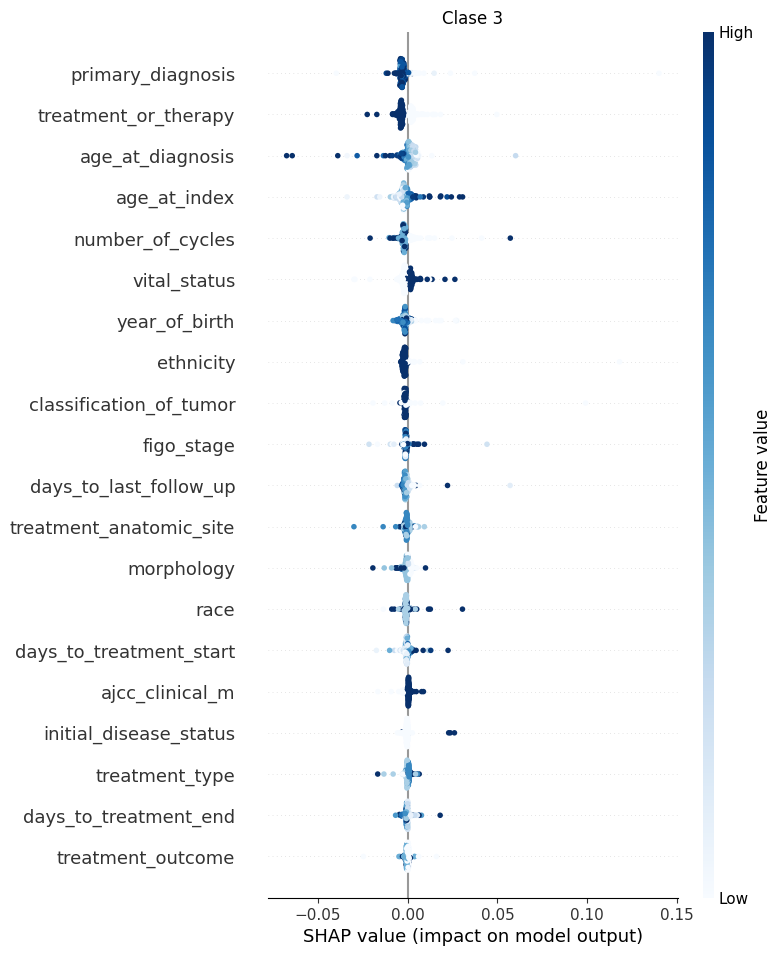

Clase 4 - SHAP values


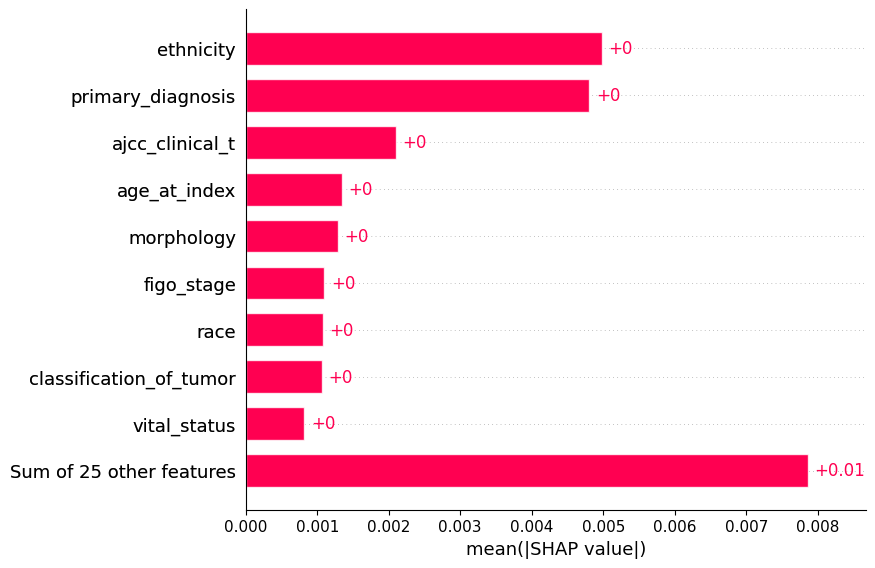

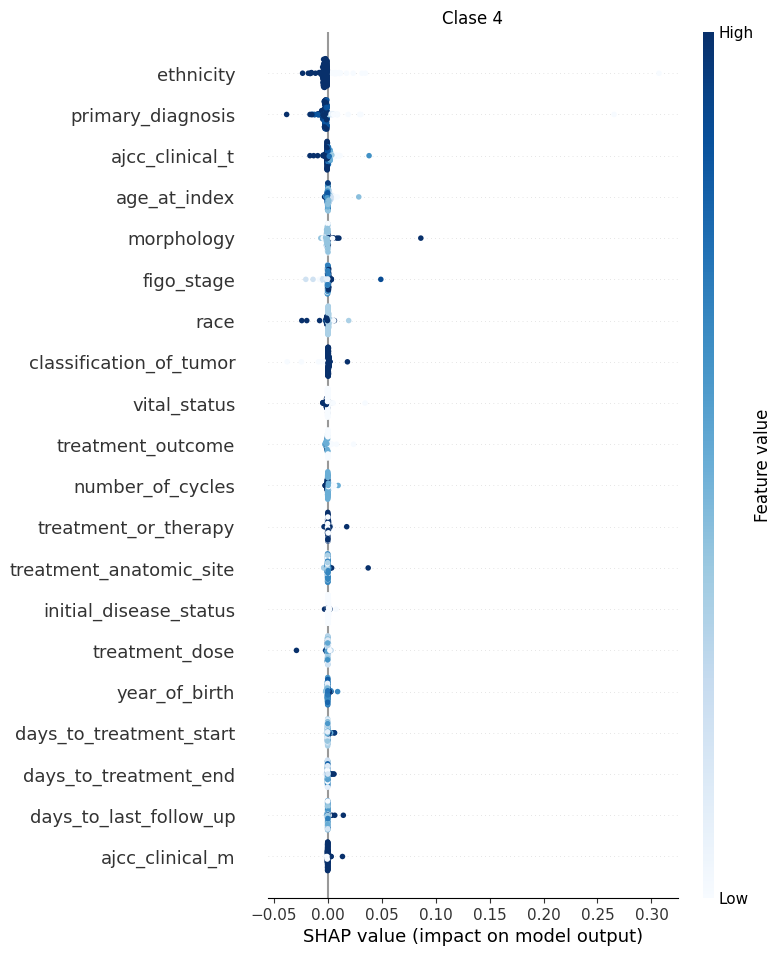

In [41]:
global_SHAP('SVM', C_clsSVM, X_train_C_SVM, X_test_C_SVM, X_C_SVM.columns)

**Características con mayor importancia para el modelo SVM con SHAP**

**Clase 0:** days_to_treament_end, treatment_or_therapy y figo_stage

Estas características aumentan la predicción de la clase 0 en 0.02 unidades, en comparación con el valor base. Para la variable 'days_to_treament_end', valores altos y medios tienden a aumentqar la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para las variables 'treatment_or_therapy' y 'figo_stage', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.11 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 1:** ajcc_clinical_m, days_to_treatment_start y morphology

Estas características aumentan la predicción de la clase 1 en 0.04 unidades, en comparación con el valor base. Para la variable 'ajcc_clinical_m', valores altos tienden a aumentar la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para las variables 'days_to_treatment_start' y 'morphology', valores altos tienden a disminuir la predicción, mientras que valores medios y bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.35 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 2:** morphology, ajcc_clinical_m y figo_stage

Estas características aumentan la predicción de la clase 2 en 0.05, 0.04 y 0.04 unidades respectivamente en comparación con el valor base. Para las variables 'morphology' y 'figo_stage', valores altos y medios impactan en el modelo aumentando la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para la variable 'ajcc_clinical_m', valores altos tienden a disminuir la predicción, mientras que valores medios y bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.3 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 3:** ninguna característica individualmente tiene un impacto significativo sobre el modelo SVM para esta clase. Sin embargo, podría considerarse que las características 'primary_diagnosis', 'treatment_or_therapy' y 'age_at_diagnosis' son las que mayor impacto tendrían.

Concretamente, para estas variables, valores altos y medios impactarían en el modelo disminuyendo la predicción, mientras que valores bajos tenderían a aumentarla.

Cabe destacar que la suma de 25 características poco influyentes aumentan la predicción 0.02 unidades, por lo que, aunque estas características no tengan un impacto individualmente, su contribución conjunta sí tiene cierto impacto.

**Clase 4:** ninguna característica individualmente tiene un impacto significativo sobre el modelo SVM para esta clase. Sin embargo, podría considerarse que las características 'ethnicity', 'primary_diagnosis' y 'ajcc_clinical_t' son las que mayor impacto tendrían. 

Concretamente, para estas variables, valores altos y medios impactarían en el modelo disminuyendo la predicción, mientras que valores bajos tenderían a aumentarla.

Cabe destacar que la suma de 25 características poco influyentes aumentan la predicción 0.01 unidades, por lo que, aunque estas características no tengan un impacto individualmente, su contribución conjunta sí tiene cierto impacto.

#### Explicación con SHAP del modelo XGBoost

Clase 0 - SHAP values


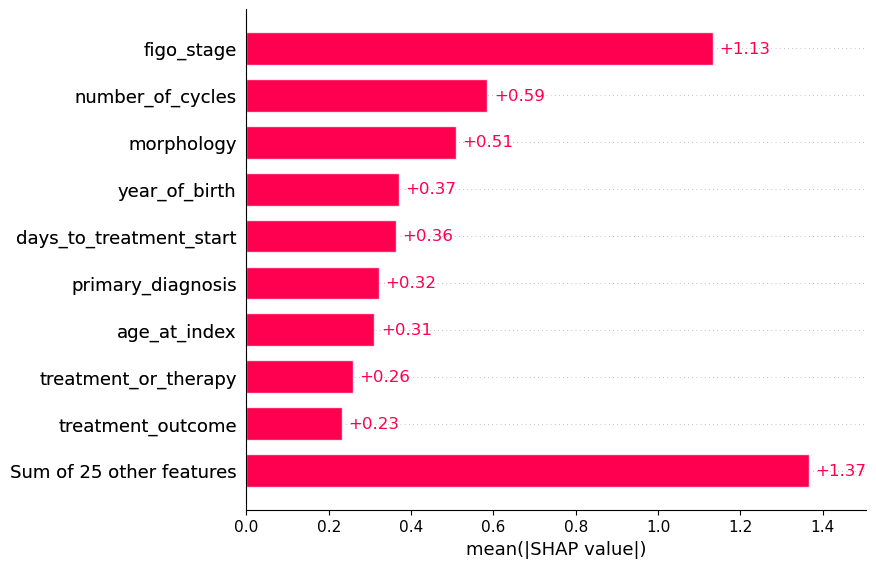

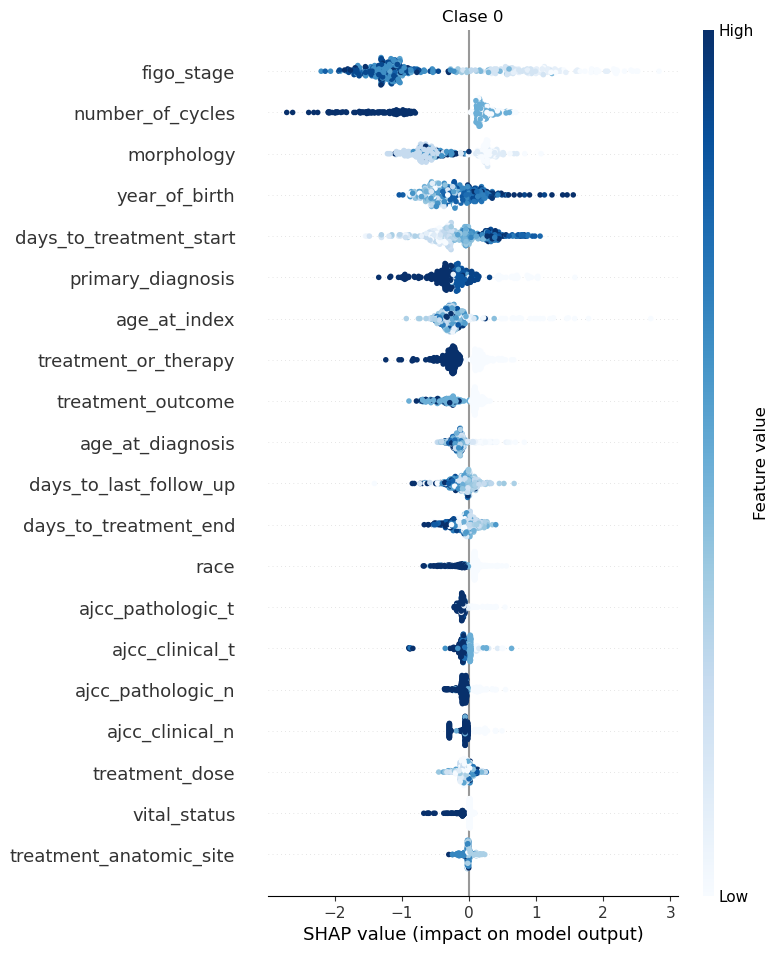

Clase 1 - SHAP values


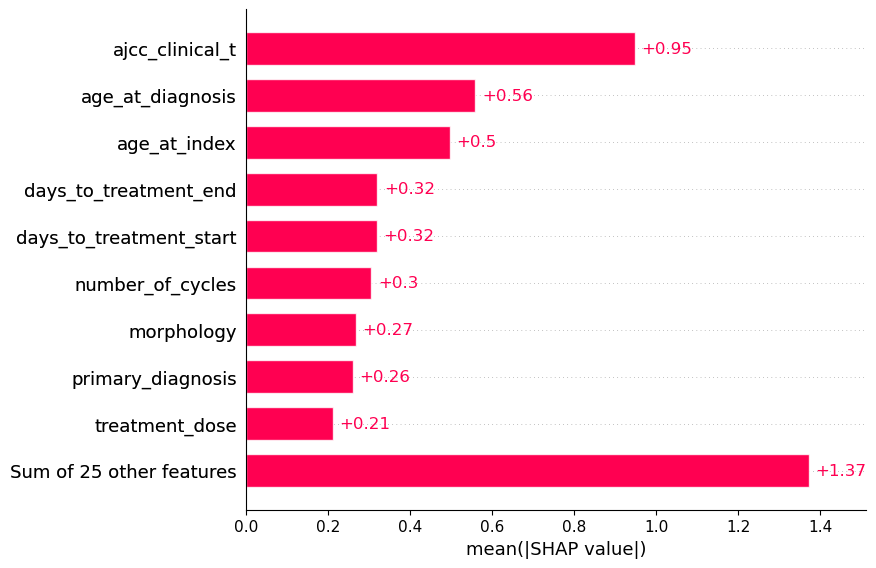

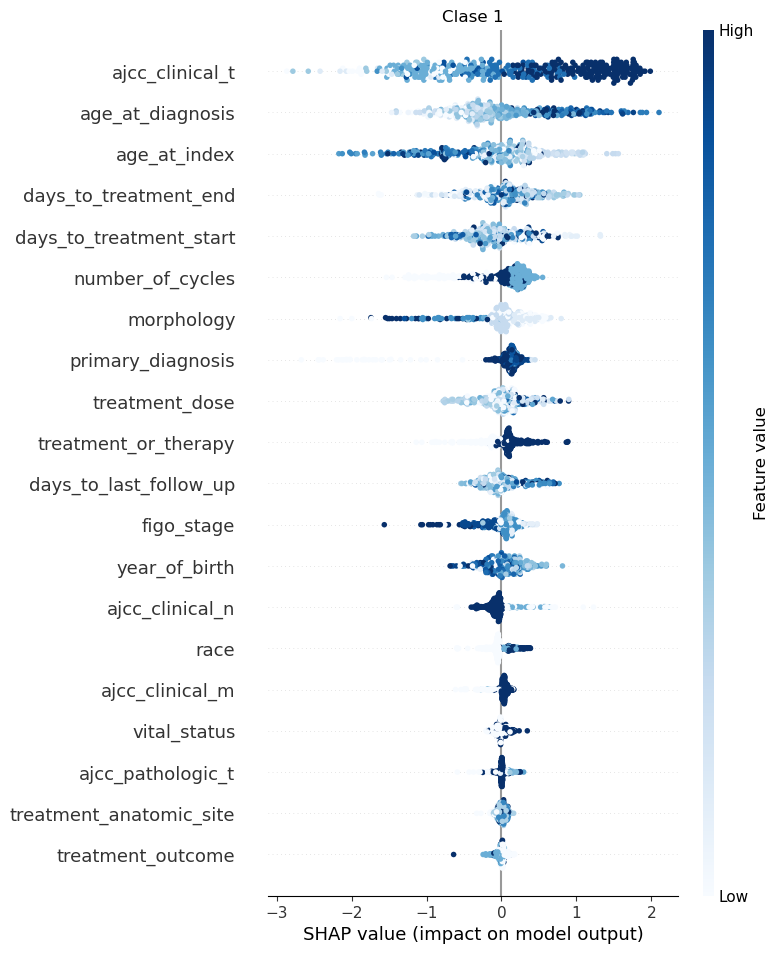

Clase 2 - SHAP values


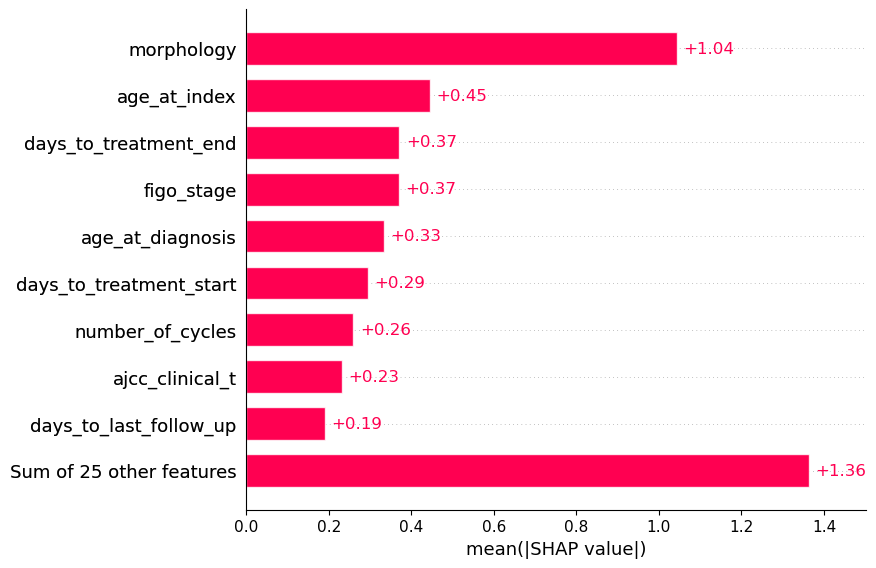

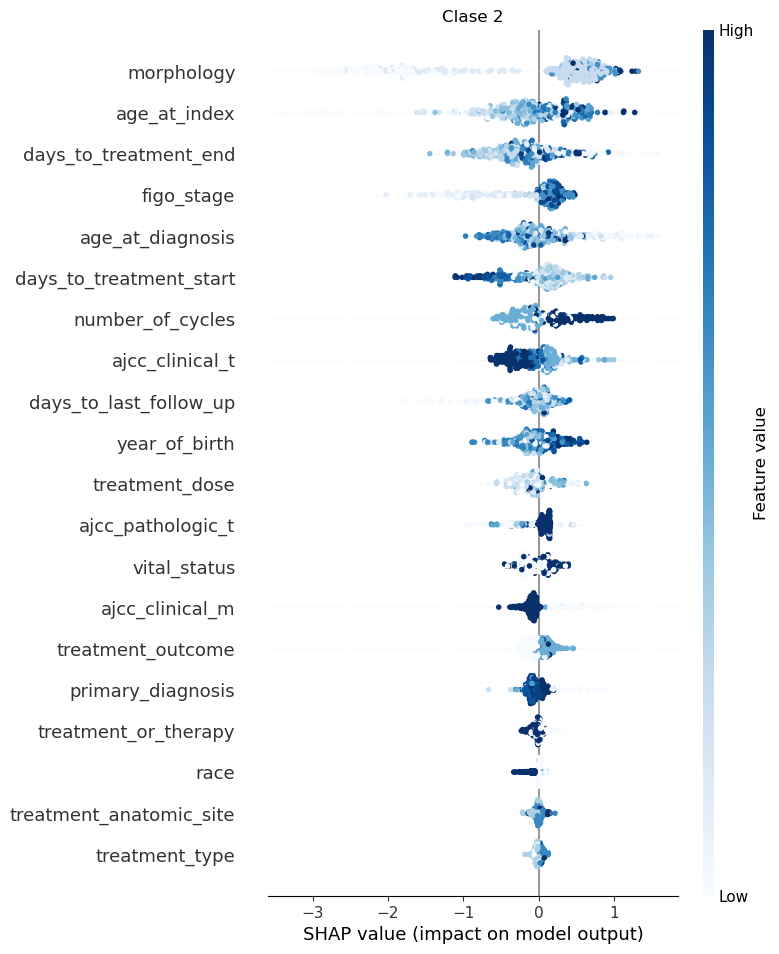

Clase 3 - SHAP values


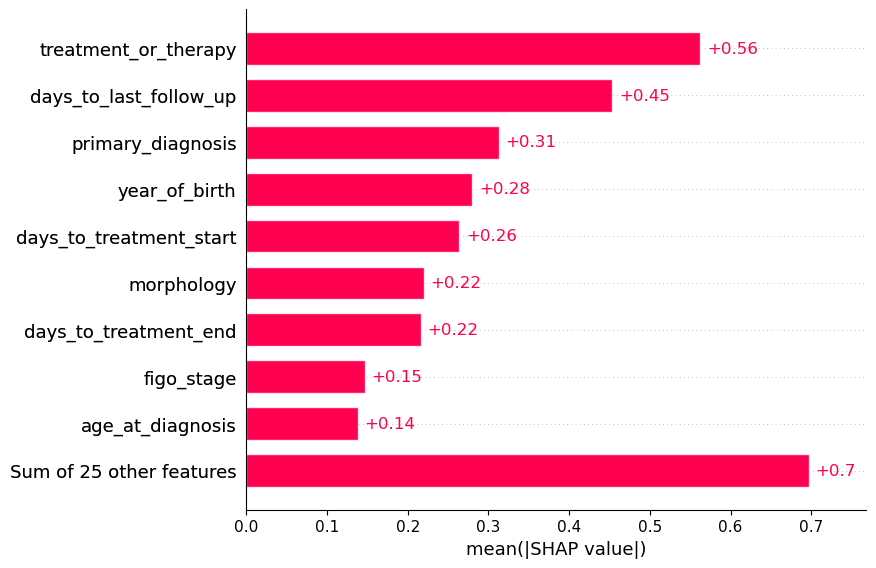

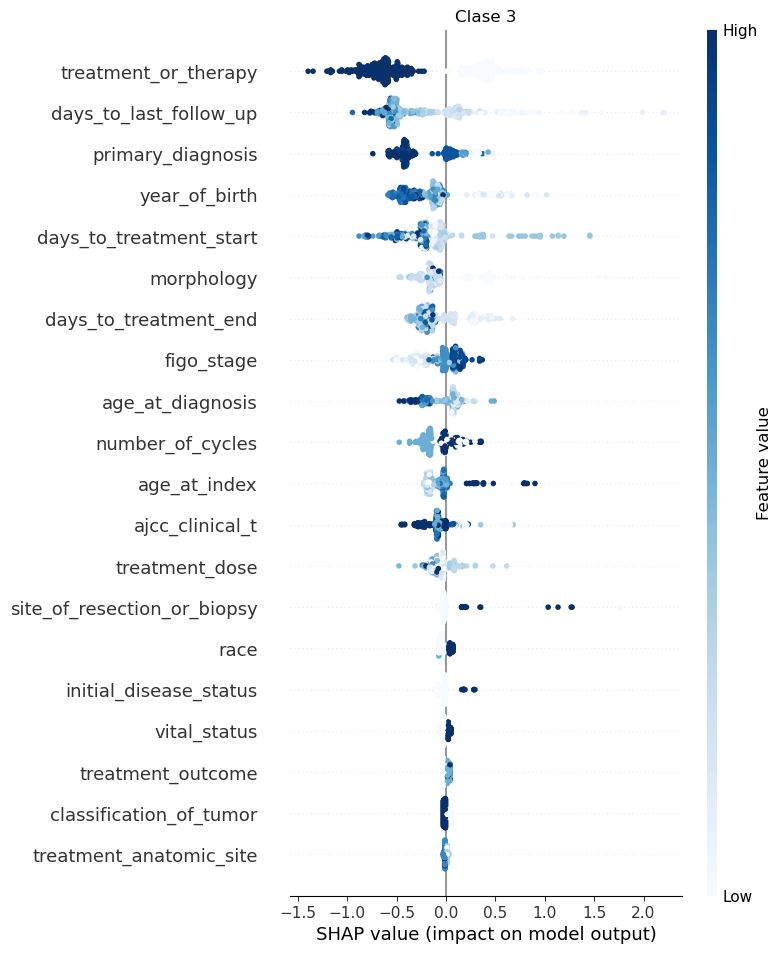

Clase 4 - SHAP values


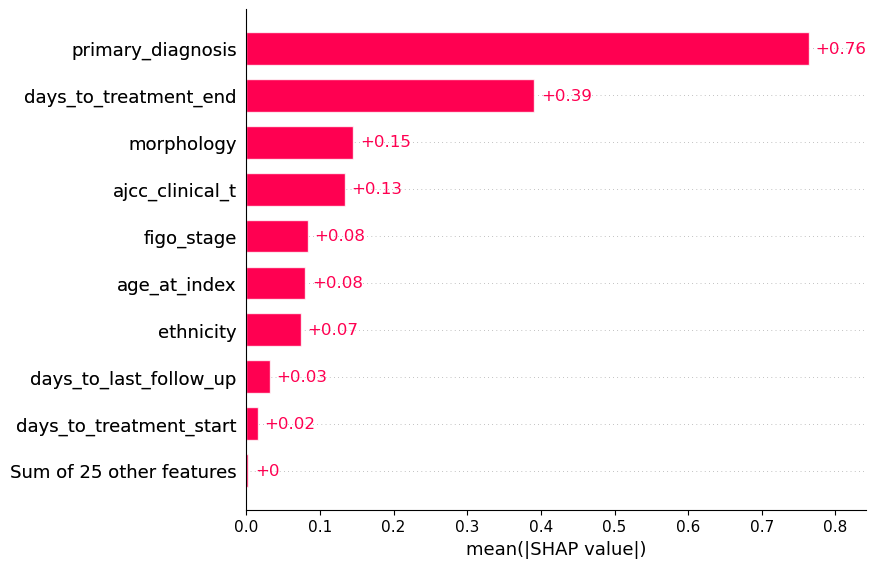

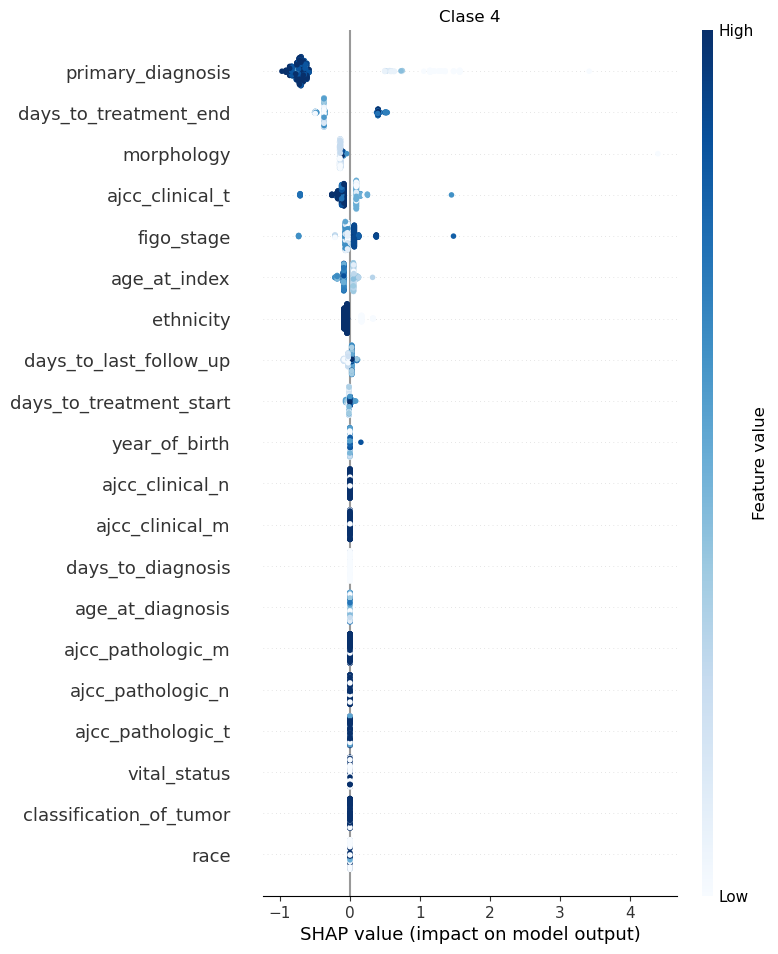

In [ ]:
X_test_C_XG_array = np.array(X_test_C_XG)

X_C_XG2 = df_C2.drop('tumor_grade',axis=1)
labels_XG = X_C_XG2.columns

global_SHAP('XG', C_clsXG, X_train_C_XG, X_test_C_XG_array, labels_XG)

**Características con mayor importancia para el modelo XG con SHAP**

**Clase 0:** figo_stage, number_of_cycles y morphology

Estas características aumentan la predicción de la clase 0 en 1.13, 0.59 y 0.51 unidades respectivamente en comparación con el valor base. Para las variables 'figo_stage' y 'number_of_cycles', valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. Por otro lado, para la variable 'morphology', valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. 

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 1.37 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 1:** ajcc_clinical_t, age_at_diagnosis y age_at_index

Estas características aumentan la predicción de la clase 1 en 0.95, 0.56 y 0.5 unidades respectivamente en comparación con el valor base. Para las variables 'ajcc_clinical_t' y 'age_at_diagnosis', valores altos impactan en el modelo aumentando la predicción, mientras que valores medios y bajos tienden a disminuirla. Por el contrario, para la variable 'age_at_index', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 1.37 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 2:** morphology, age_at_index y days_to_treatment_end

Estas características aumentan la predicción de la clase 2 en 1.04, 0.45 y 0.37 unidades respectivamente en comparación con el valor base. Para la variable 'morphology', valores altos y medios impactan en el modelo aumentando la predicción, mientras que valores bajos tienden a disminuirla. Por otro lado, para las variables 'age_at_index' y 'days_to_treatment_end', valores altos tienden a aumentar la predicción, mientras que valores medios y bajos tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 1.36 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 3:** treatment_or_therapy, days_to_last_follow_up y primary_diagnosis

Estas características aumentan la predicción de la clase 3 en 0.56, 0.45 y 0.31 unidades respectivamente en comparación con el valor base. Para estas variables, valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. 

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.7 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 4:** primary_diagnosis, days_to_treatment_end y morphology 

Estas características aumentan la predicción de la clase 4 en 0.76, 0.39 y 0.15 unidades respectivamente en comparación con el valor base. Para la variable 'primary_diagnosis', valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. Por el contrario, para las variables 'days_to_treatment_end' y 'morphology', valores altos tienden a aumentar la predicción, mientras que valores medios y bajos tienden a disminuirla.

#### Explicación con SHAP del modelo MLP

  0%|          | 0/387 [00:00<?, ?it/s]

Clase 0 - SHAP values


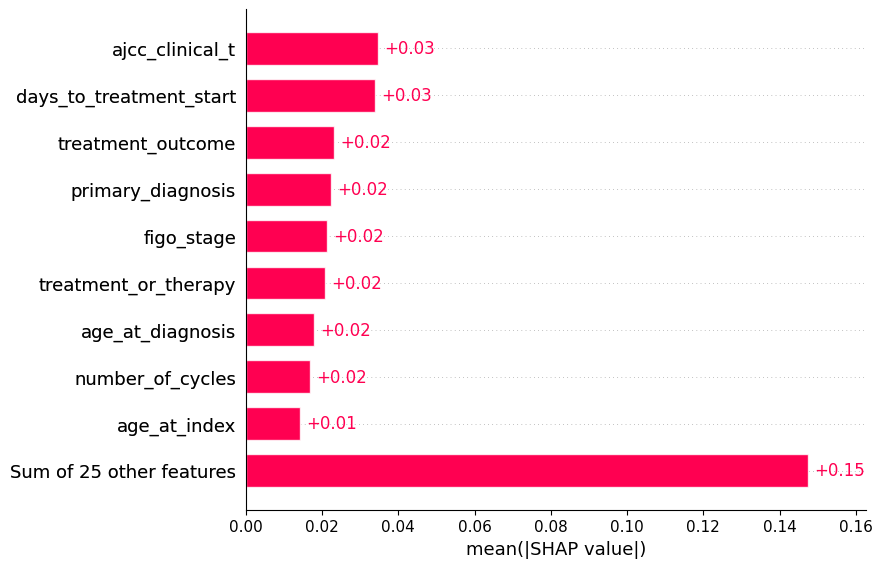

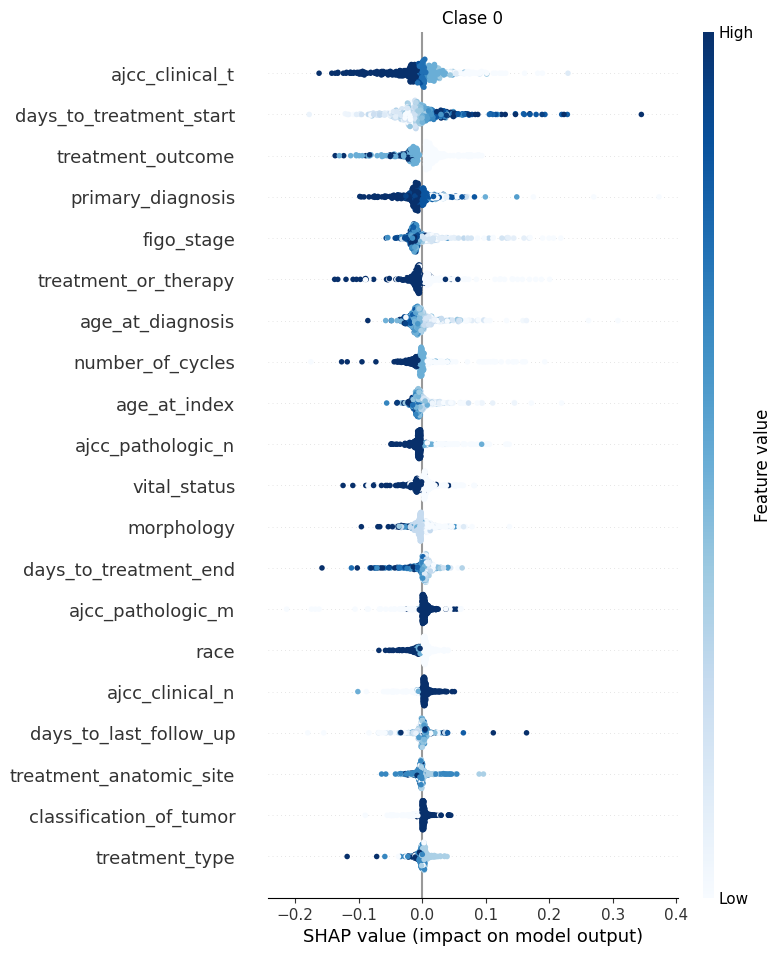

Clase 1 - SHAP values


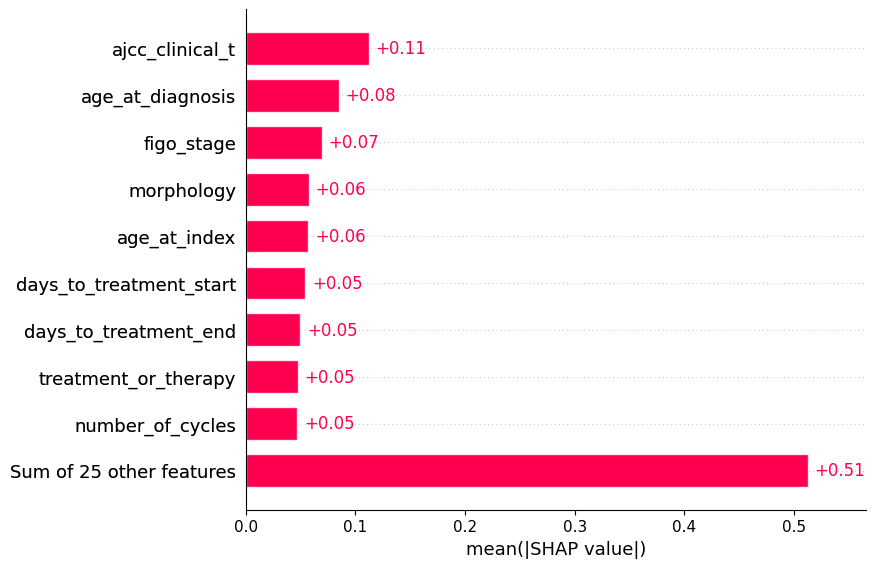

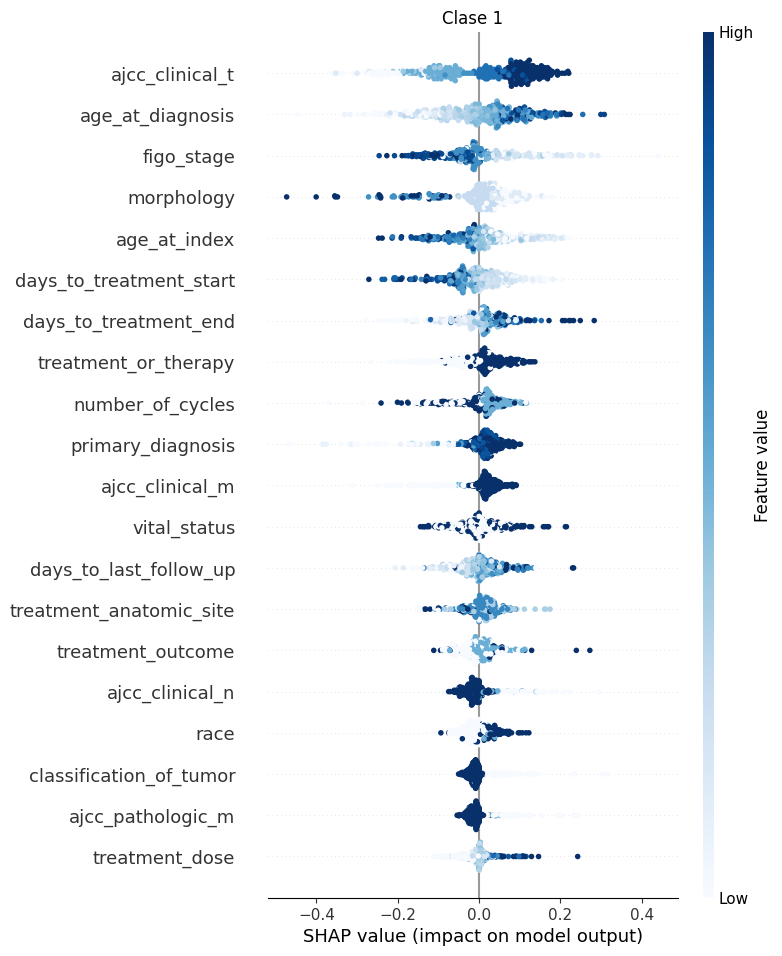

Clase 2 - SHAP values


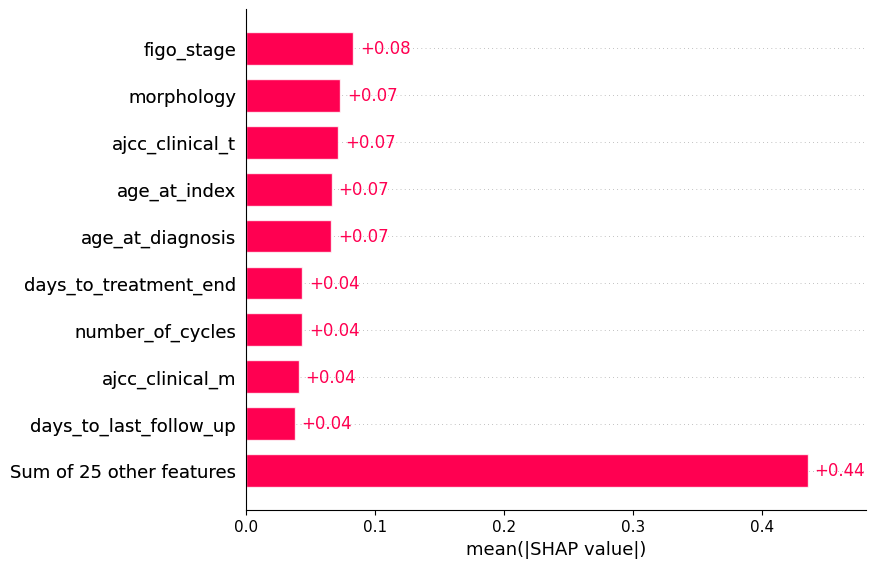

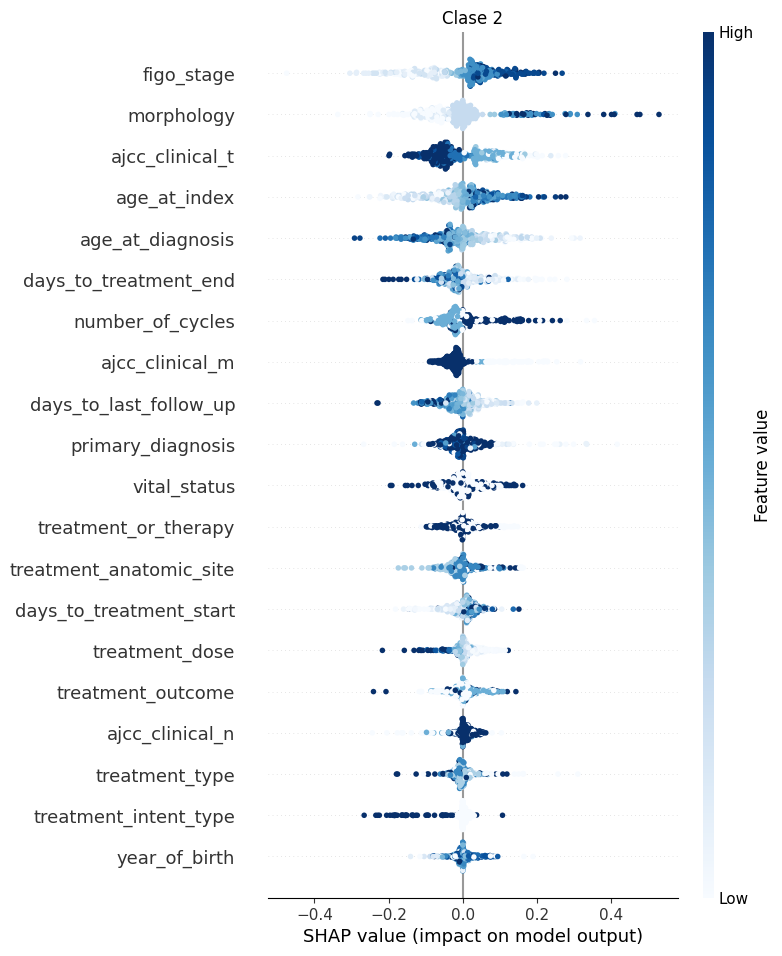

Clase 3 - SHAP values


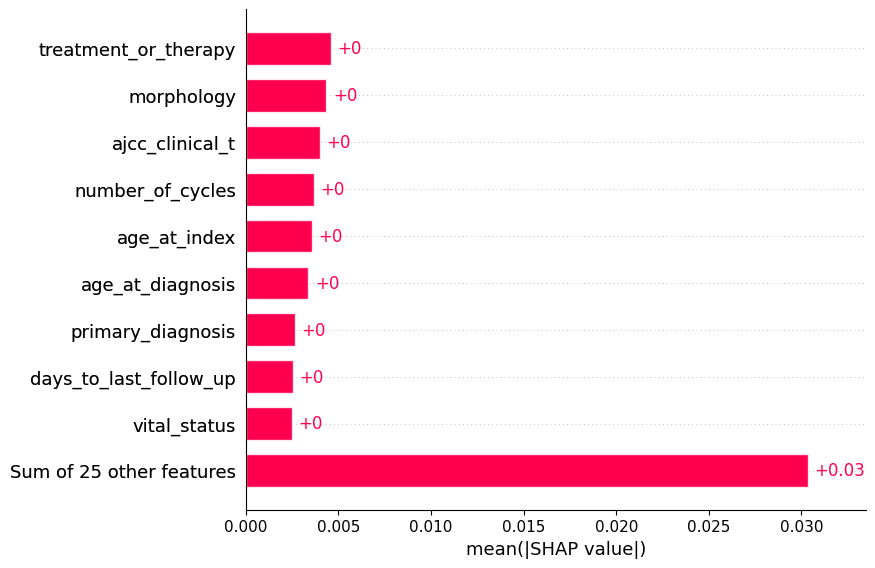

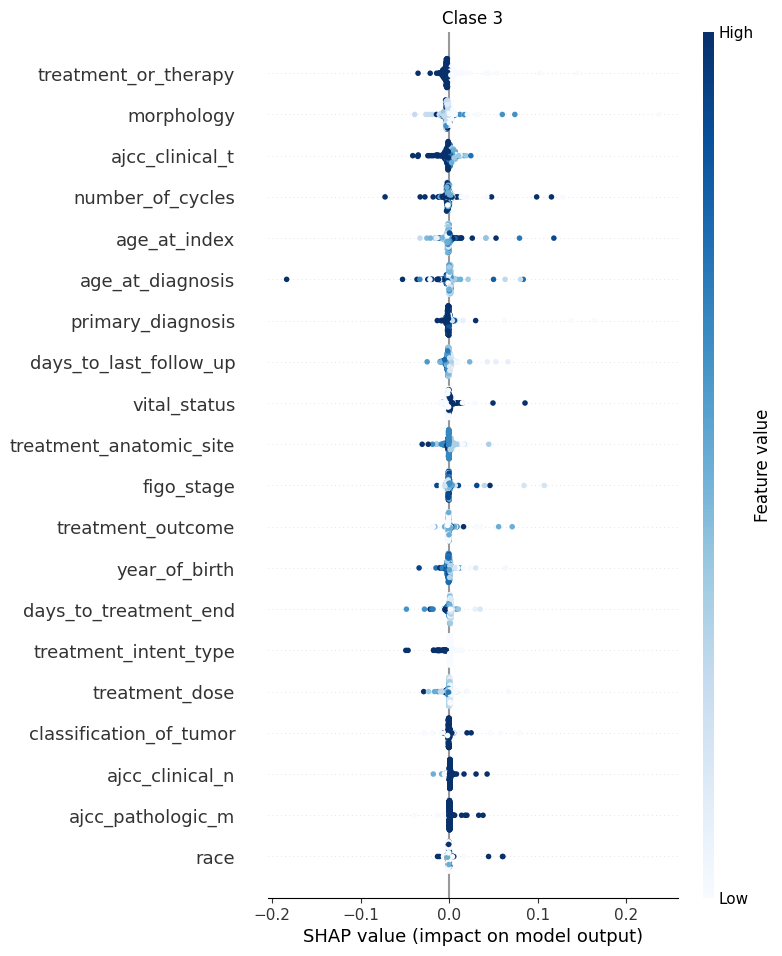

Clase 4 - SHAP values


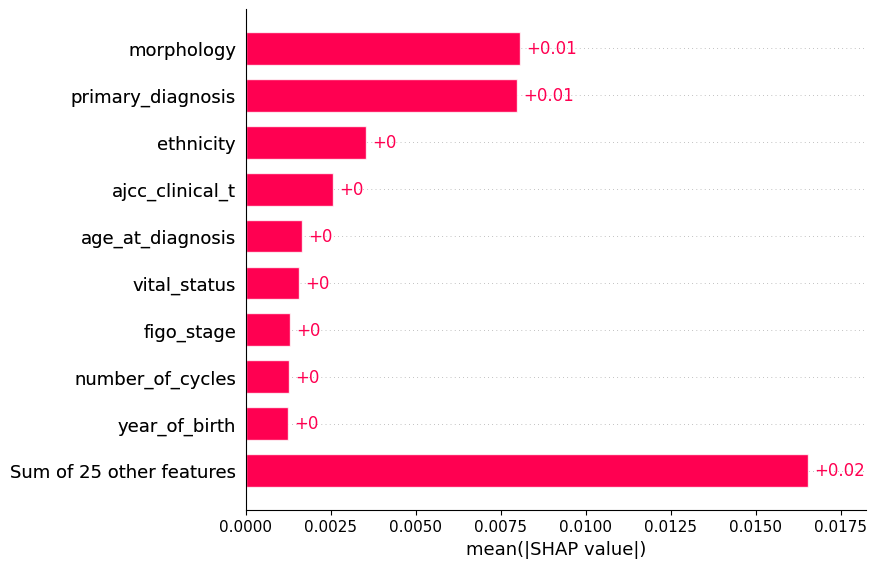

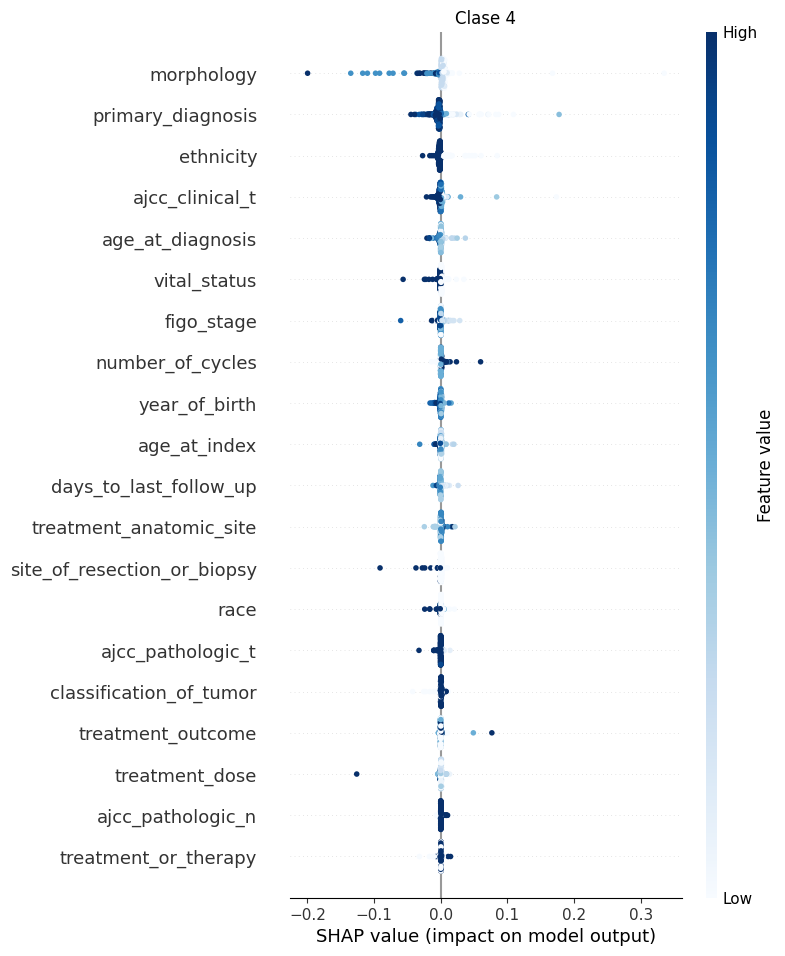

In [42]:
X_test_C_MLP_array = np.array(X_test_C_MLP)

X_C_MLP2 = df_C2.drop('tumor_grade',axis=1)
labels_MLP = X_C_MLP2.columns

global_SHAP('MLP', C_clsMLP, X_train_C_MLP, X_test_C_MLP_array, labels_MLP)

**Características con mayor importancia para el modelo MLP con SHAP**

**Clase 0:** ajcc_clinical_t, days_to_treatment_start y treatment_outcome

Estas características aumentan la predicción de la clase 0 en 0.03, 0.03 y 0.02 unidades respectivamente en comparación con el valor base. Para las variables 'ajcc_clinical_t' y 'treatment_outcome' valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. Por el contrario, para la variable 'days_to_treatment_start', valores altos y medios tienden a aumentar la predicción, mientras que valores bajos tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.15 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 1:** ajcc_clinical_t, age_at_diagnosis y figo_stage

Estas características aumentan la predicción de la clase 1 en 0.11, 0.08 y 0.07 unidades respectivamente en comparación con el valor base. Para las variables 'ajcc_clinical_t' y 'age_at_diagnsosis' valores altos y medios impactan en el modelo aumentando la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para la variable 'figo_stage', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.51 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 2:** figo_stage, morphology y ajcc_clinical_t

Estas características aumentan la predicción de la clase 2 en 0.08, 0.07 y 0.07 unidades respectivamente en comparación con el valor base. Para las variables 'figo_stage' y 'morphology' valores altos y medios impactan en el modelo aumentando la predicción, mientras que valores bajos tienden a disminuirla. Por el contrario, para la variable 'ajcc_clinical_t', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.44 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

**Clase 3:** ninguna característica individualmente tiene un impacto significativo sobre el modelo MLP para esta clase. Sin embargo, podría considerarse que las características 'treatment_or_therapy', 'morphology' y 'ajcc_clinical_t' son las que mayor impacto tendrían. 

Concretamente, para estas variables, valores altos y medios impactarían en el modelo disminuyendo la predicción, mientras que valores bajos tenderían a aumentarla.

Cabe destacar que la suma de 25 características poco influyentes aumentan la predicción 0.03 unidades, por lo que, aunque estas características no tengan un impacto individualmente, su contribución conjunta sí tiene cierto impacto.

**Clase 4:** morphology y primary_diagnosis

Estas características aumentan la predicción de la clase 4 en 00.01 unidades, en comparación con el valor base. Para estas variables, valores altos y medios impactan en el modelo disminuyendo la predicción, mientras que valores bajos tienden a aumentarla. 

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.02 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

### LIME (global)

In [62]:
from aix360.algorithms.lime import LimeTabularExplainer
from collections import defaultdict

In [63]:
def global_LIME(id_model, model, data_train, data_test, labels, num_samples=387):

    data_train_array = np.array(data_train)
    data_test_array = np.array(data_test)

    explainer_LIME = LimeTabularExplainer(data_train_array, feature_names=labels, class_names=['tumor_grade'],
                                          verbose=False, mode='classification', random_state=2)

    explanations = []

    if id_model in ['DT','RF','SVM','XG','MLP']:
        for i in range(num_samples):
            exp = explainer_LIME.explain_instance(data_test_array[i], model.predict_proba)
            explanations.append(exp)
    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None

    feature_importance = defaultdict(float)

    for exp in explanations:
        for feature, weight in exp.as_list():
            feature_importance[feature] += weight

    total_weight = sum(abs(weight) for weight in feature_importance.values())

    for feature in feature_importance:
        feature_importance[feature] /= total_weight

    importance_df = pd.DataFrame(list(feature_importance.items()), columns=['Feature', 'Importance'])
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    top_5_df = importance_df.head(5)

    for index, row in top_5_df.iterrows():
        print(f"{row['Feature']}: {row['Importance']}")

    plt.figure(figsize=(5,3))
    plt.barh(top_5_df['Feature'][::-1], top_5_df['Importance'][::-1], color='blue')
    plt.xlabel('Importance')
    plt.title('Top 5 Features')
    plt.show()

#### Explicación con LIME global del modelo de Árboles de Decisión

morphology <= -0.46: 0.13399893416093817
0.19 < ajcc_clinical_t <= 0.95: 0.10387354111814576
age_at_diagnosis > 0.56: 0.0422193491298193
figo_stage <= -1.14: 0.03767009099285839
primary_diagnosis <= 0.15: 0.028838078056725624


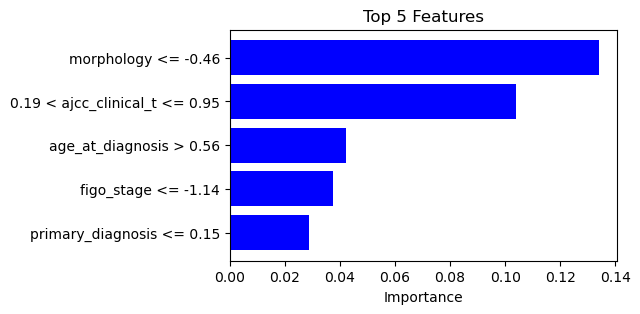

In [ ]:
global_LIME('DT', C_clsDT, X_train_C_DT, X_test_C_DT, X_C_DT.columns)

**Características con mayor importancia para el modelo DT con LIME global:** morphology, ajcc_clinical_t y age_at_diagnosis

Respectivamente estas características aumentan la predicción del modelo en 0.14, 0.1 y 0.04 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo Random Forest

0.19 < ajcc_clinical_t <= 0.95: 0.1428528421812614
morphology <= -0.46: 0.14034062544194276
age_at_diagnosis > 0.56: 0.060413559253040136
age_at_index <= -0.64: 0.03151387296180857
-0.68 < days_to_treatment_end <= -0.18: 0.019361897167199618


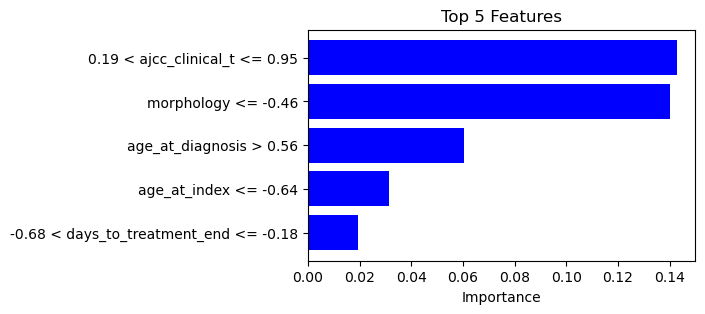

In [ ]:
X_test_C_RF_array = np.array(X_test_C_RF)

X_C_RF2 = df_C2.drop('tumor_grade',axis=1)
labels_RF = X_C_RF2.columns

global_LIME('RF', C_clsRF, X_train_C_RF, X_test_C_RF_array, labels_RF)

**Características con mayor importancia para el modelo RF con LIME global:** ajcc_clinical_t, morphology y age_at_diagnosis

Respectivamente estas características aumentan la predicción del modelo en 0.14, 0.14 y 0.06 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo SVM

pregnant_at_diagnosis <= -0.07: 0.16189600935655946
number_of_cycles <= -0.19: 0.07496170911022229
0.19 < ajcc_clinical_t <= 0.95: 0.05140728423669238
initial_disease_status <= -0.21: 0.04279180923089412
morphology <= -0.46: 0.0365021751411488


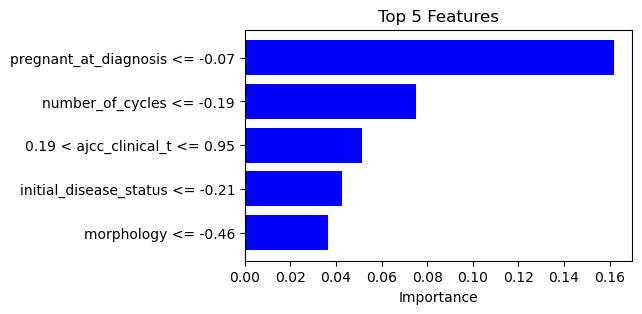

In [ ]:
global_LIME('SVM', C_clsSVM, X_train_C_SVM, X_test_C_SVM, X_C_SVM.columns)

**Características con mayor importancia para el modelo SVM con LIME global:** pregnant_at_diagnosis, number_of_cycles y ajcc_clinical_t

Respectivamente estas características aumentan la predicción del modelo en 0,16, 0.075 y 0.05 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo XGBoost

0.19 < ajcc_clinical_t <= 0.95: 0.10668661663923629
morphology <= -0.46: 0.0810491778311842
age_at_diagnosis > 0.56: 0.05783184139368274
age_at_index <= -0.64: 0.050748624620374584
ajcc_pathologic_t <= 0.53: 0.038960784413281394


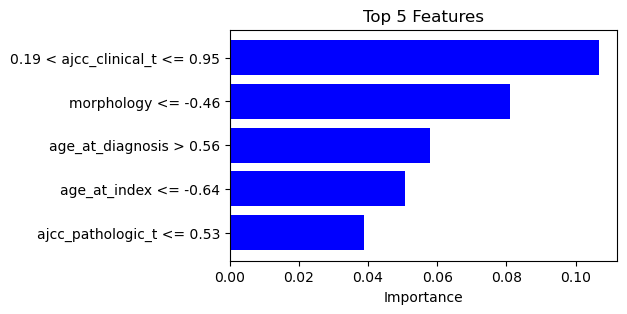

In [ ]:
X_test_C_XG_array = np.array(X_test_C_XG)

X_C_XG2 = df_C2.drop('tumor_grade',axis=1)
labels_XG = X_C_XG2.columns

global_LIME('XG', C_clsXG, X_train_C_XG, X_test_C_XG_array, labels_XG)

**Características con mayor importancia para el modelo XG con LIME global:** ajcc_clinical_t, morphology y age_at_diagnosis

Respectivamente estas características aumentan la predicción del modelo en 0.11, 0.08 y 0.06 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo MLP

pregnant_at_diagnosis <= -0.07: 0.06598845090122903
0.19 < ajcc_clinical_t <= 0.95: 0.059500779364453756
morphology <= -0.46: 0.039405929309592795
age_at_diagnosis > 0.56: 0.028150468816619797
race > 0.51: 0.027413933147452597


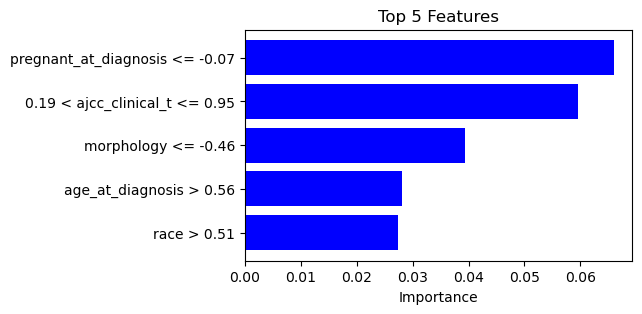

In [ ]:
X_test_C_MLP_array = np.array(X_test_C_MLP)

X_C_MLP2 = df_C2.drop('tumor_grade',axis=1)
labels_MLP = X_C_MLP2.columns

global_LIME('MLP', C_clsMLP, X_train_C_MLP, X_test_C_MLP_array, labels_MLP)

**Características con mayor importancia para el modelo MLP con LIME global:** pregnant_at_diagnosis, ajcc_clinical_t y morphology

Respectivamente estas características aumentan la predicción del modelo en 0.066, 0.06 y 0.039 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

### Explicaciones locales para entender el modelo basadas en la presencia de características mediante métodos post-hoc (explicativos extrínsecos)

### LIME (local)

In [63]:
def local_LIME(i, id_model, model, data_train, data_test, labels):

    data_train_array = np.array(data_train)
    data_test_array = np.array(data_test)

    if hasattr(model, 'classes_'):
        class_names = [f'Clase {j}' for j in model.classes_]

    explainer_LIME = LimeTabularExplainer(data_train_array, feature_names=labels, class_names=class_names,
                                          verbose=True, mode='classification', random_state=2)


    if id_model in ['DT','RF','SVM','XG','MLP']:
        explanation = explainer_LIME.explain_instance(data_test_array[i], model.predict_proba)

    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None

    explanation_list = explanation.as_list()
    explanation_df = pd.DataFrame(explanation_list, columns=['Feature', 'Contribution'])
    display(explanation_df)

    explanation.show_in_notebook(show_table=True) # EJECUTAR DE NUEVO TODAS LAS CELDAS INFERIORES PARA VER LAS TABLAS LIME

#### Explicación con LIME local del modelo de Árboles de Decisión

In [64]:
local_LIME(67, 'DT', C_clsDT, X_train_C_DT, X_test_C_DT, X_C_DT.columns)

Intercept 0.523425718456774
Prediction_local [0.48802568]
Right: 1.0


,Feature,Contribution
0,morphology <= -0.46,0.216321
1,age_at_diagnosis <= -0.63,-0.125972
2,year_of_birth > 0.73,-0.077536
3,0.15 < primary_diagnosis <= 0.37,-0.069585
4,age_at_index <= -0.72,0.058796
5,-0.69 < days_to_treatment_end <= -0.16,0.056018
6,pregnant_at_diagnosis <= -0.07,-0.052487
7,-0.56 < ajcc_clinical_t <= 0.19,-0.044819
8,prior_malignancy <= -0.10,0.042732
9,0.25 < figo_stage <= 1.09,-0.038868


Teniendo en cuenta lo siguiente:
* **Barras de predicción**: probabilidad de pertenencia a cada una de las posibles clases según LIME.
* **Gráfico de barras:** magnitud y dirección de la contribución de cada característica a la predicción. Las barras naranjas representan la contribución a la clase predicha por LIME, mientras que las barras azules representan la contribución al resto de clases.
* **Tabla:** características más influyentes y sus respectivas contribuciones a la predicción.

In [65]:
y_pred_C_DT[67]

1

**Características con mayor importancia para la instancia 67 del modelo DT con LIME local:** morphology, age_at_diagnosis y year_of_birth

Respectivamente estas características contribuyen a la predicción del modelo en -0.46, -2.01 y 0.82 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo DT corresponde a la clase 1 (G2), coincidiendo con la predicción local de LIME, que también corresponde a la clase 1 (G2).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'morphology', 'age_at_index' y 'days_to_treatment_end' son las que más contribuyen a la clase 1 (en 0.22, 0.06 y 0.06 unidades respectivamente), mientras que las variables 'age_at_diagnosis', 'year_of_birth' y 'primary_diagnosis' contribuyen más al resto de clases (en -0.13, -0.08 y -0.07 unidades respectivamente).

#### Explicación con LIME local del modelo Random Forest

In [66]:
X_C_RF2 = df_C2.drop('tumor_grade',axis=1)
labels_RF = X_C_RF2.columns

local_LIME(67, 'RF', C_clsRF, X_train_C_RF, X_test_C_RF, labels_RF)

Intercept 0.47903861288614136
Prediction_local [0.69825464]
Right: 0.9643636363636364


,Feature,Contribution
0,morphology <= -0.46,0.161833
1,0.19 < ajcc_clinical_t <= 0.95,0.146452
2,age_at_diagnosis <= -0.63,-0.115013
3,age_at_index <= -0.64,0.039152
4,pregnant_at_diagnosis <= -0.07,-0.029521
5,prior_malignancy <= -0.10,-0.026069
6,treatment_frequency <= -0.02,0.023058
7,-0.57 < race <= 0.51,0.017718
8,vital_status <= -0.80,0.017006
9,year_of_birth > 0.73,-0.015400


In [67]:
y_pred_C_RF[67]

1

**Características con mayor importancia para la instancia del modelo RF con LIME local:** morphology, ajcc_clinical_t y age_at_diagnosis

Respectivamente estas características contribuyen a la predicción del modelo en -0.92, 0.95 y -1.36 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo DT corresponde a la clase 1 (G2), coincidiendo con la predicción local de LIME, que también corresponde a la clase 1 (G2).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'morphology', 'ajcc_clinical_t' y 'age_at_index' son las que más contribuyen a la clase 1 (en 0.16, 0.15 y 0.04 unidades respectivamente), mientras que las variables 'age_at_diagnosis', 'pregnant_at_diagnosis' y 'prior_malignancy' contribuyen más al resto de clases (en -0.12, -0.03 y -0.03 unidades respectivamente).

#### Explicación con LIME local del modelo SVM

In [68]:
local_LIME(67, 'SVM', C_clsSVM, X_train_C_SVM, X_test_C_SVM, X_C_SVM.columns)

Intercept 0.6972817375210342
Prediction_local [0.75470002]
Right: 0.8573414925436592


,Feature,Contribution
0,days_to_treatment_start > 0.39,-0.112071
1,therapeutic_agents <= -0.12,-0.106412
2,pregnant_at_diagnosis <= -0.07,0.098574
3,days_to_treatment_end > 0.50,0.069820
4,treatment_outcome > 0.66,-0.061694
5,0.19 < ajcc_clinical_t <= 0.95,0.056755
6,morphology <= -0.46,0.048178
7,number_of_cycles <= -0.19,0.044714
8,days_to_last_follow_up > 0.32,0.043079
9,ajcc_pathologic_t <= 0.53,-0.023525


In [69]:
y_pred_C_SVM[67]

1

**Características con mayor importancia para la instancia 67 del modelo SVM con LIME local:** days_to_treatment_start, therapeutic_agents y pregnant_at_diagnosis

Respectivamente estas características contribuyen a la predicción del modelo en 1.06, -0.12 y -0.07 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo DT corresponde a la clase 1 (G2), coincidiendo con la predicción local de LIME, que también corresponde a la clase 1 (G2).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'pregnant_at_diagnosis', 'days_to_treatment_end' y 'ajcc_clinical_t' son las que más contribuyen a la clase 1 (en 0.10, 0.07 y 0.06 unidades respectivamente), mientras que las variables 'days_to_treatment_start', 'therapeutic_agents' y 'treatment_outcome' contribuyen más al resto de clases (en -0.11, -0.11 y -0.06 unidades respectivamente).

#### Explicación con LIME local del modelo XGBoost

In [70]:
X_C_XG2 = df_C2.drop('tumor_grade',axis=1)
labels_XG = X_C_XG2.columns

local_LIME(67, 'XG', C_clsXG, X_train_C_XG, X_test_C_XG, labels_XG)

Intercept 0.34912903274597135
Prediction_local [0.62805458]
Right: 0.9989047


,Feature,Contribution
0,0.19 < ajcc_clinical_t <= 0.95,0.201074
1,morphology <= -0.46,0.178611
2,age_at_diagnosis <= -0.63,-0.172533
3,age_at_index <= -0.64,0.157490
4,year_of_birth > 0.73,-0.092470
5,prior_malignancy <= -0.10,0.085783
6,-0.57 < race <= 0.51,0.048505
7,treatment_or_therapy <= -1.25,-0.043719
8,days_to_diagnosis <= -0.14,-0.043319
9,days_to_treatment_end > 0.50,-0.040498


In [71]:
y_pred_C_XG[67]

1

**Características con mayor importancia para la instancia 67 del modelo XG con LIME local:** ajcc_clinical_t, morphology y age_at_diagnosis

Respectivamente estas características contribuyen a la predicción del modelo en 0.95, -0.92 y -1.36 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo DT corresponde a la clase 1 (G2), coincidiendo con la predicción local de LIME, que también corresponde a la clase 1 (G2).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'ajcc_clinical_t', 'morphology' y 'age_at_index' son las que más contribuyen a la clase 1 (en 0.2, 0.18 y 0.16 unidades respectivamente), mientras que las variables 'age_at_diagnosis', 'year_of_birth' y 'treatment_or_therapy' contribuyen más al resto de clases (en -0.17, -0.09 y -0.04 unidades respectivamente).

#### Explicación con LIME local del modelo MLP

In [72]:
X_C_MLP2 = df_C2.drop('tumor_grade',axis=1)
labels_MLP = X_C_MLP2.columns

local_LIME(67, 'MLP', C_clsMLP, X_train_C_MLP, X_test_C_MLP, labels_MLP)

Intercept 0.945752685627582
Prediction_local [0.65373932]
Right: 0.9985566350147184


,Feature,Contribution
0,treatment_frequency <= -0.02,-0.322004
1,prior_malignancy <= -0.10,-0.277203
2,0.19 < ajcc_clinical_t <= 0.95,0.256916
3,days_to_treatment_start > 0.38,-0.237638
4,days_to_last_follow_up > 0.32,0.177990
5,ajcc_pathologic_t <= 0.53,0.147363
6,treatment_intent_type <= -0.35,-0.138895
7,age_at_diagnosis <= -0.63,-0.130571
8,morphology <= -0.46,0.118464
9,pregnant_at_diagnosis <= -0.07,0.113564


In [73]:
y_pred_C_MLP[67]

1

**Características con mayor importancia para la instancia 67 del modelo MLP con LIME local:** treatment_frequency, prior_malignancy y ajcc_clinical_t

Respectivamente estas características contribuyen a la predicción del modelo en -0.02, -0.1 y 0.95 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo DT corresponde a la clase 1 (G2), coincidiendo con la predicción local de LIME, que también corresponde a la clase 1 (G2).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'ajcc_clinical_t', 'days_to_last_follow_up' y 'ajcc_pathologic_t' son las que más contribuyen a la clase 1 (en 0.26, 0.18 y 0.15 unidades respectivamente), mientras que las variables 'treatment_frequency', 'prior_malignancy' y 'days_to_treatment_start' contribuyen más al resto de clases (en -0.32, -0.28 y -0.24 unidades respectivamente).

### GroupedCE

In [75]:
import gce
from gce import GroupedCEExplainer
import plots
from IPython.display import Image
from plots import plot_gce_explanation

In [76]:
def local_GCE(i, id_model, model, data_train, labels, instance):

    explainer_GCE = GroupedCEExplainer(model=model.predict, data=data_train, feature_names=labels, top_k_features=3,
                                       max_dataset_size=100, random_seed=2)

    if id_model in ['RF','XG','MLP']:
        predicted_class = model.predict(instance[[i],:])[0]
        explanation = explainer_GCE.explain_instance(instance[[i],:])

    elif id_model in ['DT','SVM']:
        predicted_class = model.predict(instance.iloc[[i],:])[0]
        explanation = explainer_GCE.explain_instance(instance.iloc[[i],:])

    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None
    
    print(f"{model} predicted class for instance {i}: {predicted_class}")

    fig = plot_gce_explanation(explanation, title=f'Expectativas condicionales agrupadas con {id_model}')
    instance_plot = fig.to_image(format="png", width=500, height=500)

    return Image(instance_plot)

#### Explicación con GCE del modelo de Árboles de Decisión

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['number_of_cycles', 'morphology', 'days_to_treatment_end']


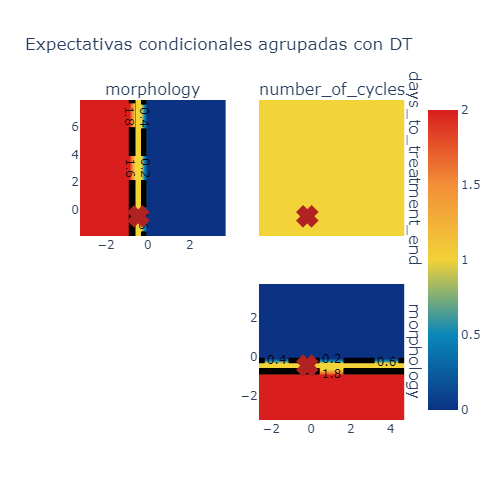

In [ ]:
local_GCE(67,'DT', C_clsDT, X_train_C_DT, X_C_DT.columns, X_test_C_DT)

Teniendo en cuenta lo siguiente:
* **Ejes**: tres características identificadas por GCE como las más importantes para una instancia concreta dentro de un modelo de Machine Learning.
   - **Eje x:** valores que toma la característica especificada en la columna del gráfico.
   - **Eje y:** valores que toma la característica especificada en la fila del gráfico.
* **Gráficas:** impacto de la interacción entre dos características importantes para una instancia concreta que determina su predicción.
* **Escala de colores:** tonalidades más cercanas al rojo indican una mayor predicción hacia la clase objetivo, mientras que tonalidades más cercanas al azul indican una menor predicción.
* **Cruz roja:** valor específico que toman las características analizadas para la instancia de estudio.

**Características con mayor importancia para la instancia 67 del modelo DT con GCE local:** number_of_cycles, morphology y days_to_treatment_end

Según el algoritmo GCE:
- La interacción entre la característica 'morphology' cuando toma valores inferiores a 0 y 'days_to_treatment_end' en todo su rango indica una predicción alta o intermedia hacia la clase objetivo.
- La interacción entre la característica 'morphology' cuando toma valores inferiores a 0 y 'number_of_cycles' en todo su rango indica una predicción alta o intermedia hacia la clase objetivo.
- La interacción entre el par de características 'number_of_cycles'-'days_to_treatment_end' indica una predicción intermedia hacia la clase objetivo en todo su rango.

#### Explicación con GCE del modelo Random Forest

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['number_of_cycles', 'morphology', 'figo_stage']


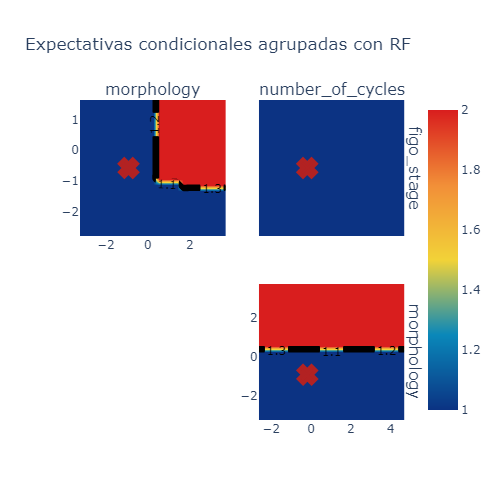

In [ ]:
X_C_RF2 = df_C2.drop('tumor_grade',axis=1)
labels_RF = X_C_RF2.columns

local_GCE(67,'RF', C_clsRF, X_train_C_RF, labels_RF, X_test_C_RF)

**Características con mayor importancia para la instancia 67 del modelo RF con GCE local:** number_of_cycles, morphology y figo_stage

Según el algoritmo GCE:
- La interacción entre la característica 'morphology' cuando toma valores superiores a 0 y 'figo_stage' toma valores superiores a -1, indica una predicción alta hacia la clase objetivo.
- La interacción entre la característica 'morphology' cuando toma valores superiores a 0 y 'number_of_cycles' en todo su rango indica una predicción alta hacia la clase objetivo.
- La interacción entre el par de características 'number_of_cycles'-'figo_stage' indica una predicción baja hacia la clase objetivo en todo su rango.

#### Explicación con GCE del modelo SVM

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['number_of_cycles', 'ajcc_clinical_m', 'figo_stage']


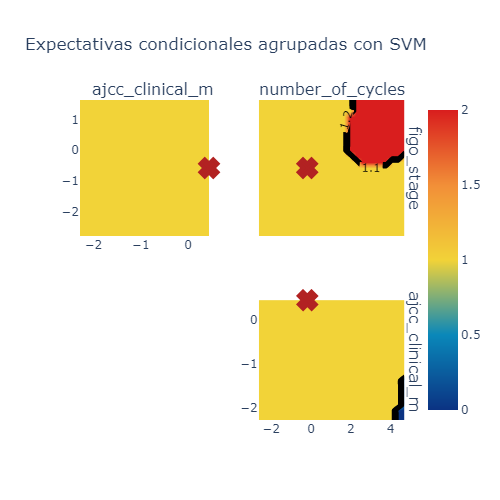

In [ ]:
local_GCE(67,'SVM', C_clsSVM, X_train_C_SVM, X_C_SVM.columns, X_test_C_SVM)

**Características con mayor importancia para la instancia 67 del modelo SVM con GCE local:** number_of_cycles, ajcc_clinical_m y figo_stage

Según el algoritmo GCE:
- La interacción entre el par de características 'ajcc_clinical_m'-'figo_stage' indica una predicción intermedia hacia la clase objetivo en todo su rango.
- La interacción entre la característica 'ajcc_clinical_m' cuando toma valores inferiores a -1 y 'number_of_cycles' toma valores superiores a 4, indica una predicción baja hacia la clase objetivo.
- La interacción entre la característica 'number_of_cycles' cuando toma valores superiores a 2 y 'figo_stage' toma valores superiores a -1, indica una predicción alta hacia la clase objetivo.

#### Explicación con GCE del modelo XGBoost

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['ajcc_clinical_t', 'age_at_index', 'age_at_diagnosis']


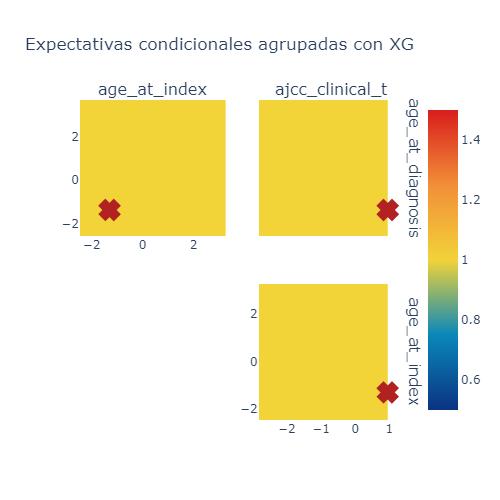

In [ ]:
X_C_XG2 = df_C2.drop('tumor_grade',axis=1)
labels_XG = X_C_XG2.columns

local_GCE(67,'XG', C_clsXG, X_train_C_XG, labels_XG, X_test_C_XG)

**Características con mayor importancia para la instancia 67 del modelo XG con GCE local:** ajcc_clinical_t, age_at_index y age_at_diagnosis

Según el algoritmo GCE, la interacción entre todos los pares de características indica una predicción intermedia hacia la clase objetivo en todo su rango.

#### Explicación con GCE del modelo MLP

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['figo_stage', 'number_of_cycles', 'age_at_diagnosis']


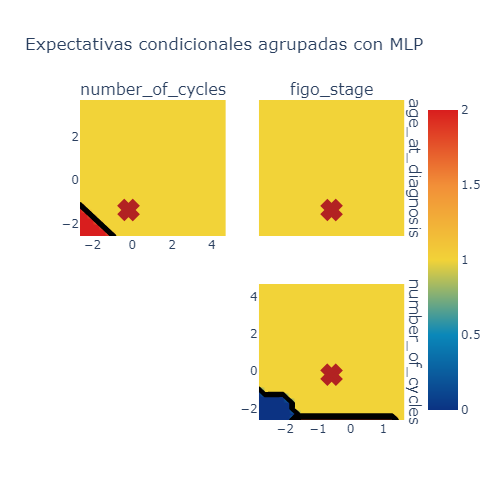

In [ ]:
X_C_MLP2 = df_C2.drop('tumor_grade',axis=1)
labels_MLP = X_C_MLP2.columns

local_GCE(67,'MLP', C_clsMLP, X_train_C_MLP, labels_MLP, X_test_C_MLP)

**Características con mayor importancia para la instancia 67 del modelo MLP con GCE local:** figo_stage, number_of_cycles y age_at_diagnosis

Según el algoritmo GCE:
- La interacción entre el par de características 'age_at_diagnosis'-'figo_stage' indica una predicción intermedia hacia la clase objetivo en todo su rango.
- La interacción entre la característica 'age_at_diagnosis' cuando toma valores inferiores a -1 y 'number_of_cycles' toma valores inferiores a -1, indica una predicción alta hacia la clase objetivo.
- La interacción entre la característica 'number_of_cycles' cuando toma valores inferiores a -1 y 'figo_stage' toma valores inferiores a 1.5, indica una predicción baja hacia la clase objetivo.

### Explicaciones globales para entender el modelo mediante métodos intrínsecos

### GLRM

In [167]:
from aix360.algorithms.rbm import GLRMExplainer, LogisticRuleRegression, FeatureBinarizer

#### Separación de los datos en conjuntos 'train' y 'test'

In [168]:
X_C_GLRM = df_C2.drop('tumor_grade',axis=1)
y_C_GLRM = df_C['tumor_grade']

X_train_C_GLRM, X_test_C_GLRM, y_train_C_GLRM, y_test_C_GLRM = train_test_split(X_C_GLRM, y_C_GLRM, test_size=0.2, random_state=1)

#### Binarización de los datos

In [169]:
FB = FeatureBinarizer(negations=True)

X_train_C_GLRM_FB = FB.fit_transform(X_train_C_GLRM)
X_test_C_GLRM_FB = FB.transform(X_test_C_GLRM)

In [170]:
print("BEFORE BINARIZER")
print(f"X_train: {X_train_C_GLRM.shape[1]} features")
print(f"X_test: {X_test_C_GLRM.shape[1]} features\n")

print("AFTER BINARIZER")
print(f"X_train: {X_train_C_GLRM_FB.shape[1]} features")
print(f"X_test: {X_test_C_GLRM_FB.shape[1]} features")

BEFORE BINARIZER
X_train: 34 features
X_test: 34 features

AFTER BINARIZER
X_train: 278 features
X_test: 278 features


### LOGISTIC MODEL

#### Importancia de características para cada clase con LogisticRuleRegression

In [307]:
def GLRM_LOGISTIC(X_train_FB, X_test_FB, y_train, y_test, class_):
    
    # Creación del modelo binario para la clase especificada
    BIN_y_train_C_GLRM_LO = (y_train ==class_).astype(int)
    BIN_y_test_C_GLRM_LO = (y_test ==class_).astype(int)

    # Entrenamiento con LogisticRuleRegression
    logistic_model = LogisticRuleRegression()
    logistic_model.fit(X_train_FB, BIN_y_train_C_GLRM_LO)

    # Creación del explicador GLRM para la clase especificada
    explainer_GLRM_LO = GLRMExplainer(logistic_model)
    explainer_GLRM_LO.fit(X_train_FB, BIN_y_train_C_GLRM_LO)

    # Predicción con el conjunto 'test'
    y_pred_C_GLRM_LO = logistic_model.predict(X_test_FB)
    
    # Importancia de las características
    importances_GLRM_LO = explainer_GLRM_LO.explain()

    importances_GLRM_LO_sorted = importances_GLRM_LO.sort_values('coefficient', ascending=False)
    df_class_importances = importances_GLRM_LO_sorted[importances_GLRM_LO_sorted['rule'] != '(intercept)']
    
    # Explicaciones del modelo GLRM para la clase especificada
    if df_class_importances.empty:
        print(f'No se encontraron características importantes para la clase {class_}.')
   
    else:
        plt.figure(figsize=(4,3))
        plt.barh(df_class_importances['rule'], df_class_importances['coefficient'], color='red')
        plt.gca().invert_yaxis()
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title(f'GLRM Feature Importance - Clase {class_}')
        plt.show()
    
    return BIN_y_test_C_GLRM_LO, y_pred_C_GLRM_LO, df_class_importances

In [308]:
BIN_GLRM_LO_y_test_0, BIN_GLRM_LO_y_pred_0, BIN_GLRM_LO_importances_0 = GLRM_LOGISTIC(X_train_C_GLRM_FB, X_test_C_GLRM_FB, y_train_C_GLRM, y_test_C_GLRM, 0)

No se encontraron características importantes para la clase 0.


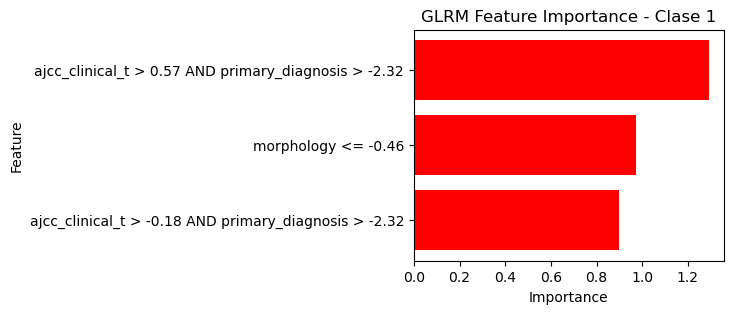

,rule,coefficient
1,ajcc_clinical_t > 0.57 AND primary_diagnosis >...,1.292675
2,morphology <= -0.46,0.971977
3,ajcc_clinical_t > -0.18 AND primary_diagnosis ...,0.89943


In [309]:
BIN_GLRM_LO_y_test_1, BIN_GLRM_LO_y_pred_1, BIN_GLRM_LO_importances_1 = GLRM_LOGISTIC(X_train_C_GLRM_FB, X_test_C_GLRM_FB, y_train_C_GLRM, y_test_C_GLRM, 1)
BIN_GLRM_LO_importances_1

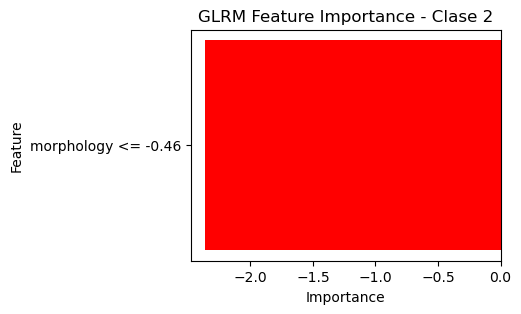

,rule,coefficient
1,morphology <= -0.46,-2.358957


In [310]:
BIN_GLRM_LO_y_test_2, BIN_GLRM_LO_y_pred_2, BIN_GLRM_LO_importances_2 = GLRM_LOGISTIC(X_train_C_GLRM_FB, X_test_C_GLRM_FB, y_train_C_GLRM, y_test_C_GLRM, 2)
BIN_GLRM_LO_importances_2

In [311]:
BIN_GLRM_LO_y_test_3, BIN_GLRM_LO_y_pred_3, BIN_GLRM_LO_importances_3 = GLRM_LOGISTIC(X_train_C_GLRM_FB, X_test_C_GLRM_FB, y_train_C_GLRM, y_test_C_GLRM, 3)

No se encontraron características importantes para la clase 3.


In [312]:
BIN_GLRM_LO_y_test_4, BIN_GLRM_LO_y_pred_4, BIN_GLRM_LO_importances_4 = GLRM_LOGISTIC(X_train_C_GLRM_FB, X_test_C_GLRM_FB, y_train_C_GLRM, y_test_C_GLRM, 4)

No se encontraron características importantes para la clase 4.


GLRM se trata de un modelo basado en reglas, las cuales se caracterizan por tener una o múltiples condiciones sobre los valores de las características. Estas condiciones se combinan para formar reglas complejas que el modelo utiliza para hacer predicciones.

Las reglas del modelo GLRM con LogisticRuleRegression que combinan múltiples características son de orden superior, lo que significa que el modelo es capaz de capturar interacciones entre dichas características. Mientras que las reglas de única condición son de orden inferior, lo que significa que sólo se está considerando una característica individual, sin capturar interacciones con otras características.

En las salidas anteriores se muestran las reglas aprendidas por el modelo GLRM con LogisticRuleRegression con sus correspondientes coeficientes, los cuales representan el impacto que tiene cada regla sobre el modelo. En función de las reglas que se cumplan, se predice una categoría u otra de la clasificación multiclase. Cabe destacar que no se han encontrado características importantes que ayuden a identificar las clases 0, 3 y 4.

Según este modelo, el par de características 'ajcc_clinical_t'-'primary_diagnosis', en función del rango en que se encuentren, afecta al modelo aumentando la probabilidad de pertenencia a la clase objetivo en 1.29 o 0.9 unidades para la clase 1. Además, la característica 'morphology' en el rango especificado afecta al modelo aumentando la probabilidad de pertenencia a la clase objetivo en 0.97 unidades para la clase 1. Sin embargo, la característica 'morphology' en el rango especificado afecta al modelo disminuyendo la probabilidad de pertenencia a la clase objetivo en 2.36 unidades para la clase 2.

#### Comparativa del rendimiento de GLRM con LogisticRuleRegression para cada clase

In [278]:
accuracy_GLRM_LO = {"0": round((accuracy_score(BIN_GLRM_LO_y_test_0, BIN_GLRM_LO_y_pred_0))*100,2),
                    "1": round((accuracy_score(BIN_GLRM_LO_y_test_1, BIN_GLRM_LO_y_pred_1))*100,2),
                    "2": round((accuracy_score(BIN_GLRM_LO_y_test_2, BIN_GLRM_LO_y_pred_2))*100,2),
                    "3": round((accuracy_score(BIN_GLRM_LO_y_test_3, BIN_GLRM_LO_y_pred_3))*100,2),
                    "4": round((accuracy_score(BIN_GLRM_LO_y_test_4, BIN_GLRM_LO_y_pred_4))*100,2)}

results_GLRM_LO = pd.DataFrame(list(accuracy_GLRM_LO.items()), columns=['Clase', 'Accuracy (%)'])
results_GLRM_LO

,Clase,Accuracy (%)
0,0,94.32
1,1,67.96
2,2,68.22
3,3,97.93
4,4,99.48


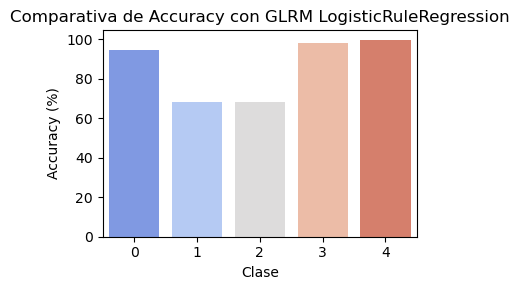

In [283]:
plt.figure(figsize=(4,3))
sns.barplot(x='Clase', y='Accuracy (%)', data=results_GLRM_LO, palette='coolwarm')

plt.title('Comparativa de Accuracy con GLRM LogisticRuleRegression')
plt.xlabel('Clase')
plt.ylabel('Accuracy (%)')

plt.tight_layout()
plt.show()

Según la métrica 'accuracy', el modelo GLRM con LogisticRuleRegression proporciona una mejor clasificación para la clase 4 (99,48%) y una peor clasificación para la clase 1 (67,96%). En rasgos generales, este modelo clasifica correctamente el 85,58% de las instancias totales.

### BRCG

In [324]:
from aix360.algorithms.rbm import BRCGExplainer, BooleanRuleCG

#### Separación de los datos en conjuntos 'train' y 'test'

In [325]:
X_C_BRCG = df_C2.drop('tumor_grade',axis=1)
y_C_BRCG = df_C['tumor_grade']

X_train_C_BRCG, X_test_C_BRCG, y_train_C_BRCG, y_test_C_BRCG = train_test_split(X_C_BRCG, y_C_BRCG, test_size=0.2, random_state=1)

#### Binarización de los datos

In [326]:
FB = FeatureBinarizer(negations=True)

X_train_C_BRCG_FB = FB.fit_transform(X_train_C_BRCG)
X_test_C_BRCG_FB = FB.transform(X_test_C_BRCG)

In [327]:
print("BEFORE BINARIZER")
print(f"X_train: {X_train_C_BRCG.shape[1]} features")
print(f"X_test: {X_test_C_BRCG.shape[1]} features\n")

print("AFTER BINARIZER")
print(f"X_train: {X_train_C_BRCG_FB.shape[1]} features")
print(f"X_test: {X_test_C_BRCG_FB.shape[1]} features")

BEFORE BINARIZER
X_train: 34 features
X_test: 34 features

AFTER BINARIZER
X_train: 278 features
X_test: 278 features


#### Importancia de características para cada clase con BooleanRuleCG

In [352]:
def BRCG_BOOLEAN(X_train_FB, X_test_FB, y_train, y_test, class_):
    
    # Creación del modelo binario para la clase especificada
    BIN_y_train_C_BRGC = (y_train == class_).astype(int)
    BIN_y_test_C_BRGC = (y_test == class_).astype(int)

    # Entrenamiento con BooleanRuleCG
    boolean_model = BooleanRuleCG(silent=True)
    boolean_model.fit(X_train_FB, BIN_y_train_C_BRGC)

    # Creación del explicador BRCG para la clase especificada
    explainer_BRCG = BRCGExplainer(boolean_model)
    explainer_BRCG.fit(X_train_FB, BIN_y_train_C_BRGC)

    # Predicción con el conjunto 'test'
    y_pred_C_BRGC = boolean_model.predict(X_test_FB)

    # Importancia de las características
    importances_BRCG = explainer_BRCG.explain()
    
    isCNF = f'Si se cumple alguna de las siguientes reglas, el modelo no predice la clase {class_}'
    notCNF = f'Si se cumple alguna de las siguientes reglas, el modelo predice la clase {class_}'
    
    if not importances_BRCG['rules']:
        print(f'No se encontraron características importantes para la clase {class_}.')
    else:
        print(isCNF if importances_BRCG['isCNF'] else notCNF)
        print()

        for rule in importances_BRCG['rules']:
            print(f'  * {rule}')
            
    return BIN_y_test_C_BRGC, y_pred_C_BRGC

In [354]:
BIN_BRCG_y_test_0, BIN_BRCG_y_pred_0 = BRCG_BOOLEAN(X_train_C_BRCG_FB, X_test_C_BRCG_FB, y_train_C_BRCG, y_test_C_BRCG, 0)

Si se cumple alguna de las siguientes reglas, el modelo predice la clase 0

  * ajcc_clinical_t <= -2.45 AND morphology > 0.01
  * ajcc_pathologic_t <= -2.19 AND days_to_last_follow_up > -0.64 AND number_of_cycles <= -1.41 AND treatment_or_therapy == -1.2482792388728807
  * age_at_index <= -1.30 AND year_of_birth > 1.07 AND ajcc_clinical_t <= -0.56 AND primary_diagnosis <= 0.37


In [355]:
BIN_BRCG_y_test_1, BIN_BRCG_y_pred_1 = BRCG_BOOLEAN(X_train_C_BRCG_FB, X_test_C_BRCG_FB, y_train_C_BRCG, y_test_C_BRCG, 1)

Si se cumple alguna de las siguientes reglas, el modelo predice la clase 1

  * prior_malignancy == 10.039396081648066
  * ajcc_clinical_t > 0.57 AND morphology <= 0.01
  * race > -1.66 AND age_at_diagnosis > -0.08 AND figo_stage <= 1.09 AND icd_10_code > -3.69 AND primary_diagnosis > -2.32 AND initial_disease_status <= 3.08 AND number_of_cycles > -2.63


In [356]:
BIN_BRCG_y_test_2, BIN_BRCG_y_pred_2 = BRCG_BOOLEAN(X_train_C_BRCG_FB, X_test_C_BRCG_FB, y_train_C_BRCG, y_test_C_BRCG, 2)

Si se cumple alguna de las siguientes reglas, el modelo predice la clase 2

  * age_at_index > 1.35 AND ajcc_clinical_t <= -0.18
  * icd_10_code <= -3.69 AND morphology > -0.46
  * morphology > -0.46 AND initial_disease_status > 3.08
  * figo_stage > 0.81 AND morphology > 0.01
  * age_at_index > 0.19 AND age_at_diagnosis <= 0.47 AND figo_stage > -1.42 AND morphology > -0.46
  * year_of_birth > 0.39 AND ajcc_pathologic_m > -1.15 AND figo_stage > -1.42 AND morphology > -0.46


In [357]:
BIN_BRCG_y_test_3, BIN_BRCG_y_pred_3 = BRCG_BOOLEAN(X_train_C_BRCG_FB, X_test_C_BRCG_FB, y_train_C_BRCG, y_test_C_BRCG, 3)

Si se cumple alguna de las siguientes reglas, el modelo predice la clase 3

  * morphology <= -0.92 AND initial_disease_status > -0.21


In [353]:
BIN_BRCG_y_test_4, BIN_BRCG_y_pred_4 = BRCG_BOOLEAN(X_train_C_BRCG_FB, X_test_C_BRCG_FB, y_train_C_BRCG, y_test_C_BRCG, 4)

No se encontraron características importantes para la clase 4.


BRCG se trata de un modelo basado en reglas, las cuales se caracterizan por tener múltiples condiciones sobre los valores de las características. Estas condiciones se combinan para formar reglas complejas que el modelo utiliza para hacer predicciones.

La mayoría de reglas del modelo BRCG con BooleanRuleCG son de orden superior, es decir, combinaciones de múltiples características, lo que significa que el modelo es capaz de capturar interacciones entre dichas características. Sin embargo, para la clase 1 existe una regla de orden inferior (prior_malignancy == 10.039), es decir, una condición donde sólo se está considerando una característica individual, sin capturar interacciones con otras características.

En las salidas anteriores se muestran las reglas aprendidas por el modelo BRCG que, en función de las que se cumplan, se predice una categoría u otra de la clasificación multiclase. Cabe destacar que no se han encontrado características importantes que ayuden a identificar la clase 4.

#### Comparativa del rendimiento de BRCG con BooleanRuleCG para cada clase

In [358]:
accuracy_BRCG = {"0": round((accuracy_score(BIN_BRCG_y_test_0, BIN_BRCG_y_pred_0))*100,2),
                 "1": round((accuracy_score(BIN_BRCG_y_test_1, BIN_BRCG_y_pred_1))*100,2),
                 "2": round((accuracy_score(BIN_BRCG_y_test_2, BIN_BRCG_y_pred_2))*100,2),
                 "3": round((accuracy_score(BIN_BRCG_y_test_3, BIN_BRCG_y_pred_3))*100,2),
                 "4": round((accuracy_score(BIN_BRCG_y_test_4, BIN_BRCG_y_pred_4))*100,2)}

results_BRCG = pd.DataFrame(list(accuracy_BRCG.items()), columns=['Clase', 'Accuracy (%)'])
results_BRCG

,Clase,Accuracy (%)
0,0,96.38
1,1,65.37
2,2,74.16
3,3,97.93
4,4,99.48


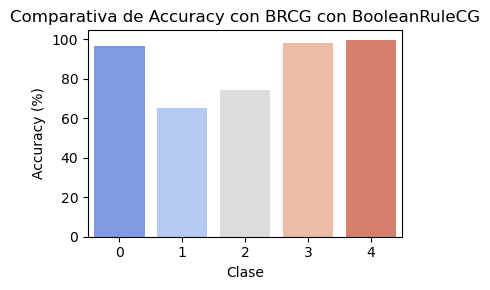

In [359]:
plt.figure(figsize=(4,3))
sns.barplot(x='Clase', y='Accuracy (%)', data=results_BRCG, palette='coolwarm')

plt.title('Comparativa de Accuracy con BRCG con BooleanRuleCG')
plt.xlabel('Clase')
plt.ylabel('Accuracy (%)')

plt.tight_layout()
plt.show()

Según la métrica 'accuracy', el modelo BRCG con BooleanRuleCG proporciona una mejor clasificación para la clase 4 (99,48%) y una peor clasificación para la clase 1 (65,37%). En rasgos generales, este modelo clasifica correctamente el 86,67% de las instancias totales.